# Paired Contrastive Alignment: H&E Image Patches ↔ Spatial Gene Expression

In this notebook, we train two neural networks to align two measurements from the same Visium spatial-transcriptomics spot:

$$
x_i^{\mathrm{image}}
=
\text{H\&E image patch around spot } i
$$

$$
x_i^{\mathrm{RNA}}
=
\text{gene-expression profile at spot } i.
$$

The goal is to learn embeddings

$$
z_i^{\mathrm{image}}
=
f_{\mathrm{image}}
\left(
x_i^{\mathrm{image}}
\right)
$$

$$
z_i^{\mathrm{RNA}}
=
f_{\mathrm{RNA}}
\left(
x_i^{\mathrm{RNA}}
\right)
$$

such that the image patch and RNA profile from the same spatial spot can retrieve one another:

$$
z_i^{\mathrm{image}}
\;\rightarrow\!\!\leftarrow\;
z_i^{\mathrm{RNA}}.
$$

We will use the public 10x Visium human breast-cancer dataset.

> Important: a Visium spot measures local tissue morphology and local gene expression. A spot may contain multiple cells, so this is not a single-cell image-to-transcriptome model.

In [1]:
# ============================================================
# 1 — Load libraries and set reproducibility
# ============================================================

# Uncomment only if packages are missing:
# %pip install scanpy anndata torch torchvision scikit-learn pillow matplotlib

from __future__ import annotations

import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scanpy as sc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet18, ResNet18_Weights


# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------
SEED = 7

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
elif torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
else:
    DEVICE = torch.device("cpu")

print(f"Scanpy version: {sc.__version__}")
print(f"PyTorch version: {torch.__version__}")
print(f"Using device: {DEVICE}")

Scanpy version: 1.10.2
PyTorch version: 2.3.1
Using device: cuda


## 2 — Load paired spatial image and gene-expression data

Each Visium spot gives one known pair:

$$
x_i^{\mathrm{image}}
=
\text{H\&E patch around spatial spot } i
$$

$$
x_i^{\mathrm{RNA}}
=
\text{gene-expression profile measured at the same spot } i.
$$

The spatial coordinates tell us where each RNA profile belongs on the tissue image. This gives the known correspondence used as supervision for contrastive alignment.

In [2]:
# ============================================================
# 2 — Load public Visium breast-cancer data
# ============================================================

DATASET_ID = "V1_Breast_Cancer_Block_A_Section_1"

adata = sc.datasets.visium_sge(
    sample_id=DATASET_ID,
    include_hires_tiff=False,
)

adata.var_names_make_unique()

# Keep only spots covered by tissue.
adata = adata[adata.obs["in_tissue"].astype(int) == 1].copy()

print(adata)
print()
print("Number of tissue spots:", adata.n_obs)
print("Number of genes:", adata.n_vars)
print("Spatial-coordinate shape:", adata.obsm["spatial"].shape)
print("Available image resolutions:",
      list(adata.uns["spatial"][DATASET_ID]["images"].keys()))

/home/tiamheydari/anaconda3/envs/nn_copy/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/tiamheydari/anaconda3/envs/nn_copy/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Number of tissue spots: 3798
Number of genes: 36601
Spatial-coordinate shape: (3798, 2)
Available image resolutions: ['hires', 'lowres']


## 2.2 — Inspect a few known image–RNA pairs

Before constructing mini-batches, inspect what one known paired observation means in this dataset.

$$
x_i^{\mathrm{image}}
=
\text{local H\&E image patch around spot } i
$$

$$
x_i^{\mathrm{RNA}}
=
\text{gene-expression profile measured at the same spot } i.
$$

The shared index $i$ is the known correspondence:

$$
x_i^{\mathrm{image}}
\leftrightarrow
x_i^{\mathrm{RNA}}.
$$

Library ID: V1_Breast_Cancer_Block_A_Section_1
H&E image shape: (2000, 2000, 3)
Number of tissue spots: 3798
Number of genes: 36601
Coordinate array shape: (3798, 2)


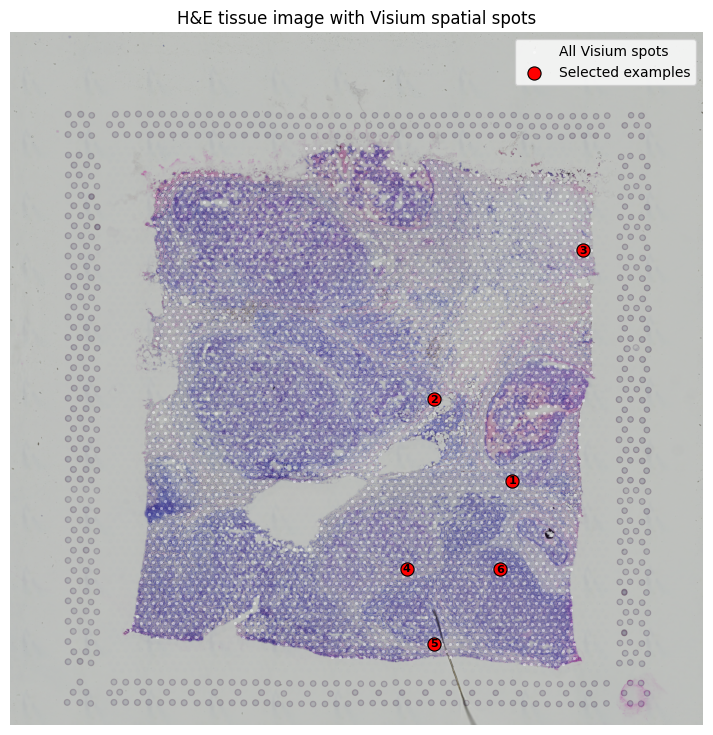

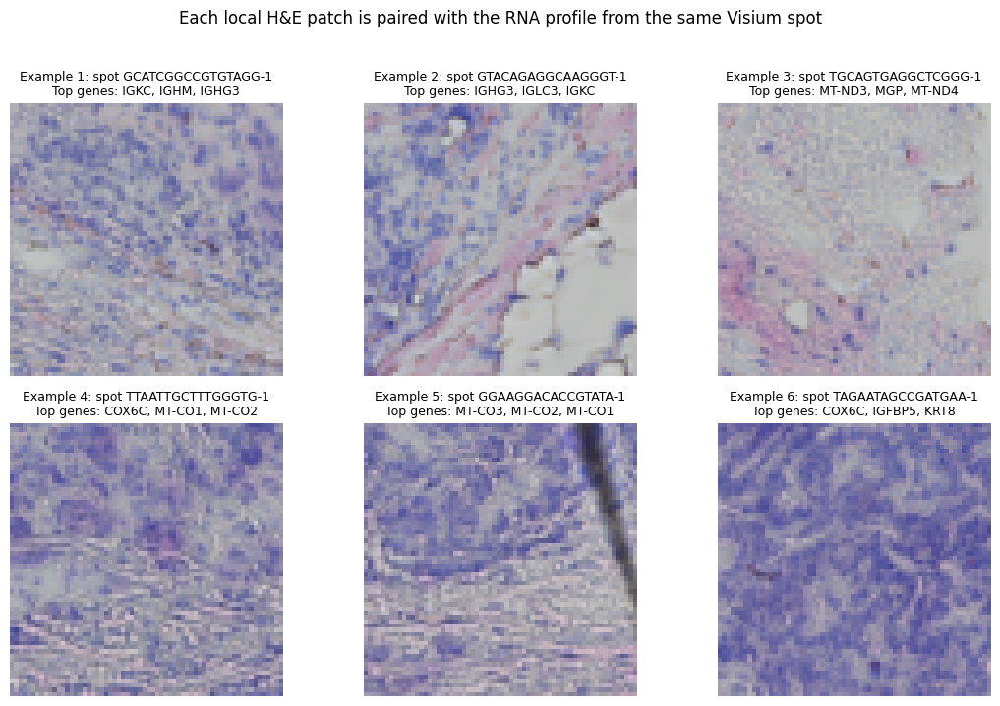

Example 1
Spot barcode: GCATCGGCCGTGTAGG-1
Hires coordinate: [1449.3 1295.4]
Detected genes: 803

  gene  count
  IGKC   80.0
  IGHM   26.0
 IGHG3   22.0
   FTL   16.0
 IGLC2   13.0
  CD74   13.0
TMSB10   13.0
MT-ND4   11.0
Example 2
Spot barcode: GTACAGAGGCAAGGGT-1
Hires coordinate: [1224.3 1059.7]
Detected genes: 4,376

  gene  count
 IGHG3  186.0
 IGLC3   97.0
  IGKC   95.0
 COX6C   90.0
 IGLC2   87.0
MT-CO3   86.0
 IGHG4   84.0
 KRT19   81.0
Example 3
Spot barcode: TGCAGTGAGGCTCGGG-1
Hires coordinate: [1653.2  629.3]
Detected genes: 1,210

  gene  count
MT-ND3   15.0
   MGP   14.0
MT-ND4   14.0
 RPL41   14.0
MT-CO3   13.0
 KRT19   12.0
   FTL   12.0
MT-CO1   11.0
Example 4
Spot barcode: TTAATTGCTTTGGGTG-1
Hires coordinate: [1144.6 1549.6]
Detected genes: 6,045

   gene  count
  COX6C  337.0
 MT-CO1  323.0
 MT-CO2  262.0
 MT-CO3  238.0
MT-ATP6  171.0
 MT-ND4  166.0
  RPL41  160.0
 MT-ND1  153.0
Example 5
Spot barcode: GGAAGGACACCGTATA-1
Hires coordinate: [1223.1 1765.3]
Detected gen

In [3]:
# ============================================================
# 3 — Inspect paired H&E-image and RNA observations
# ============================================================

# Scanpy stores the Visium image and its metadata under this library ID.
LIBRARY_ID = next(iter(adata.uns["spatial"]))
spatial_meta = adata.uns["spatial"][LIBRARY_ID]

# ------------------------------------------------------------
# Extract the H&E image
# ------------------------------------------------------------
hires_image = np.asarray(spatial_meta["images"]["hires"])

# Make sure image values are in [0, 1] for plotting.
if hires_image.max() > 1:
    hires_image = hires_image.astype(np.float32) / 255.0
else:
    hires_image = hires_image.astype(np.float32)

# Visium coordinates are stored in full-resolution image pixels.
# Convert them into coordinates of the stored hires image.
hires_scale = spatial_meta["scalefactors"]["tissue_hires_scalef"]

coords_fullres = np.asarray(adata.obsm["spatial"], dtype=np.float32)
coords_hires = coords_fullres * hires_scale

print(f"Library ID: {LIBRARY_ID}")
print(f"H&E image shape: {hires_image.shape}")
print(f"Number of tissue spots: {adata.n_obs}")
print(f"Number of genes: {adata.n_vars}")
print(f"Coordinate array shape: {coords_hires.shape}")


# ------------------------------------------------------------
# Select a few example spots
# ------------------------------------------------------------
RNG = np.random.default_rng(SEED)

N_EXAMPLES = 6
example_idx = RNG.choice(
    adata.n_obs,
    size=N_EXAMPLES,
    replace=False,
)


# ------------------------------------------------------------
# Plot the full H&E image and all Visium spot centres
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(9, 9))

ax.imshow(hires_image)

# All tissue spots
ax.scatter(
    coords_hires[:, 0],
    coords_hires[:, 1],
    s=5,
    c="white",
    alpha=0.45,
    linewidths=0,
    label="All Visium spots",
)

# Selected examples
ax.scatter(
    coords_hires[example_idx, 0],
    coords_hires[example_idx, 1],
    s=90,
    c="red",
    edgecolors="black",
    linewidths=0.8,
    label="Selected examples",
)

for number, idx in enumerate(example_idx, start=1):
    ax.text(
        coords_hires[idx, 0],
        coords_hires[idx, 1],
        str(number),
        ha="center",
        va="center",
        fontsize=8,
        fontweight="bold",
    )

ax.set_title("H&E tissue image with Visium spatial spots")
ax.legend(loc="upper right")
ax.axis("off")
plt.show()


# ------------------------------------------------------------
# Helper: crop one local H&E patch around a spot
# ------------------------------------------------------------
PATCH_SIZE = 64

def crop_he_patch(image, centre_xy, patch_size=PATCH_SIZE):
    """
    Extract one square H&E patch centred on a Visium spot.

    centre_xy uses image coordinates:
    x = horizontal pixel coordinate
    y = vertical pixel coordinate
    """
    if patch_size % 2 != 0:
        raise ValueError("PATCH_SIZE must be even.")

    half = patch_size // 2

    # Reflection padding makes border spots safe to crop.
    padded_image = np.pad(
        image,
        ((half, half), (half, half), (0, 0)),
        mode="reflect",
    )

    x, y = np.rint(centre_xy).astype(int)
    x += half
    y += half

    patch = padded_image[
        y - half : y + half,
        x - half : x + half,
    ]

    return patch


# ------------------------------------------------------------
# Helper: read and summarize one RNA profile
# ------------------------------------------------------------
def expression_vector(spot_idx):
    """Return one spot's expression vector as a dense 1D NumPy array."""
    x = adata.X[spot_idx]

    if hasattr(x, "toarray"):
        x = x.toarray()

    return np.asarray(x).ravel()


def top_expressed_genes(spot_idx, n_top_genes=8):
    """Return the top expressed genes at one spot."""
    x = expression_vector(spot_idx)

    top_gene_idx = np.argsort(x)[-n_top_genes:][::-1]

    return pd.DataFrame(
        {
            "gene": adata.var_names[top_gene_idx],
            "count": x[top_gene_idx],
        }
    )


# ------------------------------------------------------------
# Show local H&E patches and print paired RNA summaries
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 3, figsize=(11, 7))

for number, (ax, idx) in enumerate(zip(axes.flat, example_idx), start=1):
    patch = crop_he_patch(hires_image, coords_hires[idx])

    top_genes = top_expressed_genes(idx, n_top_genes=3)
    gene_label = ", ".join(top_genes["gene"].tolist())

    ax.imshow(patch)
    ax.set_title(
        f"Example {number}: spot {adata.obs_names[idx]}\n"
        f"Top genes: {gene_label}",
        fontsize=9,
    )
    ax.axis("off")

plt.suptitle(
    "Each local H&E patch is paired with the RNA profile from the same Visium spot",
    y=1.02,
)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Print the paired RNA examples clearly
# ------------------------------------------------------------
for number, idx in enumerate(example_idx, start=1):
    x = expression_vector(idx)

    print("=" * 72)
    print(f"Example {number}")
    print(f"Spot barcode: {adata.obs_names[idx]}")
    print(f"Hires coordinate: {coords_hires[idx].round(1)}")
    print(f"Detected genes: {(x > 0).sum():,}")
    print()
    print(top_expressed_genes(idx, n_top_genes=8).to_string(index=False))

In [4]:
# ------------------------------------------------------------
# Build an RNA-only UMAP for visualization
# ------------------------------------------------------------
# This UMAP is only to visualize the gene-expression profiles.
# It is NOT the learned contrastive representation we will train later.

adata_umap = adata.copy()

sc.pp.normalize_total(adata_umap, target_sum=1e4)
sc.pp.log1p(adata_umap)

sc.pp.highly_variable_genes(
    adata_umap,
    flavor="seurat",
    n_top_genes=2000,
)

sc.pp.pca(
    adata_umap,
    n_comps=50,
    use_highly_variable=True,
)

sc.pp.neighbors(
    adata_umap,
    n_neighbors=15,
    n_pcs=30,
)

sc.tl.umap(
    adata_umap,
    random_state=SEED,
)

rna_umap = adata_umap.obsm["X_umap"]

print(f"RNA UMAP shape: {rna_umap.shape}")

/home/tiamheydari/anaconda3/envs/nn_copy/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:385: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/home/tiamheydari/anaconda3/envs/nn_copy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


RNA UMAP shape: (3798, 2)


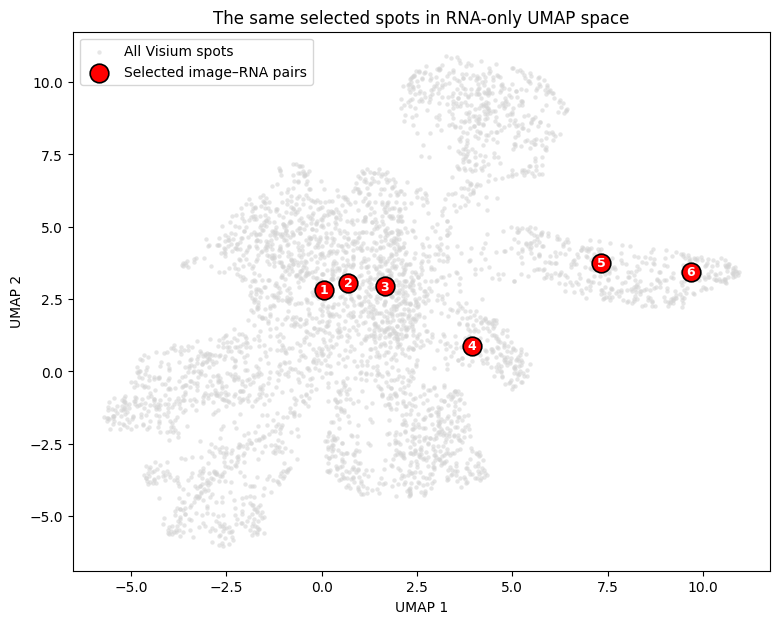

In [5]:
# ------------------------------------------------------------
# Plot the same selected spots in RNA-only UMAP space
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(9, 7))

# Every point is one Visium spot, represented only by its RNA profile.
ax.scatter(
    rna_umap[:, 0],
    rna_umap[:, 1],
    s=10,
    c="lightgray",
    alpha=0.55,
    linewidths=0,
    label="All Visium spots",
)

# These are the EXACT same indices used for the H&E patches.
ax.scatter(
    rna_umap[example_idx, 0],
    rna_umap[example_idx, 1],
    s=180,
    c="red",
    edgecolors="black",
    linewidths=1.2,
    zorder=3,
    label="Selected image–RNA pairs",
)

# Use the same numbers as on the tissue image and patch panel.
for number, idx in enumerate(example_idx, start=1):
    ax.text(
        rna_umap[idx, 0],
        rna_umap[idx, 1],
        str(number),
        ha="center",
        va="center",
        fontsize=9,
        fontweight="bold",
        color="white",
        zorder=4,
    )

ax.set_title("The same selected spots in RNA-only UMAP space")
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.legend(loc="best")
plt.show()

## 3 — Build a mini-batch of paired observations

Contrastive alignment does not compare one H&E patch with one RNA profile in isolation.

Instead, training uses a mini-batch containing $m$ known image–RNA pairs:

$$
\mathcal{B}
=
\left\{
\left(
x_1^{\mathrm{image}},
x_1^{\mathrm{RNA}}
\right),
\ldots,
\left(
x_m^{\mathrm{image}},
x_m^{\mathrm{RNA}}
\right)
\right\}.
$$

Within this mini-batch, the image patch and RNA profile with the same batch index belong to the same Visium spot:

$$
x_i^{\mathrm{image}}
\leftrightarrow
x_i^{\mathrm{RNA}}.
$$

The matching pairs are therefore the diagonal pairs:

$$
\left(
x_1^{\mathrm{image}},
x_1^{\mathrm{RNA}}
\right),
\left(
x_2^{\mathrm{image}},
x_2^{\mathrm{RNA}}
\right),
\ldots,
\left(
x_m^{\mathrm{image}},
x_m^{\mathrm{RNA}}
\right).
$$

Here, the index $i$ is the local position of an observation inside the current mini-batch. It is not the original Visium spot barcode.

Later, each H&E patch will be compared with every RNA profile in the same mini-batch. The known matching RNA profile is the correct answer.

Mini-batch size m: 32
H&E image batch, NumPy format: (32, 64, 64, 3)
H&E image batch, PyTorch format: (32, 3, 64, 64)
RNA count batch: (32, 36601)


,local batch index i,Visium spot barcode,dataset spot index,detected genes
0,0,GATATGCGGTAGCCAA-1,2096,2273
1,1,CAACGGTTCTTGATAC-1,963,6121
2,2,CTGCCTAGCCACCAAG-1,1809,9682
3,3,GCCACAATTTAAGGAC-1,2205,7632
4,4,TCGAATATCCCGCAGG-1,3209,7188
5,5,TATTATGTTTGCCTGC-1,3061,7845
6,6,GTGATCACTAACGCCT-1,2719,3422
7,7,CCCTCGATAATACACA-1,1293,8162
8,8,TCAACCATGTTCGGGC-1,3082,4715
9,9,GTCAGTTGTGCTCGTT-1,2655,7826


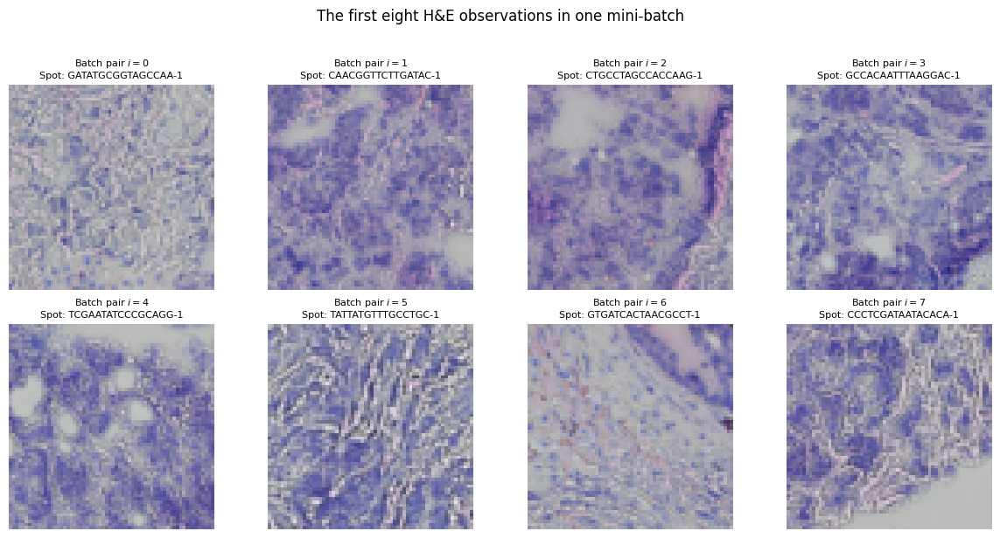

In [6]:
# ============================================================
# 3 — Build a mini-batch of known image–RNA pairs
# ============================================================

# We use a small batch here so we can inspect it visually.
# During training, we will use a larger batch size.
M = 32

# These are dataset-level spot indices.
# They tell us which physical Visium spots enter this batch.
batch_global_idx = RNG.choice(
    adata.n_obs,
    size=M,
    replace=False,
)

# ------------------------------------------------------------
# Build the image part of the batch
# ------------------------------------------------------------
# Shape before PyTorch conversion:
# (mini-batch size, image height, image width, colour channels)

image_batch_np = np.stack(
    [
        crop_he_patch(
            hires_image,
            coords_hires[global_idx],
            patch_size=PATCH_SIZE,
        )
        for global_idx in batch_global_idx
    ],
    axis=0,
).astype(np.float32)


# ------------------------------------------------------------
# Build the RNA part of the batch
# ------------------------------------------------------------
# At this stage, these are still raw count vectors.
# We will normalize, select genes, and standardize them later.

rna_batch_counts = adata.X[batch_global_idx]

if hasattr(rna_batch_counts, "toarray"):
    rna_batch_counts = rna_batch_counts.toarray()

rna_batch_counts = np.asarray(
    rna_batch_counts,
    dtype=np.float32,
)


# ------------------------------------------------------------
# Convert images into PyTorch format
# ------------------------------------------------------------
# NumPy images:  (M, H, W, C)
# PyTorch images: (M, C, H, W)

image_batch_tensor = torch.from_numpy(
    np.transpose(image_batch_np, (0, 3, 1, 2)).copy()
).float()

rna_batch_tensor = torch.from_numpy(
    rna_batch_counts.copy()
).float()


# ------------------------------------------------------------
# Print the concrete batch structure
# ------------------------------------------------------------
print("Mini-batch size m:", M)
print("H&E image batch, NumPy format:", image_batch_np.shape)
print("H&E image batch, PyTorch format:", tuple(image_batch_tensor.shape))
print("RNA count batch:", tuple(rna_batch_tensor.shape))


# ------------------------------------------------------------
# Make the known pairing explicit
# ------------------------------------------------------------
batch_table = pd.DataFrame(
    {
        "local batch index i": np.arange(M),
        "Visium spot barcode": adata.obs_names[batch_global_idx].to_numpy(),
        "dataset spot index": batch_global_idx,
        "detected genes": (rna_batch_counts > 0).sum(axis=1),
    }
)

display(batch_table.head(10))


# ------------------------------------------------------------
# Visualize the first few pairs in this mini-batch
# ------------------------------------------------------------
N_SHOW = 8

fig, axes = plt.subplots(2, 4, figsize=(12, 6))

for local_i, ax in enumerate(axes.flat[:N_SHOW]):
    global_idx = batch_global_idx[local_i]

    ax.imshow(image_batch_np[local_i])
    ax.set_title(
        f"Batch pair $i={local_i}$\n"
        f"Spot: {adata.obs_names[global_idx]}",
        fontsize=8,
    )
    ax.axis("off")

plt.suptitle(
    "The first eight H&E observations in one mini-batch",
    y=1.02,
)
plt.tight_layout()
plt.show()

## 4 — Define the known positive pairs

Inside a mini-batch, the pairing is already known from the experiment.

The H&E patch and RNA profile at the same local batch index come from the same Visium spot:

$$
x_i^{\mathrm{image}}
\leftrightarrow
x_i^{\mathrm{RNA}}.
$$

Therefore, for image query $x_i^{\mathrm{image}}$, the correct RNA answer is:

$$
x_i^{\mathrm{RNA}}.
$$

For example, in a batch of $m=32$ pairs:

$$
x_0^{\mathrm{image}}
\leftrightarrow
x_0^{\mathrm{RNA}}
$$

$$
x_1^{\mathrm{image}}
\leftrightarrow
x_1^{\mathrm{RNA}}
$$

$$
\vdots
$$

$$
x_{31}^{\mathrm{image}}
\leftrightarrow
x_{31}^{\mathrm{RNA}}.
$$

These are called the **positive pairs**.

This correspondence is not inferred by the contrastive loss. It is given by the dataset: the image patch and RNA profile were measured at the same spatial spot.

Positive retrieval targets:
tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])

First 10 known positive pairs:
local batch index  0: image[0] ↔ RNA[0] | Visium spot = GATATGCGGTAGCCAA-1
local batch index  1: image[1] ↔ RNA[1] | Visium spot = CAACGGTTCTTGATAC-1
local batch index  2: image[2] ↔ RNA[2] | Visium spot = CTGCCTAGCCACCAAG-1
local batch index  3: image[3] ↔ RNA[3] | Visium spot = GCCACAATTTAAGGAC-1
local batch index  4: image[4] ↔ RNA[4] | Visium spot = TCGAATATCCCGCAGG-1
local batch index  5: image[5] ↔ RNA[5] | Visium spot = TATTATGTTTGCCTGC-1
local batch index  6: image[6] ↔ RNA[6] | Visium spot = GTGATCACTAACGCCT-1
local batch index  7: image[7] ↔ RNA[7] | Visium spot = CCCTCGATAATACACA-1
local batch index  8: image[8] ↔ RNA[8] | Visium spot = TCAACCATGTTCGGGC-1
local batch index  9: image[9] ↔ RNA[9] | Visium spot = GTCAGTTGTGCTCGTT-1


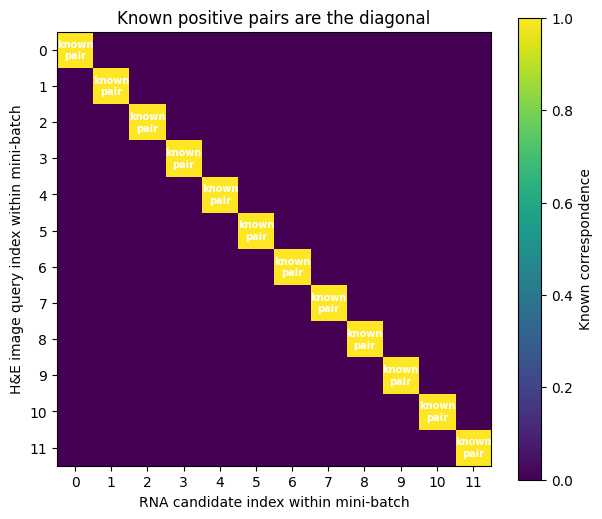

,local image index i,correct RNA index,shared Visium spot barcode
0,0,0,GATATGCGGTAGCCAA-1
1,1,1,CAACGGTTCTTGATAC-1
2,2,2,CTGCCTAGCCACCAAG-1
3,3,3,GCCACAATTTAAGGAC-1
4,4,4,TCGAATATCCCGCAGG-1
5,5,5,TATTATGTTTGCCTGC-1
6,6,6,GTGATCACTAACGCCT-1
7,7,7,CCCTCGATAATACACA-1
8,8,8,TCAACCATGTTCGGGC-1
9,9,9,GTCAGTTGTGCTCGTT-1


In [7]:
# ============================================================
# 4 — Define the known positive pairs
# ============================================================

# The local batch position is the pairing label.
#
# For local image index i:
#   image_batch_tensor[i]
#
# the known paired RNA observation is:
#   rna_batch_tensor[i]
#
# Therefore the correct retrieval target is always the same
# local batch index i.

positive_targets = torch.arange(M)

print("Positive retrieval targets:")
print(positive_targets)

print("\nFirst 10 known positive pairs:")
for local_i in range(min(10, M)):
    global_idx = batch_global_idx[local_i]

    print(
        f"local batch index {local_i:2d}: "
        f"image[{local_i}] ↔ RNA[{local_i}] "
        f"| Visium spot = {adata.obs_names[global_idx]}"
    )


# ------------------------------------------------------------
# Visualize the known correspondence matrix
# ------------------------------------------------------------
# Rows: image observations
# Columns: RNA observations
#
# A 1 on the diagonal means:
# image i is paired with RNA i.

N_SHOW = min(M, 12)

known_pair_matrix = np.eye(N_SHOW)

fig, ax = plt.subplots(figsize=(7, 6))

im = ax.imshow(known_pair_matrix, vmin=0, vmax=1)

ax.set_xticks(np.arange(N_SHOW))
ax.set_yticks(np.arange(N_SHOW))

ax.set_xlabel("RNA candidate index within mini-batch")
ax.set_ylabel("H&E image query index within mini-batch")
ax.set_title("Known positive pairs are the diagonal")

for i in range(N_SHOW):
    ax.text(
        i,
        i,
        "known\npair",
        ha="center",
        va="center",
        fontsize=7,
        color="white",
        fontweight="bold",
    )

plt.colorbar(
    im,
    ax=ax,
    label="Known correspondence",
)
plt.show()


# ------------------------------------------------------------
# Make a compact table of the first few diagonal pairs
# ------------------------------------------------------------
positive_pair_table = pd.DataFrame(
    {
        "local image index i": np.arange(N_SHOW),
        "correct RNA index": positive_targets[:N_SHOW].numpy(),
        "shared Visium spot barcode": adata.obs_names[
            batch_global_idx[:N_SHOW]
        ].to_numpy(),
    }
)

display(positive_pair_table)

## 5 — Turn each pair into a retrieval question

For one H&E image patch in the mini-batch, contrastive learning asks:

> Which RNA profile in this mini-batch belongs to the same Visium spot?

For image-to-RNA retrieval, the query is:

$$
x_i^{\mathrm{image}}.
$$

The candidate RNA profiles are:

$$
x_1^{\mathrm{RNA}},
x_2^{\mathrm{RNA}},
\ldots,
x_m^{\mathrm{RNA}}.
$$

The known correct answer is the RNA profile with the same local batch index:

$$
x_i^{\mathrm{image}}
\longrightarrow
x_i^{\mathrm{RNA}}.
$$

Equivalently, for every image query $x_i^{\mathrm{image}}$, the model must identify its paired RNA observation from all $m$ candidates:

$$
x_i^{\mathrm{image}}
\longrightarrow
\left\{
x_1^{\mathrm{RNA}},
\ldots,
x_m^{\mathrm{RNA}}
\right\}.
$$

We also train the reverse retrieval problem:

$$
x_i^{\mathrm{RNA}}
\longrightarrow
\left\{
x_1^{\mathrm{image}},
\ldots,
x_m^{\mathrm{image}}
\right\}.
$$

The other $m-1$ observations are alternative candidates within this mini-batch. They are not necessarily biologically unrelated; they are simply not the exact paired measurement from the same spatial spot.

Image → RNA retrieval question
------------------------------------------------------------------------
Query image local batch index: 0
Query image Visium spot:      GATATGCGGTAGCCAA-1
Number of RNA candidates:      32
Correct RNA candidate index:   0
Correct RNA Visium spot:       GATATGCGGTAGCCAA-1

Check passed: the query image and correct RNA profile come from the same spot.


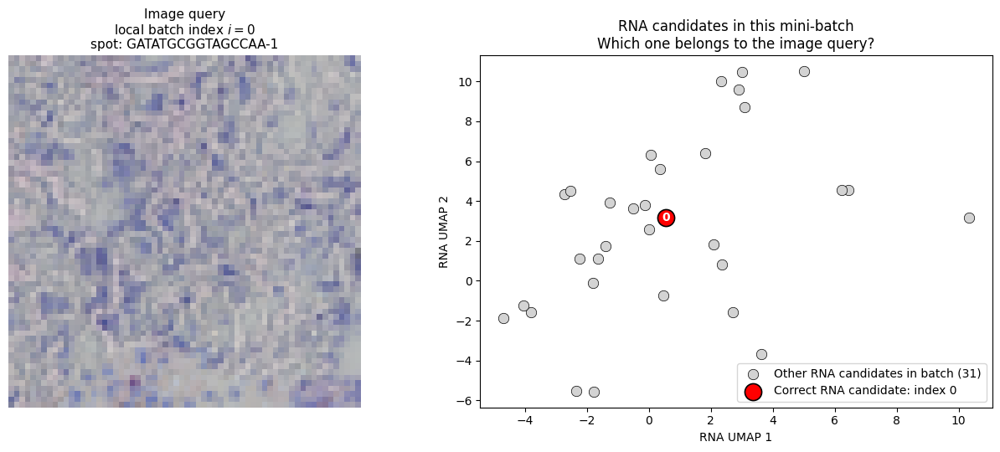

,local RNA candidate index j,Visium spot barcode,is correct match?
0,0,GATATGCGGTAGCCAA-1,True
1,1,CAACGGTTCTTGATAC-1,False
2,2,CTGCCTAGCCACCAAG-1,False
3,3,GCCACAATTTAAGGAC-1,False
4,4,TCGAATATCCCGCAGG-1,False
5,5,TATTATGTTTGCCTGC-1,False
6,6,GTGATCACTAACGCCT-1,False
7,7,CCCTCGATAATACACA-1,False
8,8,TCAACCATGTTCGGGC-1,False
9,9,GTCAGTTGTGCTCGTT-1,False


In [8]:
# ============================================================
# 5 — Turn each pair into a retrieval question
# ============================================================

# Choose one local batch index as an example query.
QUERY_I = 0

query_global_idx = batch_global_idx[QUERY_I]
query_barcode = adata.obs_names[query_global_idx]

# In image -> RNA retrieval:
# image_batch_np[QUERY_I] is the query.
# Every RNA profile in rna_batch_counts is a candidate.
# The correct candidate is rna_batch_counts[QUERY_I].

correct_rna_local_idx = QUERY_I
correct_rna_global_idx = batch_global_idx[correct_rna_local_idx]

print("Image → RNA retrieval question")
print("-" * 72)
print(f"Query image local batch index: {QUERY_I}")
print(f"Query image Visium spot:      {query_barcode}")
print(f"Number of RNA candidates:      {M}")
print(f"Correct RNA candidate index:   {correct_rna_local_idx}")
print(f"Correct RNA Visium spot:       {adata.obs_names[correct_rna_global_idx]}")

assert query_global_idx == correct_rna_global_idx
print("\nCheck passed: the query image and correct RNA profile come from the same spot.")


# ------------------------------------------------------------
# Plot one H&E query and all RNA candidates in RNA UMAP space
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

# Left: the image query.
axes[0].imshow(image_batch_np[QUERY_I])
axes[0].set_title(
    "Image query\n"
    f"local batch index $i={QUERY_I}$\n"
    f"spot: {query_barcode}",
    fontsize=11,
)
axes[0].axis("off")

# Right: all RNA candidates from this mini-batch.
axes[1].scatter(
    rna_umap[batch_global_idx, 0],
    rna_umap[batch_global_idx, 1],
    s=80,
    c="lightgray",
    edgecolors="black",
    linewidths=0.5,
    label=f"Other RNA candidates in batch ({M - 1})",
)

# Highlight the known correct RNA answer.
axes[1].scatter(
    rna_umap[correct_rna_global_idx, 0],
    rna_umap[correct_rna_global_idx, 1],
    s=210,
    c="red",
    edgecolors="black",
    linewidths=1.2,
    zorder=3,
    label=f"Correct RNA candidate: index {QUERY_I}",
)

axes[1].text(
    rna_umap[correct_rna_global_idx, 0],
    rna_umap[correct_rna_global_idx, 1],
    str(QUERY_I),
    ha="center",
    va="center",
    color="white",
    fontsize=10,
    fontweight="bold",
    zorder=4,
)

axes[1].set_title(
    "RNA candidates in this mini-batch\n"
    "Which one belongs to the image query?"
)
axes[1].set_xlabel("RNA UMAP 1")
axes[1].set_ylabel("RNA UMAP 2")
axes[1].legend(loc="best")

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Display the candidate list explicitly
# ------------------------------------------------------------
candidate_table = pd.DataFrame(
    {
        "local RNA candidate index j": np.arange(M),
        "Visium spot barcode": adata.obs_names[batch_global_idx].to_numpy(),
        "is correct match?": np.arange(M) == QUERY_I,
    }
)

display(candidate_table.style.apply(
    lambda row: [
        "background-color: #f4cccc" if row["is correct match?"] else ""
        for _ in row
    ],
    axis=1,
))

## 6 — Define one encoder per modality

The raw H&E patches and RNA profiles have very different dimensions:

$$
x_i^{\mathrm{image}}
\in
\mathbb{R}^{3 \times 112 \times 112}
$$

$$
x_i^{\mathrm{RNA}}
\in
\mathbb{R}^{1000}.
$$

For RNA, we retain the 1,000 most variable genes and use a multilayer perceptron:

$$
\mathbb{R}^{1000}
\rightarrow
\mathbb{R}^{512}
\rightarrow
\mathbb{R}^{256}
\rightarrow
\mathbb{R}^{128}.
$$

For H&E image patches, we use an ImageNet-pretrained ResNet-18 convolutional neural network.

The original ResNet-18 classifier is removed. Its 512-dimensional image feature vector is mapped into the shared representation space by a learned final layer:

$$
\mathbb{R}^{512}
\rightarrow
\mathbb{R}^{128}.
$$

Thus, both encoders output a vector in the same comparison space:

$$
z_i^{\mathrm{image}}
=
f_{\mathrm{image}}
\left(
x_i^{\mathrm{image}}
\right)
\in
\mathbb{R}^{128}
$$

$$
z_i^{\mathrm{RNA}}
=
f_{\mathrm{RNA}}
\left(
x_i^{\mathrm{RNA}}
\right)
\in
\mathbb{R}^{128}.
$$

Finally, we normalize each embedding to have length one:

$$
\left\|
z_i^{\mathrm{image}}
\right\|_2
=
1,
\qquad
\left\|
z_i^{\mathrm{RNA}}
\right\|_2
=
1.
$$

This lets their dot product act as cosine similarity.

In [9]:
# ============================================================
# 6 — Define one encoder per modality
# ============================================================

from torchvision.models import (
    ResNet18_Weights,
    resnet18,
)


# ------------------------------------------------------------
# Architecture decisions
# ------------------------------------------------------------

# RNA input:
# retain N_HVG highly variable genes per Visium spot.
N_HVG = 500

# Shared representation space:
#
# z_image, z_rna ∈ R^128
EMBEDDING_DIM = 128

# RNA encoder:
#
# R^N_HVG → R^512 → R^256 → R^128
RNA_HIDDEN_DIMS = [512, 256]
RNA_DROPOUT = 0.20

# Image encoder:
#
# H&E patch
# → ImageNet-pretrained ResNet-18  (early blocks FROZEN, layer4 TRAINABLE)
# → R^512
# → learned nonlinear image head
# → R^256
# → R^128
#
# CHANGE: the final residual block (layer4) is now UNFROZEN so the
# image encoder can adapt generic ImageNet features to H&E histology.
# All earlier blocks (conv1, bn1, layer1, layer2, layer3) stay frozen.
IMAGE_HEAD_HIDDEN_DIM = 256
IMAGE_HEAD_DROPOUT = 0.20

# Which ResNet blocks to unfreeze. layer4 is the last residual block.
# To unfreeze more, add "layer3" etc. (costs more memory / overfit risk).
UNFROZEN_BACKBONE_BLOCKS = ["layer4"]


# ------------------------------------------------------------
# 6.1 — Prepare RNA feature vectors for this smoke test
# ------------------------------------------------------------
#
# Raw RNA counts:
#     adata.X
#
# Steps:
#     1. Normalize each spot to 10,000 total counts.
#     2. Apply log(1 + x).
#     3. Select the top N_HVG highly variable genes.
#     4. Standardize each retained gene.
#
# Important:
# This preprocessing uses all spots only to make the current
# mini-batch shape check possible.
#
# In Sections 9–10, we will repeat the same preprocessing using
# TRAINING SPOTS ONLY before actual model fitting and evaluation.

adata_rna_smoke = adata.copy()

sc.pp.normalize_total(
    adata_rna_smoke,
    target_sum=1e4,
)

sc.pp.log1p(adata_rna_smoke)

sc.pp.highly_variable_genes(
    adata_rna_smoke,
    flavor="seurat",
    n_top_genes=N_HVG,
)

hvg_mask_smoke = adata_rna_smoke.var[
    "highly_variable"
].to_numpy()

hvg_names_smoke = adata_rna_smoke.var_names[
    hvg_mask_smoke
].to_numpy()

rna_features_smoke = adata_rna_smoke[
    :,
    hvg_mask_smoke,
].X

if hasattr(rna_features_smoke, "toarray"):
    rna_features_smoke = rna_features_smoke.toarray()

rna_features_smoke = np.asarray(
    rna_features_smoke,
    dtype=np.float32,
)

# Standardize each retained gene across spots.
rna_feature_mean_smoke = rna_features_smoke.mean(
    axis=0,
    keepdims=True,
)

rna_feature_std_smoke = rna_features_smoke.std(
    axis=0,
    keepdims=True,
)

rna_feature_std_smoke = np.maximum(
    rna_feature_std_smoke,
    1e-6,
)

rna_features_smoke = (
    rna_features_smoke
    -
    rna_feature_mean_smoke
) / rna_feature_std_smoke

print("RNA preprocessing for encoder smoke test")
print("-" * 72)
print(f"Original RNA dimension: {adata.n_vars:,} genes")
print(f"Retained HVGs:           {rna_features_smoke.shape[1]:,} genes")
print(f"RNA feature matrix:      {rna_features_smoke.shape}")
print()
print("First 15 retained HVGs:")
print(hvg_names_smoke[:15].tolist())


# Build the RNA part of the illustrative mini-batch from Section 3.
rna_batch_features = rna_features_smoke[
    batch_global_idx
]

rna_batch_feature_tensor = torch.from_numpy(
    rna_batch_features.copy()
).float()

print()
print("Current mini-batch RNA shape:")
print(tuple(rna_batch_feature_tensor.shape))


# ------------------------------------------------------------
# 6.2 — Normalize H&E patches for pretrained ResNet-18
# ------------------------------------------------------------
#
# ImageNet-pretrained ResNet-18 expects RGB channels normalized
# using these ImageNet mean and standard-deviation values.

IMAGENET_MEAN = torch.tensor(
    [0.485, 0.456, 0.406],
    dtype=torch.float32,
).view(1, 3, 1, 1)

IMAGENET_STD = torch.tensor(
    [0.229, 0.224, 0.225],
    dtype=torch.float32,
).view(1, 3, 1, 1)


def normalize_for_resnet(image_batch):
    """
    Normalize an RGB image batch for ImageNet-pretrained ResNet-18.

    Parameters
    ----------
    image_batch:
        Tensor with shape:
        (batch size, 3, height, width)

        Values must be in [0, 1].
    """
    mean = IMAGENET_MEAN.to(
        image_batch.device
    )

    std = IMAGENET_STD.to(
        image_batch.device
    )

    return (
        image_batch - mean
    ) / std


# ------------------------------------------------------------
# 6.3 — Partially unfrozen ResNet-18 image encoder with MLP head
# ------------------------------------------------------------

class ResNet18ImageEncoder(nn.Module):
    """
    H&E patch
    → ImageNet-pretrained ResNet-18 (early blocks frozen, layer4 trainable)
    → 512-dimensional visual feature vector
    → learned MLP head
    → 128-dimensional unit-length embedding.

    The MLP head AND the unfrozen backbone blocks are part of f_image.

    CHANGES vs. the fully frozen version:
      * The chosen backbone blocks (UNFROZEN_BACKBONE_BLOCKS) are trainable.
      * forward_features no longer wraps the backbone in torch.no_grad(),
        so gradients can flow into the unfrozen blocks.
      * train() puts ONLY the still-frozen blocks into eval mode; the
        unfrozen blocks train normally (their BatchNorm updates).
    """

    def __init__(
        self,
        embedding_dim,
        head_hidden_dim=256,
        head_dropout=0.20,
        unfrozen_blocks=("layer4",),
    ):
        super().__init__()

        self.unfrozen_blocks = tuple(unfrozen_blocks)

        self.backbone = resnet18(
            weights=ResNet18_Weights.IMAGENET1K_V1,
        )

        # Remove ImageNet's original 1,000-class classifier.
        # The backbone now outputs one 512-dimensional vector.
        self.backbone.fc = nn.Identity()

        # Step 1: freeze EVERY backbone parameter.
        for parameter in self.backbone.parameters():
            parameter.requires_grad = False

        # Step 2: unfreeze the requested blocks.
        for block_name in self.unfrozen_blocks:
            block = getattr(self.backbone, block_name)
            for parameter in block.parameters():
                parameter.requires_grad = True

        # Names of the backbone children that remain frozen.
        # Everything in the backbone that is NOT an unfrozen block.
        self._frozen_child_names = [
            name
            for name, _ in self.backbone.named_children()
            if name not in self.unfrozen_blocks
        ]

        # Learned H&E-to-shared-space mapping:
        #
        # R^512 → R^256 → R^128
        self.to_shared_space = nn.Sequential(
            nn.Linear(
                in_features=512,
                out_features=head_hidden_dim,
            ),
            nn.LayerNorm(head_hidden_dim),
            nn.GELU(),
            nn.Dropout(head_dropout),

            nn.Linear(
                in_features=head_hidden_dim,
                out_features=embedding_dim,
            ),
        )

    def train(self, mode=True):
        """
        Set training mode, but keep ONLY the still-frozen backbone
        children in eval mode (so their BatchNorm running statistics
        do not change). The unfrozen blocks follow `mode` normally.
        """
        super().train(mode)

        # Force the frozen children back to eval, regardless of `mode`.
        for child_name in self._frozen_child_names:
            getattr(self.backbone, child_name).eval()

        return self

    def forward_features(self, x):
        """
        Return the 512-dimensional ResNet feature vector.

        CHANGE: no torch.no_grad() here — gradients must be able to
        flow into the unfrozen backbone blocks. The frozen blocks
        still receive no updates because their parameters have
        requires_grad=False.
        """
        return self.backbone(x)

    def forward(self, x):
        h_image = self.forward_features(x)

        z_image = self.to_shared_space(
            h_image
        )

        return F.normalize(
            z_image,
            p=2,
            dim=1,
        )


# ------------------------------------------------------------
# 6.4 — RNA MLP encoder
# ------------------------------------------------------------

class RNAEncoder(nn.Module):
    """
    Standardized RNA HVG vector → shared 128-dimensional embedding.

    Current architecture:

        R^N_HVG → R^512 → R^256 → R^128
    """

    def __init__(
        self,
        input_dim,
        hidden_dims,
        embedding_dim,
        dropout,
    ):
        super().__init__()

        layers = []

        current_dim = input_dim

        for hidden_dim in hidden_dims:
            layers.extend(
                [
                    nn.Linear(
                        current_dim,
                        hidden_dim,
                    ),
                    nn.LayerNorm(hidden_dim),
                    nn.GELU(),
                    nn.Dropout(dropout),
                ]
            )

            current_dim = hidden_dim

        layers.append(
            nn.Linear(
                current_dim,
                embedding_dim,
            )
        )

        self.network = nn.Sequential(
            *layers
        )

    def forward(self, x):
        z_rna = self.network(x)

        return F.normalize(
            z_rna,
            p=2,
            dim=1,
        )


# ------------------------------------------------------------
# 6.5 — Create both encoders
# ------------------------------------------------------------

image_encoder = ResNet18ImageEncoder(
    embedding_dim=EMBEDDING_DIM,
    head_hidden_dim=IMAGE_HEAD_HIDDEN_DIM,
    head_dropout=IMAGE_HEAD_DROPOUT,
    unfrozen_blocks=UNFROZEN_BACKBONE_BLOCKS,
).to(DEVICE)

rna_encoder = RNAEncoder(
    input_dim=N_HVG,
    hidden_dims=RNA_HIDDEN_DIMS,
    embedding_dim=EMBEDDING_DIM,
    dropout=RNA_DROPOUT,
).to(DEVICE)


def count_parameters(
    model,
    trainable_only=False,
):
    """
    Count all parameters, or only parameters with gradients enabled.
    """
    parameters = model.parameters()

    if trainable_only:
        parameters = [
            parameter
            for parameter in parameters
            if parameter.requires_grad
        ]

    return sum(
        parameter.numel()
        for parameter in parameters
    )


print()
print("Model capacity")
print("-" * 72)

print(
    "Image encoder parameters: "
    f"{count_parameters(image_encoder):,}"
)

print(
    "Image encoder trainable parameters: "
    f"{count_parameters(image_encoder, trainable_only=True):,}"
)

print(
    "RNA encoder parameters: "
    f"{count_parameters(rna_encoder):,}"
)

print(
    "RNA encoder trainable parameters: "
    f"{count_parameters(rna_encoder, trainable_only=True):,}"
)

print(
    "Total trainable parameters: "
    f"{count_parameters(image_encoder, trainable_only=True) + count_parameters(rna_encoder, trainable_only=True):,}"
)

# Sanity check: confirm the backbone is actually partially unfrozen.
_backbone_trainable = sum(
    p.numel()
    for p in image_encoder.backbone.parameters()
    if p.requires_grad
)
print()
print(
    f"Backbone trainable parameters: {_backbone_trainable:,} "
    f"(unfrozen blocks: {list(UNFROZEN_BACKBONE_BLOCKS)})"
)
assert _backbone_trainable > 0, (
    "Backbone is still fully frozen — check UNFROZEN_BACKBONE_BLOCKS "
    "and the block names in resnet18 (expected e.g. 'layer4')."
)


# ------------------------------------------------------------
# 6.6 — Pass the illustrative mini-batch through both encoders
# ------------------------------------------------------------
#
# This verifies shapes only.
# The embeddings are not meaningful before contrastive training.

image_batch_for_encoder = normalize_for_resnet(
    image_batch_tensor.to(DEVICE)
)

rna_batch_for_encoder = rna_batch_feature_tensor.to(
    DEVICE
)

image_encoder.eval()
rna_encoder.eval()

with torch.no_grad():

    image_features_512 = image_encoder.forward_features(
        image_batch_for_encoder
    )

    z_image = image_encoder(
        image_batch_for_encoder
    )

    z_rna = rna_encoder(
        rna_batch_for_encoder
    )

mini_batch_size = image_batch_tensor.shape[0]

print()
print("Dimension check")
print("-" * 72)

print(
    "Raw H&E mini-batch:       ",
    tuple(image_batch_tensor.shape),
)

print(
    "ResNet features:          ",
    tuple(image_features_512.shape),
)

print(
    "Processed RNA mini-batch: ",
    tuple(rna_batch_feature_tensor.shape),
)

print(
    "Image embeddings z_image: ",
    tuple(z_image.shape),
)

print(
    "RNA embeddings z_rna:     ",
    tuple(z_rna.shape),
)

print()
print(
    "First image embedding length:",
    torch.linalg.vector_norm(
        z_image[0]
    ).item(),
)

print(
    "First RNA embedding length:  ",
    torch.linalg.vector_norm(
        z_rna[0]
    ).item(),
)

assert z_image.shape == (
    mini_batch_size,
    EMBEDDING_DIM,
)

assert z_rna.shape == (
    mini_batch_size,
    EMBEDDING_DIM,
)

assert torch.allclose(
    torch.linalg.vector_norm(
        z_image,
        dim=1,
    ),
    torch.ones(
        mini_batch_size,
        device=DEVICE,
    ),
    atol=1e-5,
)

assert torch.allclose(
    torch.linalg.vector_norm(
        z_rna,
        dim=1,
    ),
    torch.ones(
        mini_batch_size,
        device=DEVICE,
    ),
    atol=1e-5,
)

print()
print(
    "Success: both modalities now produce "
    "unit-length vectors in R^128."
)

RNA preprocessing for encoder smoke test
------------------------------------------------------------------------
Original RNA dimension: 36,601 genes
Retained HVGs:           500 genes
RNA feature matrix:      (3798, 500)

First 15 retained HVGs:
['AL034417.3', 'ANGPTL7', 'TNFRSF1B', 'VWA5B1', 'HSPG2', 'C1QA', 'C1QB', 'ID3', 'RHCE', 'C1orf232', 'CD52', 'HCRTR1', 'COL16A1', 'DCDC2B', 'AL513218.1']

Current mini-batch RNA shape:
(32, 500)

Model capacity
------------------------------------------------------------------------
Image encoder parameters: 11,341,248
Image encoder trainable parameters: 8,558,464
RNA encoder parameters: 422,272
RNA encoder trainable parameters: 422,272
Total trainable parameters: 8,980,736

Backbone trainable parameters: 8,393,728 (unfrozen blocks: ['layer4'])

Dimension check
------------------------------------------------------------------------
Raw H&E mini-batch:        (32, 3, 64, 64)
ResNet features:           (32, 512)
Processed RNA mini-batch:  (32, 

## 7 — Compute cross-modal similarities

Each H&E patch and RNA profile is now represented by a unit-length vector in the same space:

$$
z_i^{\mathrm{image}},
z_i^{\mathrm{RNA}}
\in
\mathbb{R}^{128}.
$$

For every image embedding $z_i^{\mathrm{image}}$, we compare it with every RNA embedding $z_j^{\mathrm{RNA}}$ in the mini-batch:

$$
S_{ij}
=
\left(
z_i^{\mathrm{image}}
\right)^\top
z_j^{\mathrm{RNA}}.
$$

Because both embeddings have unit length, this dot product is cosine similarity:

$$
-1
\leq
S_{ij}
\leq
1.
$$

The resulting similarity matrix has shape:

$$
S
\in
\mathbb{R}^{m \times m}.
$$

Its rows correspond to H&E image queries, and its columns correspond to RNA candidates:

$$
S_{ij}
=
\text{similarity between image query } i
\text{ and RNA candidate } j.
$$

Before applying the contrastive loss, we divide the similarities by a temperature parameter $\tau$:

$$
\widetilde{S}_{ij}
=
\frac{S_{ij}}{\tau}.
$$

A smaller temperature makes the model place more emphasis on the highest-scoring candidate.

Embedding shapes
------------------------------------------------------------------------
z_image: (32, 128)
z_rna:   (32, 128)

Similarity-matrix shapes
------------------------------------------------------------------------
Raw cosine-similarity matrix: (32, 32)
Temperature-scaled logit matrix: (32, 32)

Raw cosine-similarity range
------------------------------------------------------------------------
Minimum: -0.252
Maximum: 0.156

Current score summary
------------------------------------------------------------------------
Mean diagonal score (known image–RNA pairs): -0.052
Mean off-diagonal score (other batch candidates): -0.058

The encoders are not trained yet, so the diagonal scores do not need to be larger than off-diagonal scores.


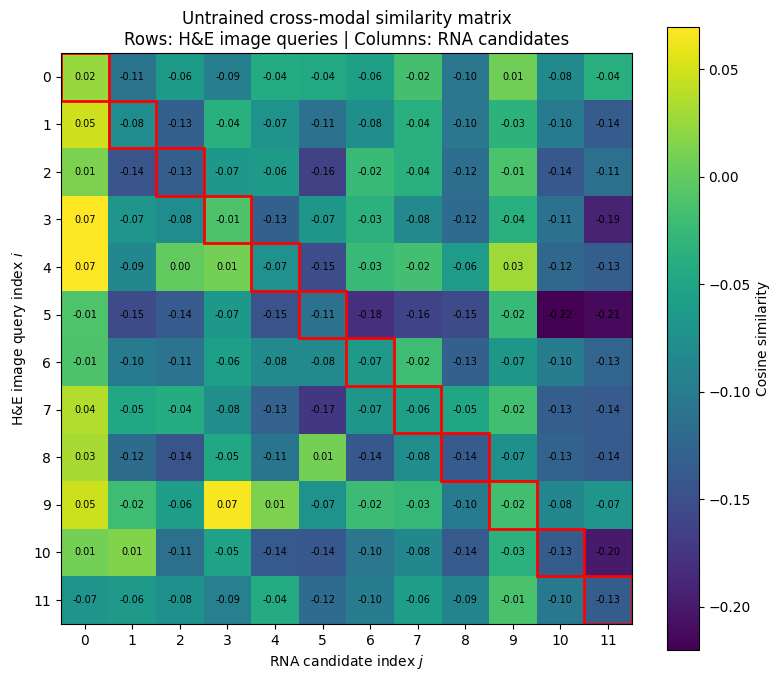

In [10]:
# ============================================================
# 7 — Compute cross-modal similarities
# ============================================================

# Temperature used by the contrastive retrieval loss.
#
# Smaller τ:
#     makes the softmax distribution sharper
#
# Larger τ:
#     makes the softmax distribution softer
TEMPERATURE = 0.15


# ------------------------------------------------------------
# Re-encode the current illustrative mini-batch
# ------------------------------------------------------------
#
# The frozen ResNet-18 produces a 512-dimensional feature vector.
# The learned image MLP maps it into R^128.
#
# The RNA MLP also maps each 1,000-HVG vector into R^128.
#
# At this stage, neither learned head has been trained, so these
# similarities are only for inspecting the mechanics.

image_encoder.eval()
rna_encoder.eval()

with torch.no_grad():

    image_batch_for_encoder = normalize_for_resnet(
        image_batch_tensor.to(DEVICE)
    )

    rna_batch_for_encoder = rna_batch_feature_tensor.to(
        DEVICE
    )

    z_image = image_encoder(
        image_batch_for_encoder
    )

    z_rna = rna_encoder(
        rna_batch_for_encoder
    )


# ------------------------------------------------------------
# Compute all m × m image–RNA similarities
# ------------------------------------------------------------
#
# Row i:
#     one H&E image query z_image[i]
#
# Column j:
#     one RNA candidate z_rna[j]
#
# Because both vectors have unit length:
#
# similarity_matrix[i, j]
# =
# z_image[i] dot z_rna[j]
#
# is cosine similarity.

mini_batch_size = z_image.shape[0]

similarity_matrix = z_image @ z_rna.T

# These temperature-scaled values are the logits that will enter
# the contrastive softmax loss in Section 8.
logit_matrix = similarity_matrix / TEMPERATURE


# ------------------------------------------------------------
# Verify shapes and inspect values
# ------------------------------------------------------------

print("Embedding shapes")
print("-" * 72)
print("z_image:", tuple(z_image.shape))
print("z_rna:  ", tuple(z_rna.shape))

print()
print("Similarity-matrix shapes")
print("-" * 72)
print(
    "Raw cosine-similarity matrix:",
    tuple(similarity_matrix.shape),
)
print(
    "Temperature-scaled logit matrix:",
    tuple(logit_matrix.shape),
)

print()
print("Raw cosine-similarity range")
print("-" * 72)
print(
    f"Minimum: {similarity_matrix.min().item():.3f}"
)
print(
    f"Maximum: {similarity_matrix.max().item():.3f}"
)


# ------------------------------------------------------------
# Compare diagonal and off-diagonal scores
# ------------------------------------------------------------
#
# Diagonal entries:
#
# S_ii
#
# These correspond to known image–RNA pairs:
#
# image i ↔ RNA i
#
# Off-diagonal entries:
#
# S_ij, where i != j
#
# These are alternative RNA candidates from the same mini-batch.

diagonal_scores = torch.diagonal(
    similarity_matrix
)

off_diagonal_mask = ~torch.eye(
    mini_batch_size,
    dtype=torch.bool,
    device=DEVICE,
)

off_diagonal_scores = similarity_matrix[
    off_diagonal_mask
]

print()
print("Current score summary")
print("-" * 72)

print(
    "Mean diagonal score "
    "(known image–RNA pairs): "
    f"{diagonal_scores.mean().item():.3f}"
)

print(
    "Mean off-diagonal score "
    "(other batch candidates): "
    f"{off_diagonal_scores.mean().item():.3f}"
)

print()
print(
    "The encoders are not trained yet, so the diagonal scores "
    "do not need to be larger than off-diagonal scores."
)


# ------------------------------------------------------------
# Visualize a small part of the score matrix
# ------------------------------------------------------------

N_SHOW = min(
    mini_batch_size,
    12,
)

scores_to_plot = similarity_matrix[
    :N_SHOW,
    :N_SHOW,
].detach().cpu().numpy()

fig, ax = plt.subplots(
    figsize=(8, 7),
)

im = ax.imshow(
    scores_to_plot,
    aspect="equal",
)

ax.set_xticks(
    np.arange(N_SHOW)
)

ax.set_yticks(
    np.arange(N_SHOW)
)

ax.set_xlabel(
    "RNA candidate index $j$"
)

ax.set_ylabel(
    "H&E image query index $i$"
)

ax.set_title(
    "Untrained cross-modal similarity matrix\n"
    "Rows: H&E image queries | Columns: RNA candidates"
)

for i in range(N_SHOW):
    for j in range(N_SHOW):

        score = scores_to_plot[i, j]

        ax.text(
            j,
            i,
            f"{score:.2f}",
            ha="center",
            va="center",
            fontsize=7,
            color=(
                "white"
                if abs(score) > 0.35
                else "black"
            ),
        )

# Outline the known positive pairs.
for i in range(N_SHOW):

    ax.add_patch(
        plt.Rectangle(
            (i - 0.5, i - 0.5),
            1,
            1,
            fill=False,
            edgecolor="red",
            linewidth=2,
        )
    )

colorbar = plt.colorbar(
    im,
    ax=ax,
)

colorbar.set_label(
    "Cosine similarity"
)

plt.tight_layout()
plt.show()

## 8 — Compute the bidirectional contrastive loss

For each H&E image query, we want its paired RNA profile to receive the highest score among all RNA candidates in the mini-batch.

For image-to-RNA retrieval:

$$
\mathcal{L}_{\mathrm{image}\rightarrow\mathrm{RNA}}
=
-\frac{1}{m}
\sum_{i=1}^{m}
\log
\frac{
\exp
\left(
\widetilde{S}_{ii}
\right)
}{
\sum_{j=1}^{m}
\exp
\left(
\widetilde{S}_{ij}
\right)
}.
$$

For one image query $i$, the numerator is the score of its known paired RNA profile.

The denominator includes the paired RNA profile and every alternative RNA candidate in the mini-batch.

We also train the reverse retrieval task: given an RNA profile, retrieve its paired H&E image.

$$
\mathcal{L}_{\mathrm{RNA}\rightarrow\mathrm{image}}
=
-\frac{1}{m}
\sum_{i=1}^{m}
\log
\frac{
\exp
\left(
\widetilde{S}_{ii}
\right)
}{
\sum_{j=1}^{m}
\exp
\left(
\widetilde{S}_{ji}
\right)
}.
$$

The final alignment loss is the average of both directions:

$$
\mathcal{L}_{\mathrm{align}}
=
\frac{1}{2}
\left(
\mathcal{L}_{\mathrm{image}\rightarrow\mathrm{RNA}}
+
\mathcal{L}_{\mathrm{RNA}\rightarrow\mathrm{image}}
\right).
$$

In [11]:
# ============================================================
# 8 — Compute the bidirectional contrastive loss
# ============================================================

# logit_matrix has shape:
#
#     (m, m)
#
# Row i:
#     one H&E image query
#
# Column j:
#     one RNA candidate
#
# logit_matrix[i, j] =
#     cosine similarity(image i, RNA j) / temperature
#
# The correct target for row i is always candidate i.

mini_batch_size = logit_matrix.shape[0]

positive_targets = torch.arange(
    mini_batch_size,
    device=DEVICE,
)

print("Logit matrix shape:", tuple(logit_matrix.shape))
print("Positive target shape:", tuple(positive_targets.shape))
print("Mini-batch size:", mini_batch_size)


# ------------------------------------------------------------
# 8.1 — Image → RNA retrieval loss
# ------------------------------------------------------------
#
# For H&E image query i, the correct RNA candidate is i.
#
# F.cross_entropy computes:
#
#     -log softmax(logit_matrix[i, :])[i]
#
# and averages this quantity over every image query in the batch.

loss_image_to_rna = F.cross_entropy(
    input=logit_matrix,
    target=positive_targets,
)


# ------------------------------------------------------------
# 8.2 — RNA → image retrieval loss
# ------------------------------------------------------------
#
# Transposing the matrix reverses the retrieval direction.
#
# Row i:
#     RNA query i
#
# Column j:
#     H&E image candidate j
#
# The correct H&E image remains candidate i.

loss_rna_to_image = F.cross_entropy(
    input=logit_matrix.T,
    target=positive_targets,
)


# ------------------------------------------------------------
# 8.3 — Symmetric paired alignment loss
# ------------------------------------------------------------

loss_align = 0.5 * (
    loss_image_to_rna
    +
    loss_rna_to_image
)

print()
print("Bidirectional contrastive loss")
print("-" * 72)

print(
    f"Image → RNA loss: {loss_image_to_rna.item():.4f}"
)

print(
    f"RNA → Image loss: {loss_rna_to_image.item():.4f}"
)

print(
    f"Alignment loss:   {loss_align.item():.4f}"
)

print()
print(
    "At this point the model is untrained, so the correct "
    "diagonal pair does not need to have the highest probability."
)


# ------------------------------------------------------------
# Inspect one image → RNA retrieval probability distribution
# ------------------------------------------------------------
#
# For one H&E query, softmax converts its row of logits into
# a probability distribution over all RNA candidates.

QUERY_I = 0

image_to_rna_probabilities = F.softmax(
    logit_matrix[QUERY_I],
    dim=-1,
)

top_k = min(
    8,
    mini_batch_size,
)

top_candidate_indices = torch.topk(
    image_to_rna_probabilities,
    k=top_k,
).indices

top_candidate_probabilities = image_to_rna_probabilities[
    top_candidate_indices
]

top_candidate_indices_np = (
    top_candidate_indices
    .detach()
    .cpu()
    .numpy()
)

top_candidate_probabilities_np = (
    top_candidate_probabilities
    .detach()
    .cpu()
    .numpy()
)

probability_table = pd.DataFrame(
    {
        "RNA candidate index j": top_candidate_indices_np,
        "Visium spot barcode": adata.obs_names[
            batch_global_idx[top_candidate_indices_np]
        ].to_numpy(),
        "retrieval probability": top_candidate_probabilities_np,
        "is known correct pair?": (
            top_candidate_indices_np == QUERY_I
        ),
    }
)

print()
print(
    f"H&E image query index: {QUERY_I}"
)

print(
    f"Known correct RNA candidate: {QUERY_I}"
)

display(
    probability_table.style.format(
        {
            "retrieval probability": "{:.3f}",
        }
    ).apply(
        lambda row: [
            (
                "background-color: #f4cccc"
                if row["is known correct pair?"]
                else ""
            )
            for _ in row
        ],
        axis=1,
    )
)

Logit matrix shape: (32, 32)
Positive target shape: (32,)
Mini-batch size: 32

Bidirectional contrastive loss
------------------------------------------------------------------------
Image → RNA loss: 3.5250
RNA → Image loss: 3.4713
Alignment loss:   3.4981

At this point the model is untrained, so the correct diagonal pair does not need to have the highest probability.

H&E image query index: 0
Known correct RNA candidate: 0


,RNA candidate index j,Visium spot barcode,retrieval probability,is known correct pair?
0,22,TTGGGAAGACGAGCCG-1,0.068,False
1,28,CTTCTTACGTCGTATA-1,0.047,False
2,19,CTCGGGTTCTCTGGCC-1,0.047,False
3,23,ATCTCGTGAGCGAAAC-1,0.042,False
4,24,TTGCTGAAGGAACCAC-1,0.042,False
5,0,GATATGCGGTAGCCAA-1,0.041,True
6,15,CTCGCTAGGTAAGCGA-1,0.039,False
7,17,CCCTATGTAGAGCAGA-1,0.038,False


## 9–10 — Define the forward pass and train the encoders

We now combine the final two training steps.

For one mini-batch, the forward pass is:

$$
\left(
x_i^{\mathrm{image}},
x_i^{\mathrm{RNA}}
\right)
\rightarrow
\left(
z_i^{\mathrm{image}},
z_i^{\mathrm{RNA}}
\right)
\rightarrow
S
\rightarrow
\mathcal{L}_{\mathrm{align}}.
$$

First, the H&E image patches and RNA vectors are passed through their respective encoders:

$$
z_i^{\mathrm{image}}
=
f_{\mathrm{image}}
\left(
x_i^{\mathrm{image}}
\right)
$$

$$
z_i^{\mathrm{RNA}}
=
f_{\mathrm{RNA}}
\left(
x_i^{\mathrm{RNA}}
\right).
$$

Next, we compute all image–RNA similarities in the mini-batch:

$$
S_{ij}
=
\frac{
\left(
z_i^{\mathrm{image}}
\right)^\top
z_j^{\mathrm{RNA}}
}{
\tau
}.
$$

The bidirectional contrastive loss measures whether every image retrieves its paired RNA profile and every RNA profile retrieves its paired image:

$$
\mathcal{L}_{\mathrm{align}}
=
\frac{1}{2}
\left(
\mathcal{L}_{\mathrm{image}\rightarrow\mathrm{RNA}}
+
\mathcal{L}_{\mathrm{RNA}\rightarrow\mathrm{image}}
\right).
$$

We then update both encoders:

$$
\mathcal{L}_{\mathrm{align}}
\rightarrow
\text{backpropagation}
\rightarrow
\text{optimizer update}.
$$

Training repeats this update for every mini-batch and for many epochs.

In [12]:
# # ============================================================
# # 9–10 — Define the forward pass and train the encoders
# # ============================================================
# #
# # Main workshop baseline:
# #
# # H&E patch
# # → frozen ImageNet-pretrained ResNet-18
# # → learned image MLP head: 512 → 256 → 128
# #
# # RNA profile
# # → 1,000 training-set HVGs
# # → RNA MLP: 1000 → 512 → 256 → 128
# #
# # Both encoders produce unit-length vectors in R^128.
# #
# # Evaluation setting:
# # random held-out spots within this tissue section.
# #
# # This tests within-section paired retrieval. It does not claim
# # generalization to a new tissue slide, patient, or tissue region.
# # ============================================================

# from __future__ import annotations

# import copy

# from sklearn.model_selection import (
#     GroupShuffleSplit,
#     train_test_split,
# )


# # ------------------------------------------------------------
# # 9.1 — Training decisions
# # ------------------------------------------------------------

# # Main notebook benchmark:
# #
# # "random_within_section"
# #     Train, validation, and test spots are distributed across
# #     the same tissue section.
# #
# # "spatial_blocks"
# #     Optional harder stress test. Entire tissue regions are held
# #     out, so biology may differ across train and test.
# SPLIT_MODE = "random_within_section"

# TEST_FRACTION = 0.15
# VALIDATION_FRACTION = 0.15

# # Used only if SPLIT_MODE = "spatial_blocks".
# N_BLOCKS_PER_AXIS = 5

# # InfoNCE mini-batch size.
# BATCH_SIZE = 64

# # Training duration and model selection.
# EPOCHS = 30
# PATIENCE = 5

# # Regularization.
# WEIGHT_DECAY = 5e-4

# # Both learned heads use the same optimizer learning rate.
# LEARNING_RATE = 3e-4

# # Keep these explicit here so this training cell agrees with
# # Section 6. Do not change one without changing the other.
# N_HVG = 1000
# EMBEDDING_DIM = 128

# RNA_HIDDEN_DIMS = [512, 256]
# RNA_DROPOUT = 0.20

# IMAGE_HEAD_HIDDEN_DIM = 256
# IMAGE_HEAD_DROPOUT = 0.20

# # Save separately from the old linear-head baseline.
# EXPERIMENT_NAME = "frozen_resnet18_mlp_head_hvg1000"

# CHECKPOINT_PATH = (
#     f"best_{EXPERIMENT_NAME}.pt"
# )


# # ------------------------------------------------------------
# # 9.2 — Split paired spots
# # ------------------------------------------------------------

# all_spot_idx = np.arange(
#     adata.n_obs
# )


# def make_spatial_blocks(
#     coords_xy,
#     n_blocks_per_axis,
# ):
#     """
#     Assign each spot to one coarse rectangular tissue block.

#     Used only for the optional held-out tissue-region stress test.
#     """
#     x = coords_xy[:, 0]
#     y = coords_xy[:, 1]

#     x_scaled = (
#         x - x.min()
#     ) / max(
#         x.max() - x.min(),
#         1e-8,
#     )

#     y_scaled = (
#         y - y.min()
#     ) / max(
#         y.max() - y.min(),
#         1e-8,
#     )

#     x_bin = np.clip(
#         (
#             x_scaled * n_blocks_per_axis
#         ).astype(int),
#         0,
#         n_blocks_per_axis - 1,
#     )

#     y_bin = np.clip(
#         (
#             y_scaled * n_blocks_per_axis
#         ).astype(int),
#         0,
#         n_blocks_per_axis - 1,
#     )

#     return (
#         y_bin * n_blocks_per_axis
#         +
#         x_bin
#     )


# if SPLIT_MODE == "random_within_section":

#     # Primary workshop benchmark:
#     # all broad tissue contexts appear in train, validation, and test.
#     train_val_idx, test_idx = train_test_split(
#         all_spot_idx,
#         test_size=TEST_FRACTION,
#         random_state=SEED,
#         shuffle=True,
#     )

#     validation_fraction_within_train_val = (
#         VALIDATION_FRACTION
#         /
#         (
#             1.0 - TEST_FRACTION
#         )
#     )

#     train_idx, val_idx = train_test_split(
#         train_val_idx,
#         test_size=validation_fraction_within_train_val,
#         random_state=SEED + 1,
#         shuffle=True,
#     )

#     split_title = (
#         "Random held-out spots within this tissue section"
#     )

#     split_interpretation = (
#         "Within-section paired retrieval benchmark"
#     )

# elif SPLIT_MODE == "spatial_blocks":

#     # Optional rigorous stress test:
#     # whole coarse regions are held out.
#     spatial_blocks = make_spatial_blocks(
#         coords_hires,
#         n_blocks_per_axis=N_BLOCKS_PER_AXIS,
#     )

#     test_splitter = GroupShuffleSplit(
#         n_splits=1,
#         test_size=TEST_FRACTION,
#         random_state=SEED,
#     )

#     train_val_positions, test_positions = next(
#         test_splitter.split(
#             all_spot_idx,
#             groups=spatial_blocks,
#         )
#     )

#     train_val_idx = all_spot_idx[
#         train_val_positions
#     ]

#     test_idx = all_spot_idx[
#         test_positions
#     ]

#     validation_fraction_within_train_val = (
#         VALIDATION_FRACTION
#         /
#         (
#             1.0 - TEST_FRACTION
#         )
#     )

#     validation_splitter = GroupShuffleSplit(
#         n_splits=1,
#         test_size=validation_fraction_within_train_val,
#         random_state=SEED + 1,
#     )

#     train_positions, val_positions = next(
#         validation_splitter.split(
#             train_val_idx,
#             groups=spatial_blocks[train_val_idx],
#         )
#     )

#     train_idx = train_val_idx[
#         train_positions
#     ]

#     val_idx = train_val_idx[
#         val_positions
#     ]

#     split_title = (
#         "Spatially blocked train / validation / test split"
#     )

#     split_interpretation = (
#         "Held-out tissue-region stress test"
#     )

# else:
#     raise ValueError(
#         "SPLIT_MODE must be either "
#         "'random_within_section' or 'spatial_blocks'."
#     )


# print("Paired-data split")
# print("-" * 72)
# print(f"Split mode:        {SPLIT_MODE}")
# print(f"Interpretation:    {split_interpretation}")
# print(f"Training spots:    {len(train_idx):,}")
# print(f"Validation spots:  {len(val_idx):,}")
# print(f"Test spots:        {len(test_idx):,}")


# # ------------------------------------------------------------
# # Visualize the split
# # ------------------------------------------------------------

# fig, ax = plt.subplots(
#     figsize=(8, 8),
# )

# ax.imshow(
#     hires_image
# )

# ax.scatter(
#     coords_hires[train_idx, 0],
#     coords_hires[train_idx, 1],
#     s=7,
#     alpha=0.55,
#     label="training spots",
# )

# ax.scatter(
#     coords_hires[val_idx, 0],
#     coords_hires[val_idx, 1],
#     s=7,
#     alpha=0.70,
#     label="validation spots",
# )

# ax.scatter(
#     coords_hires[test_idx, 0],
#     coords_hires[test_idx, 1],
#     s=7,
#     alpha=0.70,
#     label="held-out test spots",
# )

# ax.set_title(
#     split_title
# )

# ax.legend(
#     loc="upper right",
# )

# ax.axis("off")
# plt.show()


# # ------------------------------------------------------------
# # 9.3 — Rebuild RNA features using training spots only
# # ------------------------------------------------------------
# #
# # The held-out validation and test spots do not influence:
# #
# # - which genes are selected as HVGs;
# # - the gene-wise mean;
# # - the gene-wise standard deviation.
# #
# # Pipeline:
# #
# # raw counts
# # → total-count normalization
# # → log(1 + x)
# # → top 1,000 training-set HVGs
# # → training-set standardization

# adata_rna_all = adata.copy()

# sc.pp.normalize_total(
#     adata_rna_all,
#     target_sum=1e4,
# )

# sc.pp.log1p(
#     adata_rna_all
# )

# adata_rna_train = adata_rna_all[
#     train_idx
# ].copy()

# sc.pp.highly_variable_genes(
#     adata_rna_train,
#     flavor="seurat",
#     n_top_genes=N_HVG,
# )

# hvg_mask = adata_rna_train.var[
#     "highly_variable"
# ].to_numpy()

# hvg_names = adata_rna_train.var_names[
#     hvg_mask
# ].to_numpy()

# rna_features = adata_rna_all[
#     :,
#     hvg_names,
# ].X

# if hasattr(
#     rna_features,
#     "toarray",
# ):
#     rna_features = rna_features.toarray()

# rna_features = np.asarray(
#     rna_features,
#     dtype=np.float32,
# )

# # Fit standardization only on training spots.
# rna_train_mean = rna_features[
#     train_idx
# ].mean(
#     axis=0,
#     keepdims=True,
# )

# rna_train_std = rna_features[
#     train_idx
# ].std(
#     axis=0,
#     keepdims=True,
# )

# rna_train_std = np.maximum(
#     rna_train_std,
#     1e-6,
# )

# rna_features = (
#     rna_features
#     -
#     rna_train_mean
# ) / rna_train_std


# print()
# print("RNA preprocessing")
# print("-" * 72)
# print(
#     f"Original RNA dimension: "
#     f"{adata.n_vars:,} genes"
# )

# print(
#     f"Retained HVGs:           "
#     f"{rna_features.shape[1]:,} genes"
# )

# print(
#     f"RNA feature matrix:      "
#     f"{rna_features.shape}"
# )

# print()
# print("First 15 selected HVGs:")
# print(
#     hvg_names[:15].tolist()
# )


# # ------------------------------------------------------------
# # 9.4 — Paired PyTorch Dataset and DataLoaders
# # ------------------------------------------------------------

# class VisiumPairedDataset(Dataset):
#     """
#     One item is one known H&E-image / RNA pair
#     measured at the same Visium spot.
#     """

#     def __init__(
#         self,
#         spot_indices,
#         image,
#         coordinates,
#         rna_matrix,
#         patch_size,
#     ):
#         self.spot_indices = np.asarray(
#             spot_indices,
#             dtype=int,
#         )

#         self.image = image
#         self.coordinates = coordinates
#         self.rna_matrix = rna_matrix
#         self.patch_size = patch_size

#     def __len__(self):
#         return len(
#             self.spot_indices
#         )

#     def __getitem__(
#         self,
#         local_position,
#     ):
#         global_idx = self.spot_indices[
#             local_position
#         ]

#         image_patch = crop_he_patch(
#             image=self.image,
#             centre_xy=self.coordinates[
#                 global_idx
#             ],
#             patch_size=self.patch_size,
#         )

#         # NumPy image:
#         # (height, width, channels)
#         #
#         # PyTorch image:
#         # (channels, height, width)
#         image_tensor = torch.from_numpy(
#             np.transpose(
#                 image_patch,
#                 (2, 0, 1),
#             ).copy()
#         ).float()

#         rna_tensor = torch.from_numpy(
#             self.rna_matrix[
#                 global_idx
#             ].copy()
#         ).float()

#         return (
#             image_tensor,
#             rna_tensor,
#             global_idx,
#         )


# train_dataset = VisiumPairedDataset(
#     spot_indices=train_idx,
#     image=hires_image,
#     coordinates=coords_hires,
#     rna_matrix=rna_features,
#     patch_size=PATCH_SIZE,
# )

# val_dataset = VisiumPairedDataset(
#     spot_indices=val_idx,
#     image=hires_image,
#     coordinates=coords_hires,
#     rna_matrix=rna_features,
#     patch_size=PATCH_SIZE,
# )

# test_dataset = VisiumPairedDataset(
#     spot_indices=test_idx,
#     image=hires_image,
#     coordinates=coords_hires,
#     rna_matrix=rna_features,
#     patch_size=PATCH_SIZE,
# )

# train_loader = DataLoader(
#     train_dataset,
#     batch_size=BATCH_SIZE,
#     shuffle=True,
#     num_workers=0,
#     drop_last=True,
# )

# val_loader = DataLoader(
#     val_dataset,
#     batch_size=BATCH_SIZE,
#     shuffle=False,
#     num_workers=0,
# )

# test_loader = DataLoader(
#     test_dataset,
#     batch_size=BATCH_SIZE,
#     shuffle=False,
#     num_workers=0,
# )

# print()
# print("DataLoaders")
# print("-" * 72)
# print(
#     f"Training mini-batches:   "
#     f"{len(train_loader):,}"
# )

# print(
#     f"Validation mini-batches: "
#     f"{len(val_loader):,}"
# )

# print(
#     f"Test mini-batches:       "
#     f"{len(test_loader):,}"
# )


# # ------------------------------------------------------------
# # 9.5 — Create current frozen-ResNet-plus-MLP-head encoders
# # ------------------------------------------------------------

# torch.manual_seed(
#     SEED
# )

# image_encoder = ResNet18ImageEncoder(
#     embedding_dim=EMBEDDING_DIM,
#     head_hidden_dim=IMAGE_HEAD_HIDDEN_DIM,
#     head_dropout=IMAGE_HEAD_DROPOUT,
# ).to(DEVICE)

# rna_encoder = RNAEncoder(
#     input_dim=N_HVG,
#     hidden_dims=RNA_HIDDEN_DIMS,
#     embedding_dim=EMBEDDING_DIM,
#     dropout=RNA_DROPOUT,
# ).to(DEVICE)


# def count_parameters(
#     model,
#     trainable_only=False,
# ):
#     parameters = model.parameters()

#     if trainable_only:
#         parameters = [
#             parameter
#             for parameter in parameters
#             if parameter.requires_grad
#         ]

#     return sum(
#         parameter.numel()
#         for parameter in parameters
#     )


# print()
# print("Model capacity")
# print("-" * 72)

# print(
#     "Image encoder parameters: "
#     f"{count_parameters(image_encoder):,}"
# )

# print(
#     "Image encoder trainable parameters: "
#     f"{count_parameters(image_encoder, trainable_only=True):,}"
# )

# print(
#     "RNA encoder parameters: "
#     f"{count_parameters(rna_encoder):,}"
# )

# print(
#     "RNA encoder trainable parameters: "
#     f"{count_parameters(rna_encoder, trainable_only=True):,}"
# )

# print(
#     "Total trainable parameters: "
#     f"{count_parameters(image_encoder, True) + count_parameters(rna_encoder, True):,}"
# )


# # ------------------------------------------------------------
# # 9.6 — Optimizer
# # ------------------------------------------------------------
# #
# # The ResNet backbone is entirely frozen.
# #
# # Train only:
# #
# # image MLP head:
# # 512 → 256 → 128
# #
# # RNA MLP:
# # 1000 → 512 → 256 → 128

# optimizer = torch.optim.AdamW(
#     [
#         {
#             "params": image_encoder.to_shared_space.parameters(),
#             "lr": LEARNING_RATE,
#         },
#         {
#             "params": rna_encoder.parameters(),
#             "lr": LEARNING_RATE,
#         },
#     ],
#     weight_decay=WEIGHT_DECAY,
# )


# # ------------------------------------------------------------
# # 9.7 — Paired contrastive forward pass
# # ------------------------------------------------------------

# def contrastive_forward(
#     image_batch,
#     rna_batch,
# ):
#     """
#     Compute bidirectional contrastive loss for one mini-batch.

#     Inputs
#     ------
#     image_batch:
#         shape (m, 3, PATCH_SIZE, PATCH_SIZE)

#     rna_batch:
#         shape (m, N_HVG)

#     Returns
#     -------
#     loss_align:
#         Symmetric image↔RNA contrastive loss.

#     loss_image_to_rna:
#         H&E-image query → RNA-candidate loss.

#     loss_rna_to_image:
#         RNA-query → H&E-image-candidate loss.

#     logits:
#         shape (m, m), where:

#         logits[i, j]
#         =
#         similarity(image i, RNA j) / TEMPERATURE.
#     """
#     normalized_images = normalize_for_resnet(
#         image_batch.to(DEVICE)
#     )

#     rna_batch = rna_batch.to(
#         DEVICE
#     )

#     z_image = image_encoder(
#         normalized_images
#     )

#     z_rna = rna_encoder(
#         rna_batch
#     )

#     logits = (
#         z_image
#         @
#         z_rna.T
#     ) / TEMPERATURE

#     local_batch_size = image_batch.shape[0]

#     targets = torch.arange(
#         local_batch_size,
#         device=DEVICE,
#     )

#     loss_image_to_rna = F.cross_entropy(
#         logits,
#         targets,
#     )

#     loss_rna_to_image = F.cross_entropy(
#         logits.T,
#         targets,
#     )

#     loss_align = 0.5 * (
#         loss_image_to_rna
#         +
#         loss_rna_to_image
#     )

#     return (
#         loss_align,
#         loss_image_to_rna,
#         loss_rna_to_image,
#         logits,
#     )


# # ------------------------------------------------------------
# # 9.8 — One full training epoch
# # ------------------------------------------------------------

# def train_one_epoch(
#     data_loader,
# ):
#     """
#     Repeat:
#     forward → loss → backward → optimizer update
#     over every training mini-batch.
#     """
#     image_encoder.train()
#     rna_encoder.train()

#     total_loss = 0.0
#     total_examples = 0

#     for image_batch, rna_batch, _ in data_loader:

#         # Contrastive learning needs at least two pairs.
#         if image_batch.shape[0] < 2:
#             continue

#         loss_align, _, _, _ = contrastive_forward(
#             image_batch,
#             rna_batch,
#         )

#         optimizer.zero_grad(
#             set_to_none=True,
#         )

#         loss_align.backward()

#         optimizer.step()

#         batch_size = image_batch.shape[0]

#         total_loss += (
#             loss_align.item()
#             *
#             batch_size
#         )

#         total_examples += batch_size

#     return total_loss / max(
#         total_examples,
#         1,
#     )


# # ------------------------------------------------------------
# # 10.1 — Batchwise validation loss
# # ------------------------------------------------------------

# @torch.no_grad()
# def evaluate_batchwise_loss(
#     data_loader,
# ):
#     """
#     Compute mean mini-batch contrastive loss without parameter updates.

#     This is useful for monitoring but retrieval Recall@k is the
#     primary validation criterion.
#     """
#     image_encoder.eval()
#     rna_encoder.eval()

#     total_loss = 0.0
#     total_examples = 0

#     for image_batch, rna_batch, _ in data_loader:

#         if image_batch.shape[0] < 2:
#             continue

#         loss_align, _, _, _ = contrastive_forward(
#             image_batch,
#             rna_batch,
#         )

#         batch_size = image_batch.shape[0]

#         total_loss += (
#             loss_align.item()
#             *
#             batch_size
#         )

#         total_examples += batch_size

#     return total_loss / max(
#         total_examples,
#         1,
#     )


# # ------------------------------------------------------------
# # 10.2 — Encode every pair in a split
# # ------------------------------------------------------------

# @torch.no_grad()
# def encode_all_pairs(
#     data_loader,
# ):
#     """
#     Encode all paired examples in one split.

#     Row i of image_embeddings and row i of rna_embeddings
#     remain the known paired observations.
#     """
#     image_encoder.eval()
#     rna_encoder.eval()

#     image_embeddings = []
#     rna_embeddings = []
#     global_indices = []

#     for image_batch, rna_batch, idx_batch in data_loader:

#         normalized_images = normalize_for_resnet(
#             image_batch.to(DEVICE)
#         )

#         z_image = image_encoder(
#             normalized_images
#         ).cpu()

#         z_rna = rna_encoder(
#             rna_batch.to(DEVICE)
#         ).cpu()

#         image_embeddings.append(
#             z_image
#         )

#         rna_embeddings.append(
#             z_rna
#         )

#         global_indices.append(
#             idx_batch.cpu()
#         )

#     return (
#         torch.cat(
#             image_embeddings,
#             dim=0,
#         ),
#         torch.cat(
#             rna_embeddings,
#             dim=0,
#         ),
#         torch.cat(
#             global_indices,
#             dim=0,
#         ).numpy(),
#     )


# def recall_at_k(
#     score_matrix,
#     k,
# ):
#     """
#     Exact-pair Recall@k.

#     score_matrix[i, j] is the score between query i
#     and candidate j.

#     The correct candidate for query i is candidate i.
#     """
#     n_queries = score_matrix.shape[0]

#     k = min(
#         k,
#         n_queries,
#     )

#     targets = torch.arange(
#         n_queries,
#         device=score_matrix.device,
#     )

#     top_candidates = score_matrix.topk(
#         k=k,
#         dim=1,
#     ).indices

#     correct_within_top_k = (
#         top_candidates
#         ==
#         targets[:, None]
#     ).any(
#         dim=1
#     )

#     return correct_within_top_k.float().mean().item()


# @torch.no_grad()
# def evaluate_retrieval(
#     data_loader,
# ):
#     """
#     Evaluate exact bidirectional retrieval across one entire split.

#     This is the metric used for early stopping.
#     """
#     z_image, z_rna, _ = encode_all_pairs(
#         data_loader
#     )

#     full_scores = z_image @ z_rna.T

#     image_to_rna_r1 = recall_at_k(
#         full_scores,
#         k=1,
#     )

#     image_to_rna_r5 = recall_at_k(
#         full_scores,
#         k=5,
#     )

#     rna_to_image_r1 = recall_at_k(
#         full_scores.T,
#         k=1,
#     )

#     rna_to_image_r5 = recall_at_k(
#         full_scores.T,
#         k=5,
#     )

#     mean_r1 = 0.5 * (
#         image_to_rna_r1
#         +
#         rna_to_image_r1
#     )

#     mean_r5 = 0.5 * (
#         image_to_rna_r5
#         +
#         rna_to_image_r5
#     )

#     return {
#         "image_to_rna_r1": image_to_rna_r1,
#         "image_to_rna_r5": image_to_rna_r5,
#         "rna_to_image_r1": rna_to_image_r1,
#         "rna_to_image_r5": rna_to_image_r5,
#         "mean_r1": mean_r1,
#         "mean_r5": mean_r5,
#     }


# # ------------------------------------------------------------
# # 10.3 — Train over mini-batches and epochs
# # ------------------------------------------------------------
# #
# # Model selection:
# #
# # choose the checkpoint with the best validation mean Recall@5.
# #
# # Recall@5 is directly relevant to our retrieval task and is
# # more stable than Recall@1 early in training.

# history = {
#     "epoch": [],
#     "train_loss": [],
#     "val_loss": [],
#     "val_mean_r1": [],
#     "val_mean_r5": [],
# }

# best_val_mean_r5 = -float("inf")
# best_val_loss = float("inf")
# best_epoch = 0

# epochs_without_improvement = 0

# best_image_encoder_state = None
# best_rna_encoder_state = None


# for epoch in range(
#     1,
#     EPOCHS + 1,
# ):

#     train_loss = train_one_epoch(
#         train_loader
#     )

#     val_loss = evaluate_batchwise_loss(
#         val_loader
#     )

#     val_retrieval = evaluate_retrieval(
#         val_loader
#     )

#     val_mean_r1 = val_retrieval[
#         "mean_r1"
#     ]

#     val_mean_r5 = val_retrieval[
#         "mean_r5"
#     ]

#     history["epoch"].append(
#         epoch
#     )

#     history["train_loss"].append(
#         train_loss
#     )

#     history["val_loss"].append(
#         val_loss
#     )

#     history["val_mean_r1"].append(
#         val_mean_r1
#     )

#     history["val_mean_r5"].append(
#         val_mean_r5
#     )

#     improved = (
#         val_mean_r5 > best_val_mean_r5
#     )

#     # If Recall@5 ties exactly, prefer lower validation loss.
#     if (
#         np.isclose(
#             val_mean_r5,
#             best_val_mean_r5,
#         )
#         and val_loss < best_val_loss
#     ):
#         improved = True

#     if improved:

#         best_val_mean_r5 = val_mean_r5
#         best_val_loss = val_loss
#         best_epoch = epoch

#         epochs_without_improvement = 0

#         best_image_encoder_state = copy.deepcopy(
#             image_encoder.state_dict()
#         )

#         best_rna_encoder_state = copy.deepcopy(
#             rna_encoder.state_dict()
#         )

#         torch.save(
#             {
#                 "experiment_name": EXPERIMENT_NAME,
#                 "epoch": best_epoch,
#                 "split_mode": SPLIT_MODE,
#                 "validation_loss": best_val_loss,
#                 "validation_mean_recall_at_5": (
#                     best_val_mean_r5
#                 ),
#                 "image_encoder_state_dict": (
#                     best_image_encoder_state
#                 ),
#                 "rna_encoder_state_dict": (
#                     best_rna_encoder_state
#                 ),
#                 "hvg_names": hvg_names,
#                 "train_idx": train_idx,
#                 "val_idx": val_idx,
#                 "test_idx": test_idx,
#             },
#             CHECKPOINT_PATH,
#         )

#     else:
#         epochs_without_improvement += 1

#     print(
#         f"Epoch {epoch:02d} | "
#         f"train loss: {train_loss:.4f} | "
#         f"val loss: {val_loss:.4f} | "
#         f"val mean R@1: {val_mean_r1:.3f} | "
#         f"val mean R@5: {val_mean_r5:.3f}"
#         +
#         (
#             "  ← best"
#             if improved
#             else ""
#         )
#     )

#     if epochs_without_improvement >= PATIENCE:

#         print()

#         print(
#             f"Early stopping after {PATIENCE} epochs "
#             f"without validation Recall@5 improvement."
#         )

#         break


# # ------------------------------------------------------------
# # 10.4 — Restore the best validation checkpoint
# # ------------------------------------------------------------

# if best_image_encoder_state is None:
#     raise RuntimeError(
#         "No valid checkpoint was saved during training."
#     )

# image_encoder.load_state_dict(
#     best_image_encoder_state
# )

# rna_encoder.load_state_dict(
#     best_rna_encoder_state
# )

# print()
# print("Best validation checkpoint restored")
# print("-" * 72)

# print(
#     f"Best epoch:                  "
#     f"{best_epoch}"
# )

# print(
#     f"Best validation loss:        "
#     f"{best_val_loss:.4f}"
# )

# print(
#     "Best validation mean Recall@5: "
#     f"{best_val_mean_r5:.3f}"
# )

# print(
#     f"Saved checkpoint:            "
#     f"{CHECKPOINT_PATH}"
# )


# # ------------------------------------------------------------
# # 10.5 — Plot training history
# # ------------------------------------------------------------

# history_df = pd.DataFrame(
#     history
# )

# plt.figure(
#     figsize=(8, 4.5),
# )

# plt.plot(
#     history_df["epoch"],
#     history_df["train_loss"],
#     label="training loss",
# )

# plt.plot(
#     history_df["epoch"],
#     history_df["val_loss"],
#     label="validation loss",
# )

# plt.axvline(
#     best_epoch,
#     linestyle="--",
#     linewidth=1,
#     label=f"best epoch = {best_epoch}",
# )

# plt.xlabel("Epoch")
# plt.ylabel("Symmetric contrastive loss")
# plt.title("Training and validation loss")
# plt.legend()
# plt.tight_layout()
# plt.show()


# plt.figure(
#     figsize=(8, 4.5),
# )

# plt.plot(
#     history_df["epoch"],
#     history_df["val_mean_r1"],
#     label="validation mean Recall@1",
# )

# plt.plot(
#     history_df["epoch"],
#     history_df["val_mean_r5"],
#     label="validation mean Recall@5",
# )

# plt.axvline(
#     best_epoch,
#     linestyle="--",
#     linewidth=1,
#     label=f"best epoch = {best_epoch}",
# )

# plt.xlabel("Epoch")
# plt.ylabel("Bidirectional retrieval recall")
# plt.title("Validation retrieval during training")
# plt.legend()
# plt.tight_layout()
# plt.show()

Experiment configuration
------------------------------------------------------------------------
Patch size:               64 x 64 hires pixels
Spatial grid:             20 x 20
Test / Val blocks:        20 / 20
Min spots per block:      4
Guard-band width:         33.0 hires pixels
Batch size:               128
N_HVG:                    500
Checkpoint:               best_resnet18_layer4unfrozen_mlp_head_hvg500_patch64_guarded_blocks20x20_test20_val20.pt

Guarded multi-block paired-data split
------------------------------------------------------------------------
Test block IDs:       [320, 141, 81, 361, 216, 371, 183, 226, 275, 209, 21, 166, 319, 79, 150, 45, 124, 193, 312, 394]
Validation block IDs: [96, 88, 36, 387, 156, 73, 9, 241, 50, 139, 335, 308, 259, 133, 284, 398, 252, 199, 13, 364]

Training spots:       2,920
Validation spots:     194
Test spots:           193
Unused guard spots:   491

Verified: no 64x64 crop shares pixels across splits.


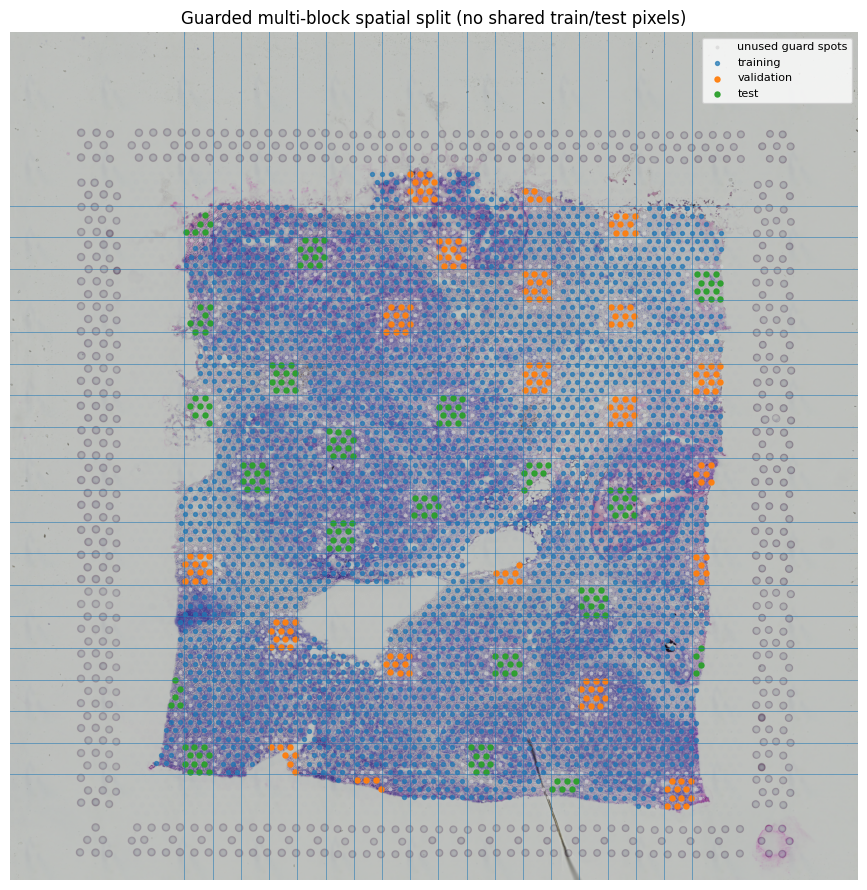


RNA preprocessing
------------------------------------------------------------------------
Original RNA dimension: 36,601 genes
Retained HVGs:           500 genes
RNA feature matrix:      (3798, 500)

First 15 selected HVGs:
['AL034417.3', 'ANGPTL7', 'TNFRSF1B', 'VWA5B1', 'HSPG2', 'ID3', 'RHCE', 'C1orf232', 'CD52', 'HCRTR1', 'AL109659.2', 'AL590440.2', 'AC099791.4', 'NEGR1', 'LRRIQ3']

DataLoaders
------------------------------------------------------------------------
Training mini-batches:   22
Validation mini-batches: 2
Test mini-batches:       2

Model capacity
------------------------------------------------------------------------
Image encoder parameters: 11,324,800
Image encoder trainable:  8,542,016
RNA encoder parameters:   405,824
RNA encoder trainable:    405,824
Total trainable:          8,947,840

Optimizer covers 8,947,840 trainable params (backbone + heads). OK.
Epoch 01 | train loss: 4.9614 | val loss: 4.4831 | val mean R@1: 0.008 | val mean R@5: 0.044  <- best
Epoch 

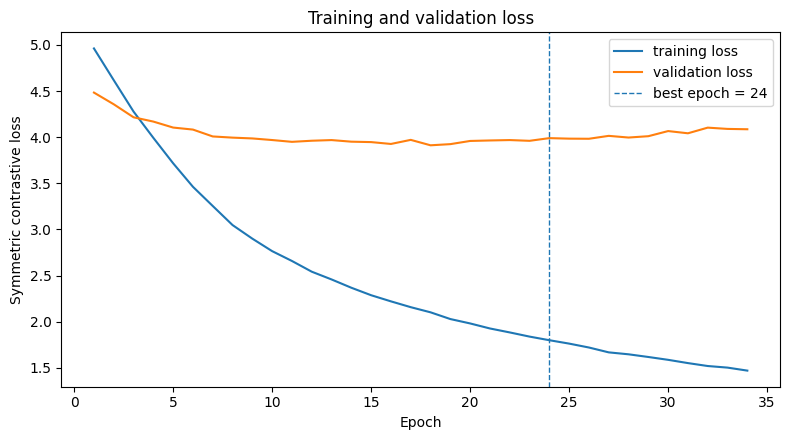

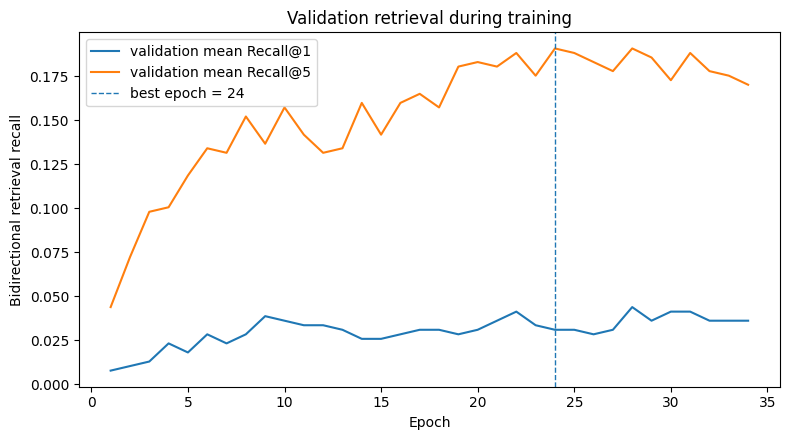

In [13]:
# ============================================================
# 9–10 — Train the paired image/RNA contrastive encoders
# ============================================================
#
# Assumes these already exist from earlier sections:
#   adata, coords_hires, hires_image, crop_he_patch, SEED, DEVICE,
#   Dataset, DataLoader, torch, np, pd, plt, sc, F, nn,
#   ResNet18ImageEncoder, RNAEncoder, normalize_for_resnet, TEMPERATURE
#
# This single cell is self-contained: it defines every constant it
# needs, so there is no separate 9.1 to run first.
# ============================================================

import copy
from scipy.spatial import cKDTree


# ------------------------------------------------------------
# 9.1 — All configuration (single source of truth)
# ------------------------------------------------------------

# H&E crop size (hires px). 64 gives ResNet layer4 real structure;
# the guard band scales with it automatically.
PATCH_SIZE = 64

SPLIT_MODE = "guarded_multi_block"

# Spatial grid and how many blocks are held out.
# NOTE: keep these modest — more held-out blocks = LESS training data,
# which makes overfitting worse on this small slide.


# Number of grid cells along each axis. The tissue is divided into an
N_BLOCKS_PER_AXIS = 20# N x N grid (e.g. 6 -> 36 cells). HIGHER = smaller blocks; LOWER = bigger blocks.
N_TEST_BLOCKS = 20 # How many of those grid cells are held out for the TEST set.
N_VAL_BLOCKS = 20# How many grid cells are held out for the VALIDATION set.
# A cell must contain at least this many spots to be eligible for selection.
MIN_SPOTS_PER_BLOCK = 4# Filters out near-empty edge cells. LOWER = more cells qualify (but smaller/noisier).




# Two P×P crops can share pixels when |dx|<P and |dy|<P;
# +1 px guards against integer rounding inside crop_he_patch.
GUARD_BAND_PX = float(PATCH_SIZE/2 + 1) # better to be float(PATCH_SIZE + 1)

BATCH_SIZE = 128
EPOCHS = 40
PATIENCE = 10                # stop near the val peak instead of chasing R@5 noise

LEARNING_RATE = 3e-4
WEIGHT_DECAY = 1e-3
BACKBONE_LR_SCALE = 0.1     # soft fine-tune the unfrozen ResNet block

N_HVG = 500
EMBEDDING_DIM = 64

RNA_HIDDEN_DIMS = [512, 256]
RNA_DROPOUT = 0.40

IMAGE_HEAD_HIDDEN_DIM = 256
IMAGE_HEAD_DROPOUT = 0.40

EXPERIMENT_NAME = (
    f"resnet18_layer4unfrozen_mlp_head_"
    f"hvg{N_HVG}_patch{PATCH_SIZE}_"
    f"guarded_blocks{N_BLOCKS_PER_AXIS}x{N_BLOCKS_PER_AXIS}_"
    f"test{N_TEST_BLOCKS}_val{N_VAL_BLOCKS}"
)
CHECKPOINT_PATH = f"best_{EXPERIMENT_NAME}.pt"

all_spot_idx = np.arange(adata.n_obs)

print("Experiment configuration")
print("-" * 72)
print(f"Patch size:               {PATCH_SIZE} x {PATCH_SIZE} hires pixels")
print(f"Spatial grid:             {N_BLOCKS_PER_AXIS} x {N_BLOCKS_PER_AXIS}")
print(f"Test / Val blocks:        {N_TEST_BLOCKS} / {N_VAL_BLOCKS}")
print(f"Min spots per block:      {MIN_SPOTS_PER_BLOCK}")
print(f"Guard-band width:         {GUARD_BAND_PX:.1f} hires pixels")
print(f"Batch size:               {BATCH_SIZE}")
print(f"N_HVG:                    {N_HVG}")
print(f"Checkpoint:               {CHECKPOINT_PATH}")


# ------------------------------------------------------------
# 9.2 — Create multiple small spatial blocks
# ------------------------------------------------------------

def make_spatial_blocks(coords_xy, n_blocks_per_axis):
    """Assign each tissue spot to one rectangular grid block."""
    x = coords_xy[:, 0]
    y = coords_xy[:, 1]
    x_edges = np.linspace(x.min(), x.max(), n_blocks_per_axis + 1)
    y_edges = np.linspace(y.min(), y.max(), n_blocks_per_axis + 1)
    x_bin = np.clip(np.digitize(x, x_edges[1:-1]), 0, n_blocks_per_axis - 1)
    y_bin = np.clip(np.digitize(y, y_edges[1:-1]), 0, n_blocks_per_axis - 1)
    block_ids = y_bin * n_blocks_per_axis + x_bin
    return block_ids, x_edges, y_edges


spatial_blocks, x_edges, y_edges = make_spatial_blocks(
    coords_hires, n_blocks_per_axis=N_BLOCKS_PER_AXIS
)

unique_block_ids, block_counts = np.unique(spatial_blocks, return_counts=True)
eligible_block_ids = unique_block_ids[block_counts >= MIN_SPOTS_PER_BLOCK]

n_required_blocks = N_TEST_BLOCKS + N_VAL_BLOCKS
if len(eligible_block_ids) < n_required_blocks:
    raise RuntimeError(
        "Not enough populated spatial blocks for this split.\n"
        f"Eligible blocks: {len(eligible_block_ids)}\n"
        f"Requested blocks: {n_required_blocks}\n\n"
        "Lower MIN_SPOTS_PER_BLOCK or reduce N_TEST_BLOCKS / N_VAL_BLOCKS."
    )

eligible_block_centres = np.vstack(
    [coords_hires[spatial_blocks == b].mean(axis=0) for b in eligible_block_ids]
)


def choose_spread_out_blocks(block_ids, block_centres_xy, n_select, seed):
    """Select spatially distributed blocks via farthest-point sampling."""
    rng = np.random.default_rng(seed)
    if n_select > len(block_ids):
        raise ValueError("Cannot select more blocks than are available.")

    selected = [int(rng.integers(len(block_ids)))]
    while len(selected) < n_select:
        remaining = np.array(
            [p for p in range(len(block_ids)) if p not in selected], dtype=int
        )
        d = np.linalg.norm(
            block_centres_xy[remaining][:, None, :]
            - block_centres_xy[selected][None, :, :],
            axis=2,
        )
        nearest = d.min(axis=1)
        best = nearest.max()
        tied = remaining[np.isclose(nearest, best)]
        selected.append(int(rng.choice(tied)))
    return block_ids[np.asarray(selected, dtype=int)]


heldout_block_ids = choose_spread_out_blocks(
    eligible_block_ids, eligible_block_centres, n_required_blocks, SEED
)
split_rng = np.random.default_rng(SEED + 17)
heldout_block_ids = split_rng.permutation(heldout_block_ids)

test_block_ids = heldout_block_ids[:N_TEST_BLOCKS]
val_block_ids = heldout_block_ids[N_TEST_BLOCKS:]

test_idx_raw = all_spot_idx[np.isin(spatial_blocks, test_block_ids)]
val_idx_raw = all_spot_idx[np.isin(spatial_blocks, val_block_ids)]
train_candidate_idx = all_spot_idx[~np.isin(spatial_blocks, heldout_block_ids)]


# ------------------------------------------------------------
# 9.2B — Remove crop overlap across split boundaries
# ------------------------------------------------------------

def remove_crop_overlaps(candidate_idx, forbidden_idx, coords_xy, guard_band_px):
    """Drop candidate spots whose P×P crop can overlap a forbidden crop."""
    candidate_idx = np.asarray(candidate_idx, dtype=int)
    forbidden_idx = np.asarray(forbidden_idx, dtype=int)
    if len(candidate_idx) == 0:
        return candidate_idx, candidate_idx
    if len(forbidden_idx) == 0:
        return candidate_idx, np.array([], dtype=int)

    tree = cKDTree(coords_xy[forbidden_idx])
    nearby = tree.query_ball_point(coords_xy[candidate_idx], r=guard_band_px, p=np.inf)
    overlaps = np.fromiter(
        (len(n) > 0 for n in nearby), dtype=bool, count=len(candidate_idx)
    )
    return candidate_idx[~overlaps], candidate_idx[overlaps]


def has_cross_split_crop_overlap(idx_a, idx_b, coords_xy, guard_band_px):
    _, overlapping = remove_crop_overlaps(idx_a, idx_b, coords_xy, guard_band_px)
    return len(overlapping) > 0


val_idx, val_guard_idx = remove_crop_overlaps(
    val_idx_raw, test_idx_raw, coords_hires, GUARD_BAND_PX
)
heldout_active_idx = np.concatenate([val_idx, test_idx_raw])
train_idx, train_guard_idx = remove_crop_overlaps(
    train_candidate_idx, heldout_active_idx, coords_hires, GUARD_BAND_PX
)
test_idx = test_idx_raw
unused_guard_idx = np.unique(np.concatenate([val_guard_idx, train_guard_idx]))

assert not has_cross_split_crop_overlap(train_idx, val_idx, coords_hires, GUARD_BAND_PX), \
    "Training and validation crops still overlap."
assert not has_cross_split_crop_overlap(train_idx, test_idx, coords_hires, GUARD_BAND_PX), \
    "Training and test crops still overlap."
assert not has_cross_split_crop_overlap(val_idx, test_idx, coords_hires, GUARD_BAND_PX), \
    "Validation and test crops still overlap."

if len(train_idx) < BATCH_SIZE:
    raise RuntimeError("Too few training spots after guard band. Reduce held-out blocks.")
if len(val_idx) < 10:
    raise RuntimeError("Too few validation spots after guard band.")
if len(test_idx) < 10:
    raise RuntimeError("Too few test spots after guard band.")

print()
print("Guarded multi-block paired-data split")
print("-" * 72)
print(f"Test block IDs:       {test_block_ids.tolist()}")
print(f"Validation block IDs: {val_block_ids.tolist()}")
print()
print(f"Training spots:       {len(train_idx):,}")
print(f"Validation spots:     {len(val_idx):,}")
print(f"Test spots:           {len(test_idx):,}")
print(f"Unused guard spots:   {len(unused_guard_idx):,}")
print()
print(f"Verified: no {PATCH_SIZE}x{PATCH_SIZE} crop shares pixels across splits.")


# ---- Visualize the split ----
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(hires_image)
if len(unused_guard_idx) > 0:
    ax.scatter(coords_hires[unused_guard_idx, 0], coords_hires[unused_guard_idx, 1],
               s=8, c="lightgray", alpha=0.65, linewidths=0, label="unused guard spots")
ax.scatter(coords_hires[train_idx, 0], coords_hires[train_idx, 1], s=8, alpha=0.70, label="training")
ax.scatter(coords_hires[val_idx, 0], coords_hires[val_idx, 1], s=13, alpha=0.95, label="validation")
ax.scatter(coords_hires[test_idx, 0], coords_hires[test_idx, 1], s=13, alpha=0.95, label="test")
for xe in x_edges[1:-1]:
    ax.axvline(xe, linewidth=0.7, alpha=0.55)
for ye in y_edges[1:-1]:
    ax.axhline(ye, linewidth=0.7, alpha=0.55)
ax.set_title("Guarded multi-block spatial split (no shared train/test pixels)")
ax.legend(loc="upper right", fontsize=8)
ax.axis("off")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 9.3 — Rebuild RNA features using TRAINING spots only
# ------------------------------------------------------------

adata_rna_all = adata.copy()
sc.pp.normalize_total(adata_rna_all, target_sum=1e4)
sc.pp.log1p(adata_rna_all)

adata_rna_train = adata_rna_all[train_idx].copy()
sc.pp.highly_variable_genes(adata_rna_train, flavor="seurat", n_top_genes=N_HVG)
hvg_mask = adata_rna_train.var["highly_variable"].to_numpy()
hvg_names = adata_rna_train.var_names[hvg_mask].to_numpy()

rna_features = adata_rna_all[:, hvg_names].X
if hasattr(rna_features, "toarray"):
    rna_features = rna_features.toarray()
rna_features = np.asarray(rna_features, dtype=np.float32)

rna_train_mean = rna_features[train_idx].mean(axis=0, keepdims=True)
rna_train_std = np.maximum(rna_features[train_idx].std(axis=0, keepdims=True), 1e-6)
rna_features = (rna_features - rna_train_mean) / rna_train_std

print()
print("RNA preprocessing")
print("-" * 72)
print(f"Original RNA dimension: {adata.n_vars:,} genes")
print(f"Retained HVGs:           {rna_features.shape[1]:,} genes")
print(f"RNA feature matrix:      {rna_features.shape}")
print()
print("First 15 selected HVGs:")
print(hvg_names[:15].tolist())


# ------------------------------------------------------------
# 9.4 — Paired Dataset and DataLoaders
# ------------------------------------------------------------

class VisiumPairedDataset(Dataset):
    def __init__(self, spot_indices, image, coordinates, rna_matrix, patch_size):
        self.spot_indices = np.asarray(spot_indices, dtype=int)
        self.image = image
        self.coordinates = coordinates
        self.rna_matrix = rna_matrix
        self.patch_size = patch_size

    def __len__(self):
        return len(self.spot_indices)

    def __getitem__(self, local_position):
        global_idx = self.spot_indices[local_position]
        image_patch = crop_he_patch(
            image=self.image, centre_xy=self.coordinates[global_idx],
            patch_size=self.patch_size,
        )
        image_tensor = torch.from_numpy(
            np.transpose(image_patch, (2, 0, 1)).copy()
        ).float()
        rna_tensor = torch.from_numpy(self.rna_matrix[global_idx].copy()).float()
        return image_tensor, rna_tensor, global_idx


train_dataset = VisiumPairedDataset(train_idx, hires_image, coords_hires, rna_features, PATCH_SIZE)
val_dataset = VisiumPairedDataset(val_idx, hires_image, coords_hires, rna_features, PATCH_SIZE)
test_dataset = VisiumPairedDataset(test_idx, hires_image, coords_hires, rna_features, PATCH_SIZE)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print()
print("DataLoaders")
print("-" * 72)
print(f"Training mini-batches:   {len(train_loader):,}")
print(f"Validation mini-batches: {len(val_loader):,}")
print(f"Test mini-batches:       {len(test_loader):,}")


# ------------------------------------------------------------
# 9.5 — Create encoders (layer4 unfrozen by default in Section 6)
# ------------------------------------------------------------

torch.manual_seed(SEED)

image_encoder = ResNet18ImageEncoder(
    embedding_dim=EMBEDDING_DIM,
    head_hidden_dim=IMAGE_HEAD_HIDDEN_DIM,
    head_dropout=IMAGE_HEAD_DROPOUT,
).to(DEVICE)

rna_encoder = RNAEncoder(
    input_dim=N_HVG, hidden_dims=RNA_HIDDEN_DIMS,
    embedding_dim=EMBEDDING_DIM, dropout=RNA_DROPOUT,
).to(DEVICE)


def count_parameters(model, trainable_only=False):
    params = model.parameters()
    if trainable_only:
        params = [p for p in params if p.requires_grad]
    return sum(p.numel() for p in params)


print()
print("Model capacity")
print("-" * 72)
print(f"Image encoder parameters: {count_parameters(image_encoder):,}")
print(f"Image encoder trainable:  {count_parameters(image_encoder, True):,}")
print(f"RNA encoder parameters:   {count_parameters(rna_encoder):,}")
print(f"RNA encoder trainable:    {count_parameters(rna_encoder, True):,}")
print(f"Total trainable:          "
      f"{count_parameters(image_encoder, True) + count_parameters(rna_encoder, True):,}")


# ------------------------------------------------------------
# 9.6 — Optimizer (must run AFTER 9.5 so it binds to this encoder)
# ------------------------------------------------------------

backbone_trainable_params = [
    p for p in image_encoder.backbone.parameters() if p.requires_grad
]
assert len(backbone_trainable_params) > 0, (
    "No trainable backbone params — Section 6 must unfreeze layer4."
)

optimizer = torch.optim.AdamW(
    [
        {"params": backbone_trainable_params, "lr": LEARNING_RATE * BACKBONE_LR_SCALE},
        {"params": image_encoder.to_shared_space.parameters(), "lr": LEARNING_RATE},
        {"params": rna_encoder.parameters(), "lr": LEARNING_RATE},
    ],
    weight_decay=WEIGHT_DECAY,
)

_n_opt = sum(p.numel() for g in optimizer.param_groups for p in g["params"])
_n_tr = (count_parameters(image_encoder, True) + count_parameters(rna_encoder, True))
assert _n_opt == _n_tr, "Optimizer does not cover all trainable params."
print()
print(f"Optimizer covers {_n_opt:,} trainable params (backbone + heads). OK.")


# ------------------------------------------------------------
# 9.7 — Contrastive forward pass
# ------------------------------------------------------------

def contrastive_forward(image_batch, rna_batch):
    normalized_images = normalize_for_resnet(image_batch.to(DEVICE))
    rna_batch = rna_batch.to(DEVICE)
    z_image = image_encoder(normalized_images)
    z_rna = rna_encoder(rna_batch)
    logits = (z_image @ z_rna.T) / TEMPERATURE
    targets = torch.arange(image_batch.shape[0], device=DEVICE)
    loss_i2r = F.cross_entropy(logits, targets)
    loss_r2i = F.cross_entropy(logits.T, targets)
    loss_align = 0.5 * (loss_i2r + loss_r2i)
    return loss_align, loss_i2r, loss_r2i, logits


# ------------------------------------------------------------
# 9.8 — One training epoch
# ------------------------------------------------------------

def train_one_epoch(data_loader):
    image_encoder.train()
    rna_encoder.train()
    total_loss = 0.0
    total = 0
    for image_batch, rna_batch, _ in data_loader:
        if image_batch.shape[0] < 2:
            continue
        loss_align, _, _, _ = contrastive_forward(image_batch, rna_batch)
        optimizer.zero_grad(set_to_none=True)
        loss_align.backward()
        optimizer.step()
        bs = image_batch.shape[0]
        total_loss += loss_align.item() * bs
        total += bs
    return total_loss / max(total, 1)


# ------------------------------------------------------------
# 10.1 — Validation loss
# ------------------------------------------------------------

@torch.no_grad()
def evaluate_batchwise_loss(data_loader):
    image_encoder.eval()
    rna_encoder.eval()
    total_loss = 0.0
    total = 0
    for image_batch, rna_batch, _ in data_loader:
        if image_batch.shape[0] < 2:
            continue
        loss_align, _, _, _ = contrastive_forward(image_batch, rna_batch)
        bs = image_batch.shape[0]
        total_loss += loss_align.item() * bs
        total += bs
    return total_loss / max(total, 1)


# ------------------------------------------------------------
# 10.2 — Encode a split + Recall@k
# ------------------------------------------------------------

@torch.no_grad()
def encode_all_pairs(data_loader):
    image_encoder.eval()
    rna_encoder.eval()
    imgs, rnas, idxs = [], [], []
    for image_batch, rna_batch, idx_batch in data_loader:
        normalized_images = normalize_for_resnet(image_batch.to(DEVICE))
        imgs.append(image_encoder(normalized_images).cpu())
        rnas.append(rna_encoder(rna_batch.to(DEVICE)).cpu())
        idxs.append(idx_batch.cpu())
    return torch.cat(imgs), torch.cat(rnas), torch.cat(idxs).numpy()


def recall_at_k(score_matrix, k):
    n = score_matrix.shape[0]
    k = min(k, n)
    targets = torch.arange(n, device=score_matrix.device)
    top = score_matrix.topk(k=k, dim=1).indices
    return (top == targets[:, None]).any(dim=1).float().mean().item()


@torch.no_grad()
def evaluate_retrieval(data_loader):
    z_image, z_rna, _ = encode_all_pairs(data_loader)
    s = z_image @ z_rna.T
    i2r_r1 = recall_at_k(s, 1)
    i2r_r5 = recall_at_k(s, 5)
    r2i_r1 = recall_at_k(s.T, 1)
    r2i_r5 = recall_at_k(s.T, 5)
    return {
        "image_to_rna_r1": i2r_r1, "image_to_rna_r5": i2r_r5,
        "rna_to_image_r1": r2i_r1, "rna_to_image_r5": r2i_r5,
        "mean_r1": 0.5 * (i2r_r1 + r2i_r1),
        "mean_r5": 0.5 * (i2r_r5 + r2i_r5),
    }


# ------------------------------------------------------------
# 10.3 — Train loop
# ------------------------------------------------------------

history = {"epoch": [], "train_loss": [], "val_loss": [], "val_mean_r1": [], "val_mean_r5": []}
best_val_mean_r5 = -float("inf")
best_val_loss = float("inf")
best_epoch = 0
epochs_without_improvement = 0
best_image_encoder_state = None
best_rna_encoder_state = None

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(train_loader)
    val_loss = evaluate_batchwise_loss(val_loader)
    vr = evaluate_retrieval(val_loader)
    val_mean_r1 = vr["mean_r1"]
    val_mean_r5 = vr["mean_r5"]

    history["epoch"].append(epoch)
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["val_mean_r1"].append(val_mean_r1)
    history["val_mean_r5"].append(val_mean_r5)

    improved = val_mean_r5 > best_val_mean_r5
    if np.isclose(val_mean_r5, best_val_mean_r5) and val_loss < best_val_loss:
        improved = True

    if improved:
        best_val_mean_r5 = val_mean_r5
        best_val_loss = val_loss
        best_epoch = epoch
        epochs_without_improvement = 0
        best_image_encoder_state = copy.deepcopy(image_encoder.state_dict())
        best_rna_encoder_state = copy.deepcopy(rna_encoder.state_dict())
        torch.save(
            {
                "experiment_name": EXPERIMENT_NAME, "split_mode": SPLIT_MODE,
                "patch_size": PATCH_SIZE, "guard_band_px": GUARD_BAND_PX,
                "n_blocks_per_axis": N_BLOCKS_PER_AXIS,
                "test_block_ids": test_block_ids, "val_block_ids": val_block_ids,
                "epoch": best_epoch, "validation_loss": best_val_loss,
                "validation_mean_recall_at_5": best_val_mean_r5,
                "image_encoder_state_dict": best_image_encoder_state,
                "rna_encoder_state_dict": best_rna_encoder_state,
                "hvg_names": hvg_names,
                "train_idx": train_idx, "val_idx": val_idx, "test_idx": test_idx,
                "unused_guard_idx": unused_guard_idx,
            },
            CHECKPOINT_PATH,
        )
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch {epoch:02d} | train loss: {train_loss:.4f} | "
        f"val loss: {val_loss:.4f} | val mean R@1: {val_mean_r1:.3f} | "
        f"val mean R@5: {val_mean_r5:.3f}" + ("  <- best" if improved else "")
    )

    if epochs_without_improvement >= PATIENCE:
        print()
        print(f"Early stopping after {PATIENCE} epochs without R@5 improvement.")
        break


# ------------------------------------------------------------
# 10.4 — Restore best checkpoint
# ------------------------------------------------------------

if best_image_encoder_state is None:
    raise RuntimeError("No valid checkpoint was saved during training.")

image_encoder.load_state_dict(best_image_encoder_state)
rna_encoder.load_state_dict(best_rna_encoder_state)

print()
print("Best validation checkpoint restored")
print("-" * 72)
print(f"Best epoch:                    {best_epoch}")
print(f"Best validation loss:          {best_val_loss:.4f}")
print(f"Best validation mean Recall@5: {best_val_mean_r5:.3f}")
print(f"Saved checkpoint:              {CHECKPOINT_PATH}")


# ------------------------------------------------------------
# 10.5 — Plot training history
# ------------------------------------------------------------

history_df = pd.DataFrame(history)

plt.figure(figsize=(8, 4.5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="training loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="validation loss")
plt.axvline(best_epoch, linestyle="--", linewidth=1, label=f"best epoch = {best_epoch}")
plt.xlabel("Epoch")
plt.ylabel("Symmetric contrastive loss")
plt.title("Training and validation loss")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4.5))
plt.plot(history_df["epoch"], history_df["val_mean_r1"], label="validation mean Recall@1")
plt.plot(history_df["epoch"], history_df["val_mean_r5"], label="validation mean Recall@5")
plt.axvline(best_epoch, linestyle="--", linewidth=1, label=f"best epoch = {best_epoch}")
plt.xlabel("Epoch")
plt.ylabel("Bidirectional retrieval recall")
plt.title("Validation retrieval during training")
plt.legend()
plt.tight_layout()
plt.show()

## 11 — Evaluate held-out paired retrieval

All visualizations and metrics in this section use only the held-out test spots.

First, we pass every held-out H&E patch and every held-out RNA profile through the trained encoders:

$$
z_i^{\mathrm{image}}
=
f_{\mathrm{image}}
\left(
x_i^{\mathrm{image}}
\right)
$$

$$
z_i^{\mathrm{RNA}}
=
f_{\mathrm{RNA}}
\left(
x_i^{\mathrm{RNA}}
\right).
$$

Both representations lie in the learned shared space:

$$
z_i^{\mathrm{image}},
z_i^{\mathrm{RNA}}
\in
\mathbb{R}^{128}.
$$

We first visualize the geometry of this learned space using PCA and UMAP.

These visualizations are diagnostic only. A visually overlapping image and RNA cloud does not by itself prove correct pairing.

The main evaluation comes later: given one held-out H&E embedding, can the model retrieve its exact paired RNA embedding, and vice versa?

Held-out test embeddings
------------------------------------------------------------------------
Number of held-out pairs: 193
Image embedding shape:    (193, 64)
RNA embedding shape:      (193, 64)

Mean image-embedding length:
1.0
Mean RNA-embedding length:
1.0

Joint embedding matrix: (386, 64)

Highlighted held-out pair positions:
[111 129 171 177 118 149]

PCA variance explained: PC1 = 18.8%, PC2 = 17.2%


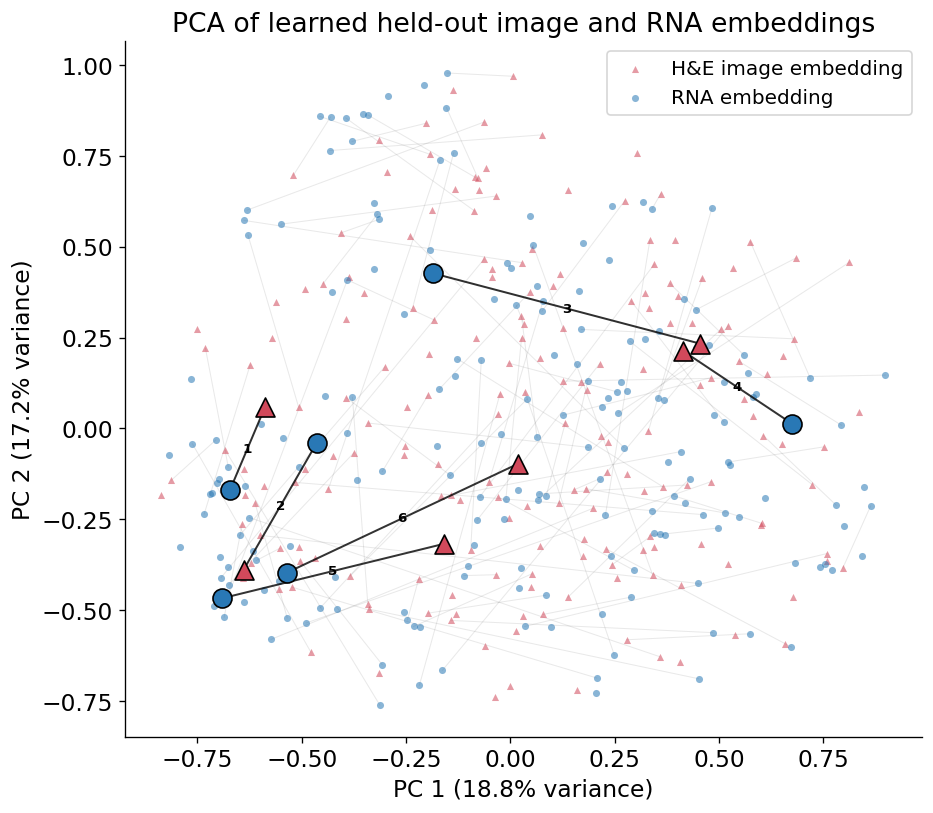

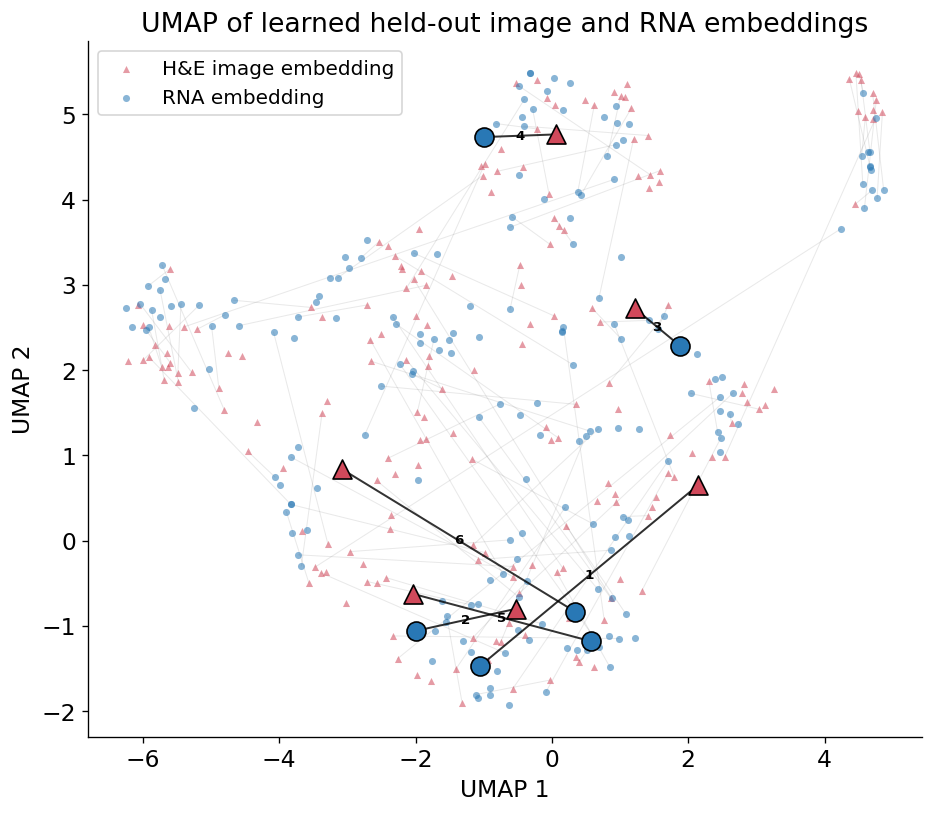

In [19]:
# ============================================================
# 11.1–11.2 — Encode held-out pairs and visualize learned Z
# ============================================================

from sklearn.decomposition import PCA
import anndata as ad


# ------------------------------------------------------------
# 11.1 — Encode every held-out H&E patch and RNA profile
# ------------------------------------------------------------
#
# encode_all_pairs(...) was defined in Section 9–10.
#
# The returned rows remain paired:
#
# test_z_image[i] ↔ test_z_rna[i]
#
# and both correspond to:
#
# test_global_idx[i]

test_z_image, test_z_rna, test_global_idx = encode_all_pairs(
    test_loader
)

test_z_image_np = test_z_image.numpy()
test_z_rna_np = test_z_rna.numpy()

n_test = len(test_global_idx)

print("Held-out test embeddings")
print("-" * 72)
print(f"Number of held-out pairs: {n_test}")
print(f"Image embedding shape:    {test_z_image_np.shape}")
print(f"RNA embedding shape:      {test_z_rna_np.shape}")

print()
print("Mean image-embedding length:")
print(np.linalg.norm(test_z_image_np, axis=1).mean())

print("Mean RNA-embedding length:")
print(np.linalg.norm(test_z_rna_np, axis=1).mean())


# ------------------------------------------------------------
# Combine both modalities into one matrix for visualization
# ------------------------------------------------------------
#
# First n_test rows:
#     H&E embeddings
#
# Next n_test rows:
#     paired RNA embeddings

joint_z = np.vstack(
    [
        test_z_image_np,
        test_z_rna_np,
    ]
).astype(np.float32)

modality_labels = np.array(
    ["H&E image"] * n_test
    +
    ["RNA"] * n_test
)

pair_positions = np.concatenate(
    [
        np.arange(n_test),
        np.arange(n_test),
    ]
)

joint_global_idx = np.concatenate(
    [
        test_global_idx,
        test_global_idx,
    ]
)

print()
print("Joint embedding matrix:", joint_z.shape)


# ------------------------------------------------------------
# Select a small set of held-out true pairs to highlight
# ------------------------------------------------------------
#
# These exact same pair positions will later be used for:
#
# - tissue-location plots
# - H&E patch panels
# - PCA and UMAP highlights
# - retrieval examples

RNG_EVAL = np.random.default_rng(SEED)

N_HIGHLIGHT_PAIRS = min(6, n_test)

highlight_pair_pos = RNG_EVAL.choice(
    n_test,
    size=N_HIGHLIGHT_PAIRS,
    replace=False,
)

print()
print("Highlighted held-out pair positions:")
print(highlight_pair_pos)


# ------------------------------------------------------------
# 11.2A — PCA of learned shared embeddings
# ------------------------------------------------------------

pca = PCA(
    n_components=2,
    random_state=SEED,
)

joint_z_pca = pca.fit_transform(joint_z)

explained_variance = (
    100 * pca.explained_variance_ratio_
)

print()
print(
    "PCA variance explained: "
    f"PC1 = {explained_variance[0]:.1f}%, "
    f"PC2 = {explained_variance[1]:.1f}%"
)


# ------------------------------------------------------------
# 11.2B — UMAP of learned shared embeddings
# ------------------------------------------------------------
#
# Because all Z vectors are unit-normalized:
#
# ||z_a - z_b||^2 = 2 - 2 z_a^T z_b
#
# So Euclidean neighbourhoods in Z correspond directly to
# cosine-similarity neighbourhoods.

adata_z = ad.AnnData(
    X=joint_z,
)

adata_z.obs["modality"] = modality_labels
adata_z.obs["pair_position"] = pair_positions.astype(str)
adata_z.obs["global_spot_idx"] = joint_global_idx.astype(str)

sc.pp.neighbors(
    adata_z,
    n_neighbors=15,
    use_rep="X",
)

sc.tl.umap(
    adata_z,
    random_state=SEED,
    min_dist=0.25,
)

joint_z_umap = adata_z.obsm["X_umap"]


# ------------------------------------------------------------
# Helper — plot paired embeddings in a 2D view
# ------------------------------------------------------------

IMAGE_COLOR = "#D1495B"
RNA_COLOR = "#2978B5"
PAIR_LINE_COLOR = "#4A4A4A"

N_PAIR_LINES = min(100, n_test)

pair_line_positions = RNG_EVAL.choice(
    n_test,
    size=N_PAIR_LINES,
    replace=False,
)


def plot_joint_embedding(
    coordinates,
    title,
    x_label,
    y_label,
):
    """
    Plot image and RNA embeddings in one 2D coordinate system.

    A faint line connects each sampled true image–RNA pair.
    Large numbered points mark the selected held-out pairs.
    """
    fig, ax = plt.subplots(
        figsize=(8, 7),
    )

    # Faint lines connect the two members of true pairs.
    for pair_pos in pair_line_positions:
        ax.plot(
            [
                coordinates[pair_pos, 0],
                coordinates[n_test + pair_pos, 0],
            ],
            [
                coordinates[pair_pos, 1],
                coordinates[n_test + pair_pos, 1],
            ],
            color=PAIR_LINE_COLOR,
            alpha=0.12,
            linewidth=0.6,
            zorder=1,
        )

    # All held-out H&E embeddings.
    ax.scatter(
        coordinates[:n_test, 0],
        coordinates[:n_test, 1],
        s=18,
        marker="^",
        c=IMAGE_COLOR,
        alpha=0.55,
        linewidths=0,
        label="H&E image embedding",
        zorder=2,
    )

    # All held-out RNA embeddings.
    ax.scatter(
        coordinates[n_test:, 0],
        coordinates[n_test:, 1],
        s=18,
        marker="o",
        c=RNA_COLOR,
        alpha=0.55,
        linewidths=0,
        label="RNA embedding",
        zorder=2,
    )

    # Highlight the same six true pairs in both modalities.
    for number, pair_pos in enumerate(
        highlight_pair_pos,
        start=1,
    ):
        image_point = coordinates[pair_pos]
        rna_point = coordinates[n_test + pair_pos]

        ax.plot(
            [image_point[0], rna_point[0]],
            [image_point[1], rna_point[1]],
            color="black",
            alpha=0.8,
            linewidth=1.2,
            zorder=4,
        )

        ax.scatter(
            image_point[0],
            image_point[1],
            s=130,
            marker="^",
            c=IMAGE_COLOR,
            edgecolors="black",
            linewidths=1.0,
            zorder=5,
        )

        ax.scatter(
            rna_point[0],
            rna_point[1],
            s=130,
            marker="o",
            c=RNA_COLOR,
            edgecolors="black",
            linewidths=1.0,
            zorder=5,
        )

        midpoint = 0.5 * (
            image_point + rna_point
        )

        ax.text(
            midpoint[0],
            midpoint[1],
            str(number),
            ha="center",
            va="center",
            fontsize=8,
            fontweight="bold",
            color="black",
            zorder=6,
        )

    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.legend(loc="best")
    plt.tight_layout()
    plt.show()


# ------------------------------------------------------------
# PCA visualisation
# ------------------------------------------------------------

plot_joint_embedding(
    coordinates=joint_z_pca,
    title=(
        "PCA of learned held-out image and RNA embeddings"
    ),
    x_label=(
        f"PC 1 ({explained_variance[0]:.1f}% variance)"
    ),
    y_label=(
        f"PC 2 ({explained_variance[1]:.1f}% variance)"
    ),
)


# ------------------------------------------------------------
# UMAP visualisation
# ------------------------------------------------------------

plot_joint_embedding(
    coordinates=joint_z_umap,
    title=(
        "UMAP of learned held-out image and RNA embeddings"
    ),
    x_label="UMAP 1",
    y_label="UMAP 2",
)

## 11.3 — Rank held-out cross-modal candidates

For every held-out H&E image embedding, we compare it with every held-out RNA embedding:

$$
S_{ij}
=
\left(
z_i^{\mathrm{image}}
\right)^\top
z_j^{\mathrm{RNA}}.
$$

For image query $i$, the RNA candidates are ranked from highest to lowest score.

The true paired RNA profile is candidate $i$.

Its rank is:

$$
r_i^{\mathrm{image}\rightarrow\mathrm{RNA}}
=
1
+
\sum_{j \neq i}
\mathbb{I}
\left[
S_{ij}
>
S_{ii}
\right].
$$

A rank of $1$ means the correct paired RNA profile was retrieved first.

We compute the same quantity in the reverse direction:

$$
r_i^{\mathrm{RNA}\rightarrow\mathrm{image}}.
$$

We summarize retrieval using:

$$
\mathrm{Recall@}k
=
\frac{
\text{number of queries whose true pair is in the top } k
}{
\text{number of queries}
}.
$$

We also report:

$$
\mathrm{MRR}
=
\frac{1}{N}
\sum_{i=1}^{N}
\frac{1}{r_i},
$$

where a larger mean reciprocal rank means that correct pairs tend to appear closer to the top of the ranked list.

Held-out retrieval matrix
------------------------------------------------------------------------
Number of held-out pairs: 193
Score matrix shape:       (193, 193)
Random Recall@1 baseline: 0.0052
Random Recall@5 baseline: 0.0259

Example ranks
------------------------------------------------------------------------
Held-out pair   0 | H&E → RNA rank:   7 | RNA → H&E rank:   5
Held-out pair   1 | H&E → RNA rank:   4 | RNA → H&E rank:   5
Held-out pair   2 | H&E → RNA rank:  25 | RNA → H&E rank:  24
Held-out pair   3 | H&E → RNA rank:  59 | RNA → H&E rank:  73
Held-out pair   4 | H&E → RNA rank:  73 | RNA → H&E rank:  79
Held-out pair   5 | H&E → RNA rank:   3 | RNA → H&E rank:   5
Held-out pair   6 | H&E → RNA rank:  24 | RNA → H&E rank:  26
Held-out pair   7 | H&E → RNA rank:   3 | RNA → H&E rank:   6
Held-out pair   8 | H&E → RNA rank:  41 | RNA → H&E rank:  65
Held-out pair   9 | H&E → RNA rank:   3 | RNA → H&E rank:   9


,H&E → RNA,RNA → H&E
Recall@1,0.057,0.031
Recall@5,0.176,0.161
Recall@10,0.301,0.264
MRR,0.128,0.114
Median rank,25.000,25.000
Mean rank,36.171,34.865


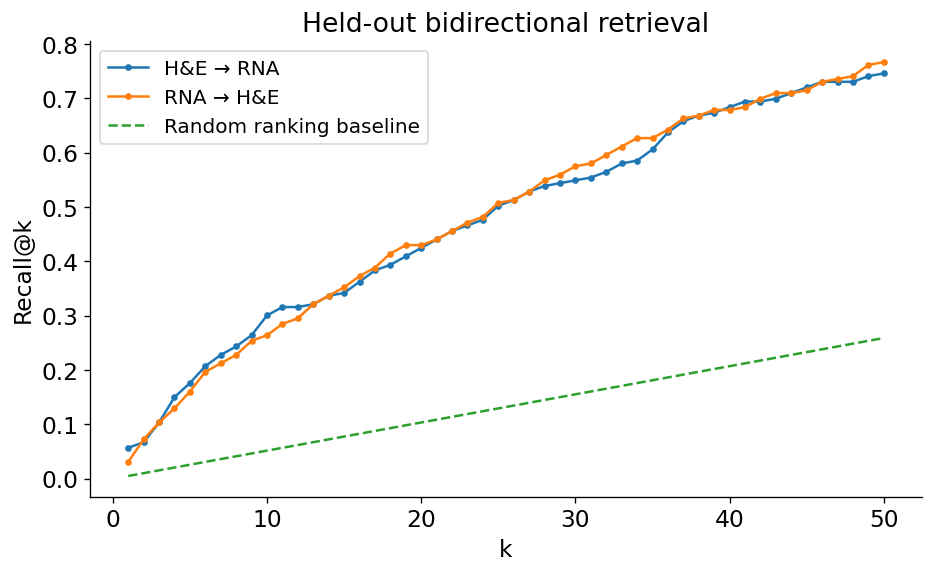

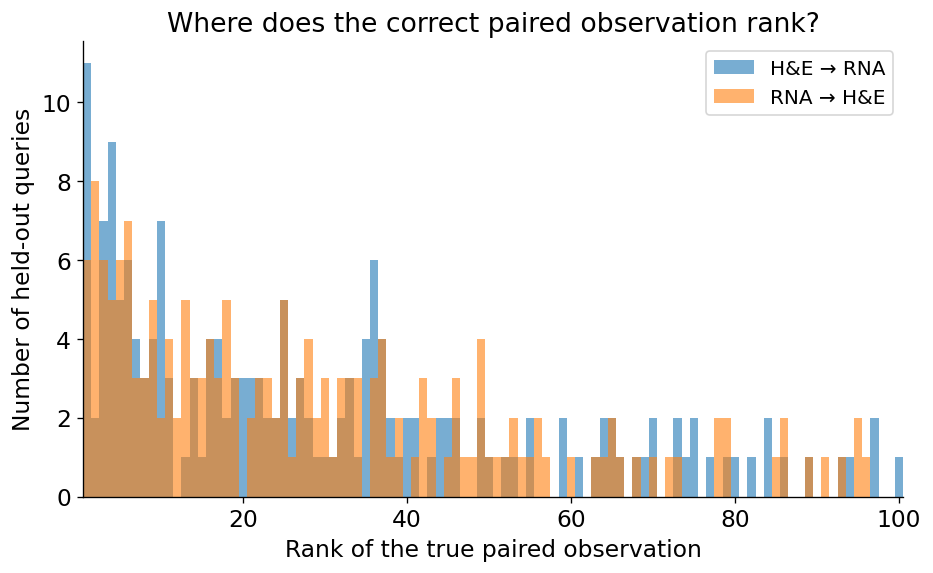

In [20]:
# ============================================================
# 11.3–11.5 — Held-out bidirectional retrieval evaluation
# ============================================================

# test_z_image[i] and test_z_rna[i] are the known held-out pair.
#
# Both embedding matrices have shape:
#
#     (N_test, 128)
#
# Therefore:
#
#     test_scores[i, j]
#
# is the cosine similarity between:
#
#     H&E image query i
#
# and:
#
#     RNA candidate j

test_scores = test_z_image @ test_z_rna.T

n_test = test_scores.shape[0]

print("Held-out retrieval matrix")
print("-" * 72)
print(f"Number of held-out pairs: {n_test}")
print(f"Score matrix shape:       {tuple(test_scores.shape)}")
print(
    "Random Recall@1 baseline: "
    f"{1 / n_test:.4f}"
)
print(
    "Random Recall@5 baseline: "
    f"{min(5, n_test) / n_test:.4f}"
)


# ------------------------------------------------------------
# Helper — rank the correct diagonal candidate for every query
# ------------------------------------------------------------

def true_pair_ranks(score_matrix):
    """
    Return the rank of the true paired candidate for every query.

    score_matrix[i, j]:
        score between query i and candidate j.

    The known correct answer for query i is candidate i.

    Returns
    -------
    ranks:
        Tensor of shape (N_queries,).

        ranks[i] = 1 means the true pair was ranked first.
    """
    n_queries = score_matrix.shape[0]

    ranked_candidate_indices = torch.argsort(
        score_matrix,
        dim=1,
        descending=True,
    )

    true_candidate_indices = torch.arange(
        n_queries,
        device=score_matrix.device,
    )

    true_pair_positions = (
        ranked_candidate_indices
        ==
        true_candidate_indices[:, None]
    ).nonzero(
        as_tuple=False
    )

    ranks = torch.empty(
        n_queries,
        dtype=torch.long,
        device=score_matrix.device,
    )

    # Column 0: query index
    # Column 1: zero-based rank position
    ranks[true_pair_positions[:, 0]] = (
        true_pair_positions[:, 1] + 1
    )

    return ranks


# ------------------------------------------------------------
# Helper — summarize ranking quality
# ------------------------------------------------------------

def retrieval_metrics(ranks, max_k=50):
    """
    Compute Recall@k, MRR, mean rank, and median rank.
    """
    ranks_np = ranks.detach().cpu().numpy()

    max_k = min(max_k, len(ranks_np))

    recall_at_k = {
        f"Recall@{k}": float(
            np.mean(ranks_np <= k)
        )
        for k in range(1, max_k + 1)
    }

    mrr = float(
        np.mean(1.0 / ranks_np)
    )

    return {
        "mean rank": float(np.mean(ranks_np)),
        "median rank": float(np.median(ranks_np)),
        "MRR": mrr,
        **recall_at_k,
    }


# ------------------------------------------------------------
# 11.3 — Compute ranks in both directions
# ------------------------------------------------------------

# Rows = H&E image queries
# Columns = RNA candidates
image_to_rna_ranks = true_pair_ranks(
    test_scores
)

# Rows = RNA queries
# Columns = H&E image candidates
rna_to_image_ranks = true_pair_ranks(
    test_scores.T
)

print()
print("Example ranks")
print("-" * 72)

for i in range(min(10, n_test)):
    print(
        f"Held-out pair {i:3d} | "
        f"H&E → RNA rank: {image_to_rna_ranks[i].item():3d} | "
        f"RNA → H&E rank: {rna_to_image_ranks[i].item():3d}"
    )


# ------------------------------------------------------------
# 11.4 — Report core retrieval metrics
# ------------------------------------------------------------

MAX_K = min(50, n_test)

image_to_rna_metrics = retrieval_metrics(
    image_to_rna_ranks,
    max_k=MAX_K,
)

rna_to_image_metrics = retrieval_metrics(
    rna_to_image_ranks,
    max_k=MAX_K,
)

summary_metrics = pd.DataFrame(
    {
        "H&E → RNA": {
            "Recall@1": image_to_rna_metrics["Recall@1"],
            "Recall@5": image_to_rna_metrics["Recall@5"],
            "Recall@10": image_to_rna_metrics["Recall@10"],
            "MRR": image_to_rna_metrics["MRR"],
            "Median rank": image_to_rna_metrics["median rank"],
            "Mean rank": image_to_rna_metrics["mean rank"],
        },
        "RNA → H&E": {
            "Recall@1": rna_to_image_metrics["Recall@1"],
            "Recall@5": rna_to_image_metrics["Recall@5"],
            "Recall@10": rna_to_image_metrics["Recall@10"],
            "MRR": rna_to_image_metrics["MRR"],
            "Median rank": rna_to_image_metrics["median rank"],
            "Mean rank": rna_to_image_metrics["mean rank"],
        },
    }
)

display(
    summary_metrics.style.format(
        {
            "H&E → RNA": "{:.3f}",
            "RNA → H&E": "{:.3f}",
        }
    )
)


# ------------------------------------------------------------
# 11.5 — Plot the Recall@k / CMC curve
# ------------------------------------------------------------
#
# This is the main quantitative retrieval curve.
#
# It answers:
#
# "How many top candidates must we inspect before finding
#  the true paired observation?"

k_values = np.arange(1, MAX_K + 1)

image_to_rna_recall_curve = np.array(
    [
        np.mean(
            image_to_rna_ranks.cpu().numpy() <= k
        )
        for k in k_values
    ]
)

rna_to_image_recall_curve = np.array(
    [
        np.mean(
            rna_to_image_ranks.cpu().numpy() <= k
        )
        for k in k_values
    ]
)

random_recall_curve = k_values / n_test

plt.figure(figsize=(8, 5))

plt.plot(
    k_values,
    image_to_rna_recall_curve,
    marker="o",
    markersize=3,
    label="H&E → RNA",
)

plt.plot(
    k_values,
    rna_to_image_recall_curve,
    marker="o",
    markersize=3,
    label="RNA → H&E",
)

plt.plot(
    k_values,
    random_recall_curve,
    linestyle="--",
    label="Random ranking baseline",
)

plt.xlabel("k")
plt.ylabel("Recall@k")
plt.title("Held-out bidirectional retrieval")
plt.legend()
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Plot rank distributions
# ------------------------------------------------------------

MAX_RANK_TO_SHOW = min(100, n_test)

plt.figure(figsize=(8, 5))

plt.hist(
    image_to_rna_ranks.cpu().numpy(),
    bins=np.arange(0.5, MAX_RANK_TO_SHOW + 1.5, 1),
    alpha=0.6,
    label="H&E → RNA",
)

plt.hist(
    rna_to_image_ranks.cpu().numpy(),
    bins=np.arange(0.5, MAX_RANK_TO_SHOW + 1.5, 1),
    alpha=0.6,
    label="RNA → H&E",
)

plt.xlim(0.5, MAX_RANK_TO_SHOW + 0.5)

plt.xlabel("Rank of the true paired observation")
plt.ylabel("Number of held-out queries")
plt.title("Where does the correct paired observation rank?")
plt.legend()
plt.tight_layout()
plt.show()

## 11.6 — Inspect individual held-out retrievals

Recall@k tells us how often the exact paired observation is retrieved near the top of the ranked list.

We now inspect individual held-out retrieval examples.

For one H&E query patch:

$$
x_i^{\mathrm{image}},
$$

we rank every held-out RNA candidate:

$$
x_1^{\mathrm{RNA}},
x_2^{\mathrm{RNA}},
\ldots,
x_{N_{\mathrm{test}}}^{\mathrm{RNA}}.
$$

We visualize:

1. the query H\&E patch;
2. the true paired RNA spot on the tissue image;
3. the top retrieved RNA spots;
4. the H\&E patches surrounding those retrieved spots;
5. the RNA genes associated with the true spot and top retrieval.

An exact retrieval failure is not always a biologically meaningless failure. A retrieved spot may be spatially nearby or belong to a similar tissue compartment.

In [21]:
# ============================================================
# 11.6 — Define retrieval-inspection helper
# ============================================================

def dense_expression_row(adata_object, global_idx):
    """
    Return one RNA-expression row as a dense 1D NumPy array.
    """
    x = adata_object.X[global_idx]

    if hasattr(x, "toarray"):
        x = x.toarray()

    return np.asarray(x).ravel()


def top_genes_for_spot(global_idx, n_genes=8):
    """
    Return the highest expressed genes at one Visium spot.

    Uses the log-normalized RNA matrix created in Section 9–10.
    """
    expression = dense_expression_row(
        adata_rna_all,
        global_idx,
    )

    top_gene_positions = np.argsort(
        expression
    )[-n_genes:][::-1]

    return pd.DataFrame(
        {
            "gene": adata_rna_all.var_names[
                top_gene_positions
            ].to_numpy(),
            "log-normalized expression": expression[
                top_gene_positions
            ],
        }
    )


def square_crop_overlap_fraction(
    centre_a_xy,
    centre_b_xy,
    patch_size,
):
    """
    Fraction of a square crop area shared by two equal-size,
    axis-aligned crops.

    0.0 = no shared pixels
    1.0 = identical crop centres
    """
    dx = abs(
        centre_a_xy[0] - centre_b_xy[0]
    )

    dy = abs(
        centre_a_xy[1] - centre_b_xy[1]
    )

    overlap_width = max(
        0.0,
        patch_size - dx,
    )

    overlap_height = max(
        0.0,
        patch_size - dy,
    )

    return (
        overlap_width * overlap_height
    ) / (patch_size ** 2)


def inspect_image_to_rna_retrieval(
    query_pos,
    top_k=5,
    n_genes=8,
):
    """
    Inspect one held-out H&E → RNA retrieval.

    Parameters
    ----------
    query_pos:
        Local position in the held-out test set.

    top_k:
        Number of non-self retrieved RNA candidates to display.

        The gallery shows ranks 2, 3, ..., top_k + 1.
        Rank 1 is omitted from the image gallery because, for an
        exact retrieval, it is the query spot itself and therefore
        gives the identical H&E crop.

    n_genes:
        Number of top expressed genes shown for interpretation.
    """
    n_test = len(test_global_idx)

    if not 0 <= query_pos < n_test:
        raise IndexError(
            "query_pos must index one held-out test pair."
        )

    # --------------------------------------------------------
    # Rank all held-out RNA candidates for this H&E query
    # --------------------------------------------------------
    ranked_candidate_positions = torch.argsort(
        test_scores[query_pos],
        descending=True,
    ).cpu().numpy()

    query_global_idx = int(
        test_global_idx[query_pos]
    )

    true_rank = int(
        image_to_rna_ranks[query_pos].item()
    )

    # Exclude the exact paired candidate from the image gallery.
    #
    # This prevents a redundant panel:
    #
    # query H&E crop == rank-1 H&E crop
    nonself_candidate_positions = ranked_candidate_positions[
        ranked_candidate_positions != query_pos
    ]

    displayed_candidate_positions = (
        nonself_candidate_positions[:top_k]
    )

    displayed_candidate_global_idx = test_global_idx[
        displayed_candidate_positions
    ]

    # Original retrieval ranks are 2, 3, ..., top_k + 1
    displayed_retrieval_ranks = np.arange(
        2,
        2 + len(displayed_candidate_positions),
    )

    query_patch = crop_he_patch(
        image=hires_image,
        centre_xy=coords_hires[query_global_idx],
        patch_size=PATCH_SIZE,
    )

    # --------------------------------------------------------
    # Figure 1 — Query patch and tissue-level retrieval map
    # --------------------------------------------------------
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(14, 6),
    )

    axes[0].imshow(query_patch)

    axes[0].set_title(
        "H&E query patch\n"
        f"held-out spot = {adata.obs_names[query_global_idx]}\n"
        f"exact RNA-pair rank = {true_rank}",
        fontsize=11,
    )

    axes[0].axis("off")

    # Whole tissue image.
    axes[1].imshow(hires_image)

    # All held-out RNA candidates.
    axes[1].scatter(
        coords_hires[test_global_idx, 0],
        coords_hires[test_global_idx, 1],
        s=6,
        c="lightgray",
        alpha=0.30,
        linewidths=0,
        label="held-out RNA candidates",
    )

    # True paired RNA location.
    axes[1].scatter(
        coords_hires[query_global_idx, 0],
        coords_hires[query_global_idx, 1],
        s=180,
        c="limegreen",
        edgecolors="black",
        linewidths=1.1,
        marker="*",
        zorder=5,
        label="true paired RNA spot",
    )

    # Non-self retrieved candidates: ranks 2 through top_k + 1.
    for retrieval_rank, candidate_global_idx in zip(
        displayed_retrieval_ranks,
        displayed_candidate_global_idx,
    ):
        axes[1].scatter(
            coords_hires[candidate_global_idx, 0],
            coords_hires[candidate_global_idx, 1],
            s=90,
            c="gold",
            edgecolors="black",
            linewidths=0.8,
            zorder=4,
        )

        axes[1].text(
            coords_hires[candidate_global_idx, 0],
            coords_hires[candidate_global_idx, 1],
            str(retrieval_rank),
            ha="center",
            va="center",
            fontsize=8,
            fontweight="bold",
            color="black",
            zorder=6,
        )

    axes[1].set_title(
        "True RNA spot and top non-self RNA retrievals"
    )

    axes[1].legend(
        loc="upper right",
        fontsize=8,
    )

    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # Figure 2 — Query and top non-self H&E neighbourhoods
    # --------------------------------------------------------
    fig, axes = plt.subplots(
        1,
        len(displayed_candidate_positions) + 1,
        figsize=(3.2 * (len(displayed_candidate_positions) + 1), 3.8),
    )

    axes[0].imshow(query_patch)

    axes[0].set_title(
        "Query H&E\n"
        f"true-pair rank = {true_rank}",
        fontsize=9,
    )

    axes[0].axis("off")

    for ax, retrieval_rank, candidate_pos, candidate_global_idx in zip(
        axes[1:],
        displayed_retrieval_ranks,
        displayed_candidate_positions,
        displayed_candidate_global_idx,
    ):
        candidate_patch = crop_he_patch(
            image=hires_image,
            centre_xy=coords_hires[candidate_global_idx],
            patch_size=PATCH_SIZE,
        )

        distance_hires = np.linalg.norm(
            coords_hires[candidate_global_idx]
            -
            coords_hires[query_global_idx]
        )

        overlap_fraction = square_crop_overlap_fraction(
            coords_hires[query_global_idx],
            coords_hires[candidate_global_idx],
            PATCH_SIZE,
        )

        ax.imshow(candidate_patch)

        ax.set_title(
            f"RNA rank {retrieval_rank}\n"
            f"distance = {distance_hires:.0f}px\n"
            f"overlap = {100 * overlap_fraction:.0f}%",
            fontsize=8,
        )

        ax.axis("off")

    plt.suptitle(
        "Query H&E and top non-self RNA retrieval neighbourhoods",
        y=1.03,
    )

    plt.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # Text summary and RNA interpretation
    # --------------------------------------------------------
    print("Retrieval summary")
    print("-" * 72)

    print(
        f"Query test position:       {query_pos}"
    )

    print(
        f"Query global Visium index: {query_global_idx}"
    )

    print(
        f"Query Visium barcode:      "
        f"{adata.obs_names[query_global_idx]}"
    )

    print(
        f"True paired RNA rank:      {true_rank}"
    )

    print()
    print(
        "Top genes at the TRUE paired RNA spot"
    )

    display(
        top_genes_for_spot(
            query_global_idx,
            n_genes=n_genes,
        ).style.format(
            {
                "log-normalized expression": "{:.2f}",
            }
        )
    )

    # Compare true RNA with the best non-self retrieved RNA.
    if len(displayed_candidate_global_idx) > 0:

        best_nonself_global_idx = int(
            displayed_candidate_global_idx[0]
        )

        print()
        print(
            "Top genes at the best NON-SELF retrieved RNA spot "
            "(retrieval rank 2)"
        )

        display(
            top_genes_for_spot(
                best_nonself_global_idx,
                n_genes=n_genes,
            ).style.format(
                {
                    "log-normalized expression": "{:.2f}",
                }
            )
        )

Using model/test patch size: 64 x 64 hires px

Five selected held-out H&E queries
------------------------------------------------------------------------
Example 1: test query =   45 | true RNA rank =    1
Example 2: test query =   77 | true RNA rank =    1
Example 3: test query =    0 | true RNA rank =    7
Example 4: test query =    1 | true RNA rank =    4
Example 5: test query =   86 | true RNA rank =  142

EXAMPLE 1 | held-out query = 45 | true RNA rank = 1


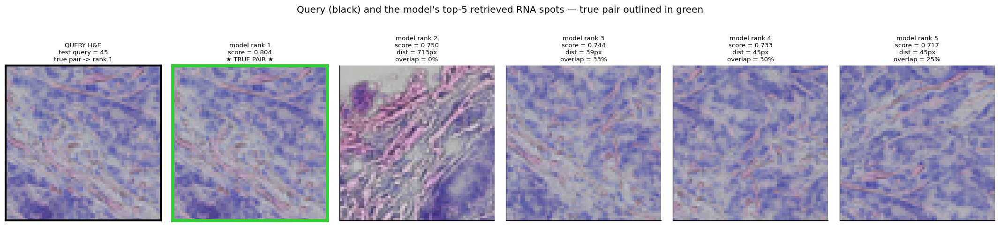

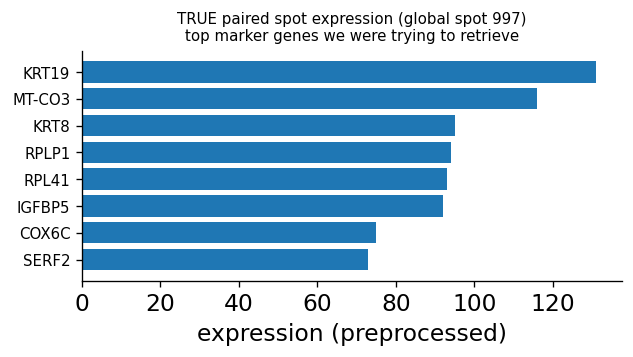


True paired spot — top genes:
  gene  value
 KRT19  131.0
MT-CO3  116.0
  KRT8   95.0
 RPLP1   94.0
 RPL41   93.0
IGFBP5   92.0
 COX6C   75.0
 SERF2   73.0


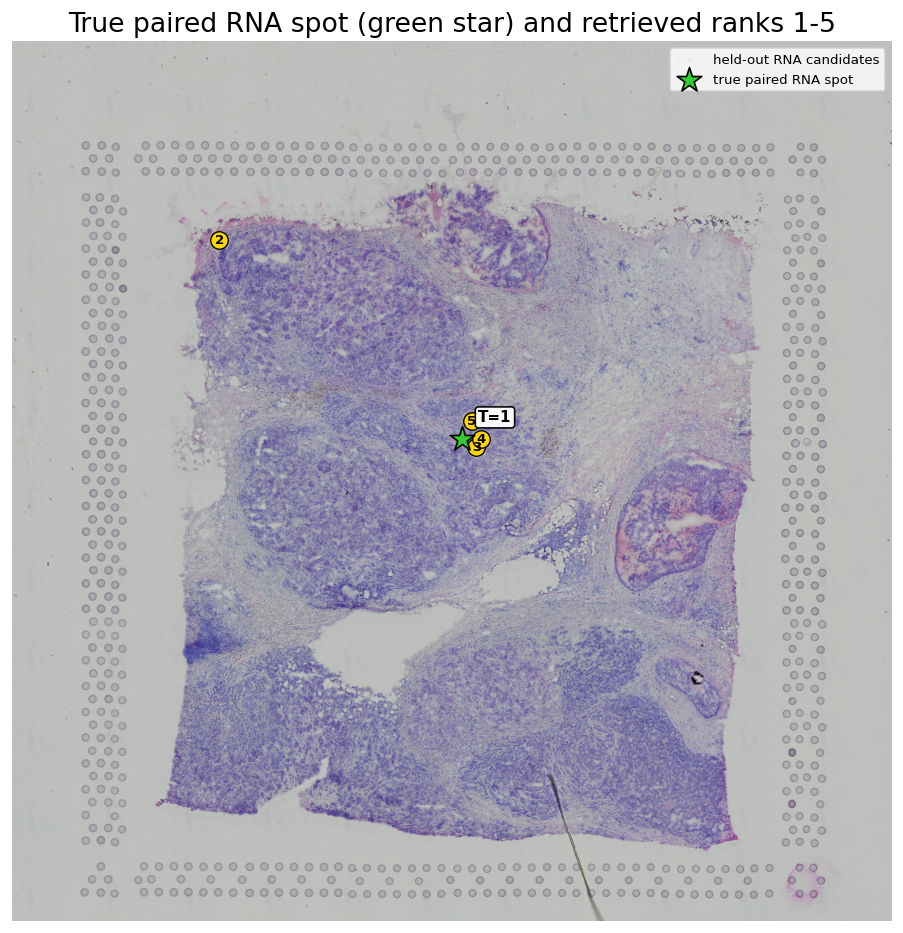


EXAMPLE 2 | held-out query = 77 | true RNA rank = 1


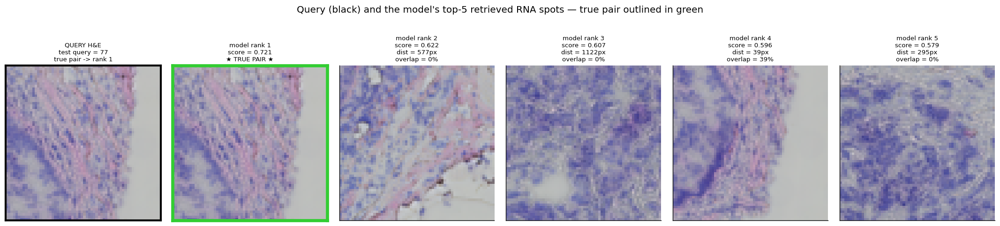

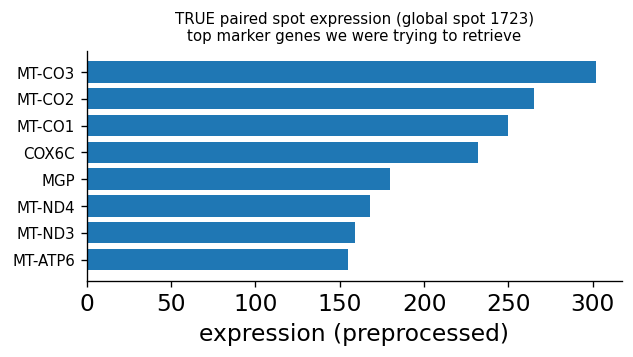


True paired spot — top genes:
   gene  value
 MT-CO3  302.0
 MT-CO2  265.0
 MT-CO1  250.0
  COX6C  232.0
    MGP  180.0
 MT-ND4  168.0
 MT-ND3  159.0
MT-ATP6  155.0


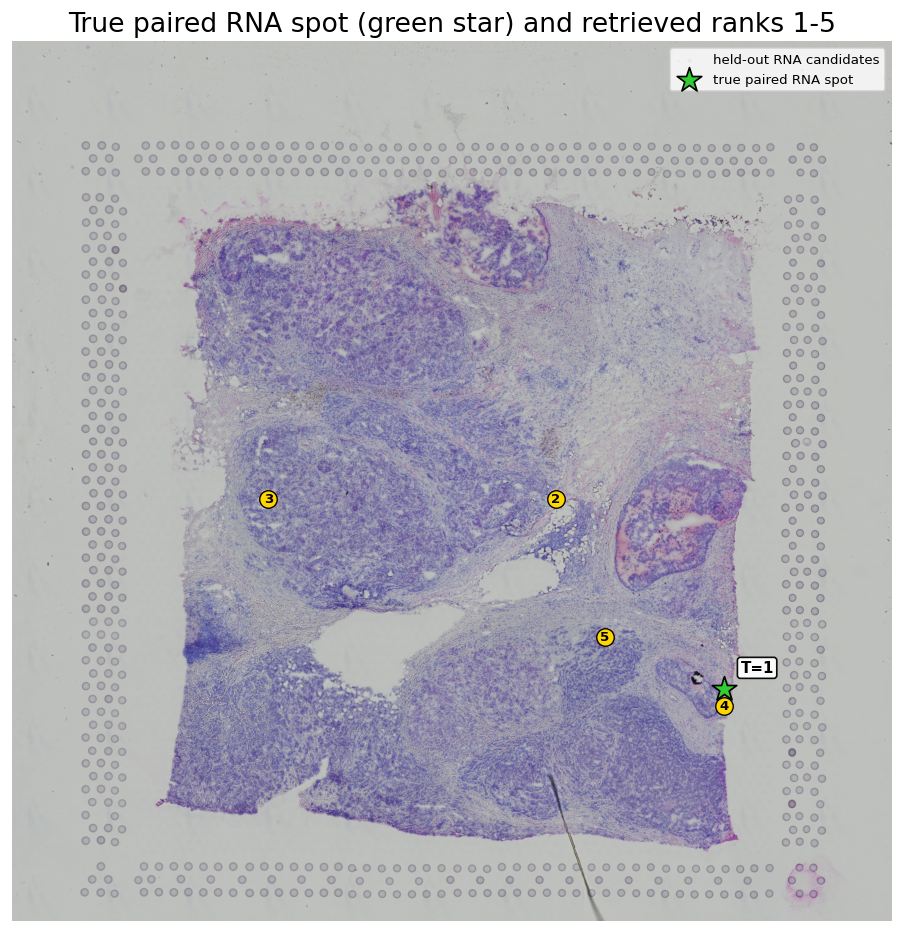


EXAMPLE 3 | held-out query = 0 | true RNA rank = 7


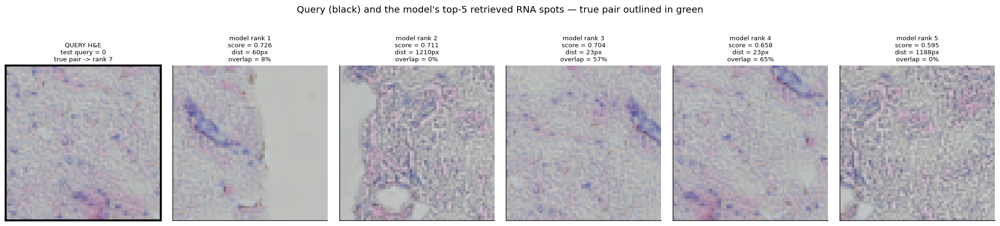

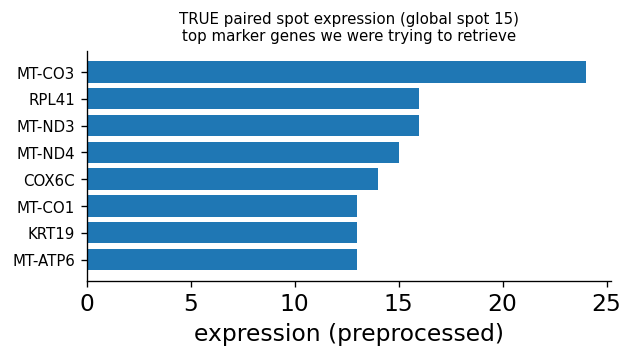


True paired spot — top genes:
   gene  value
 MT-CO3   24.0
  RPL41   16.0
 MT-ND3   16.0
 MT-ND4   15.0
  COX6C   14.0
 MT-CO1   13.0
  KRT19   13.0
MT-ATP6   13.0


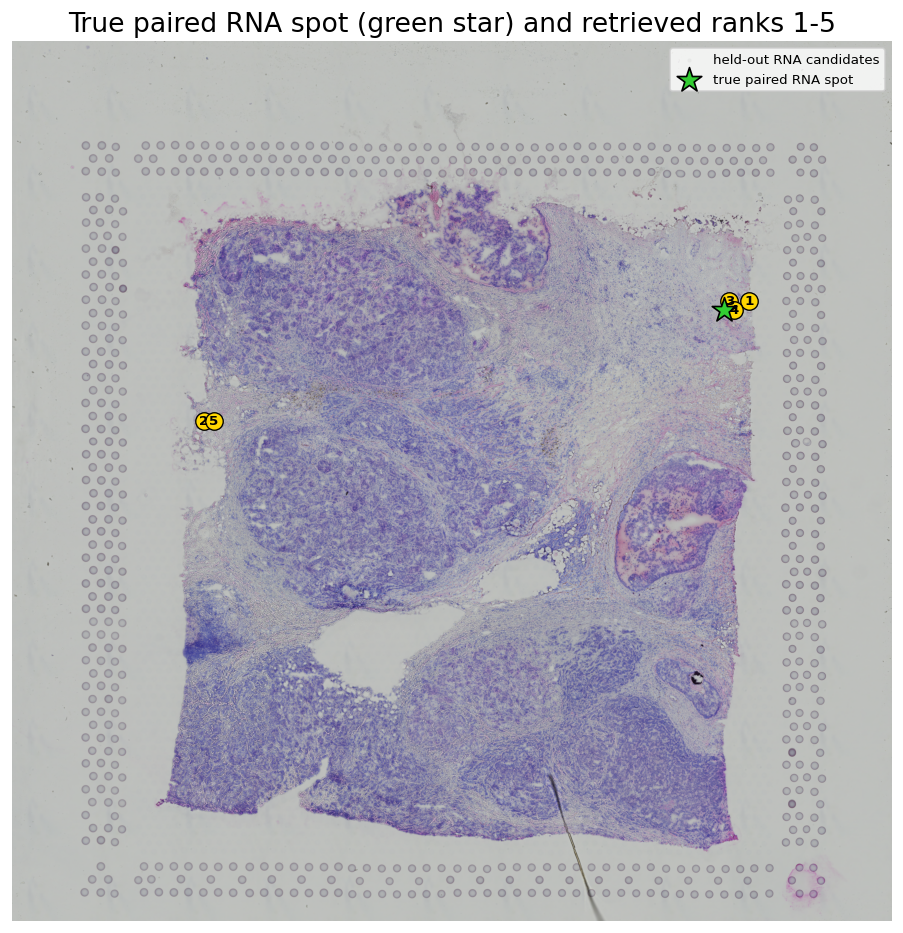


EXAMPLE 4 | held-out query = 1 | true RNA rank = 4


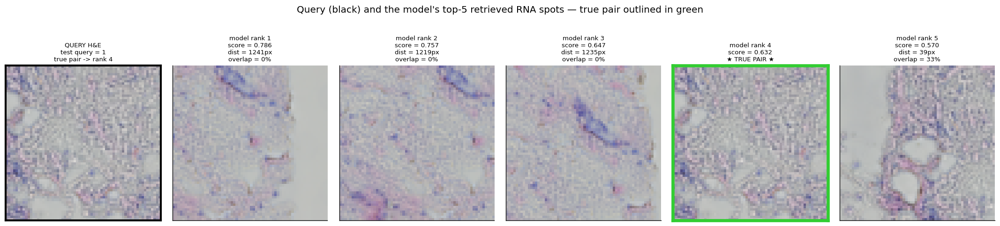

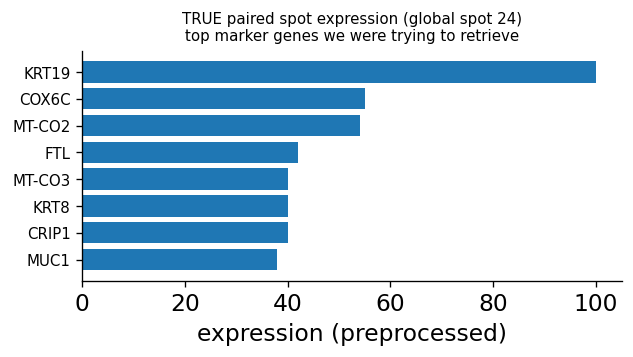


True paired spot — top genes:
  gene  value
 KRT19  100.0
 COX6C   55.0
MT-CO2   54.0
   FTL   42.0
MT-CO3   40.0
  KRT8   40.0
 CRIP1   40.0
  MUC1   38.0


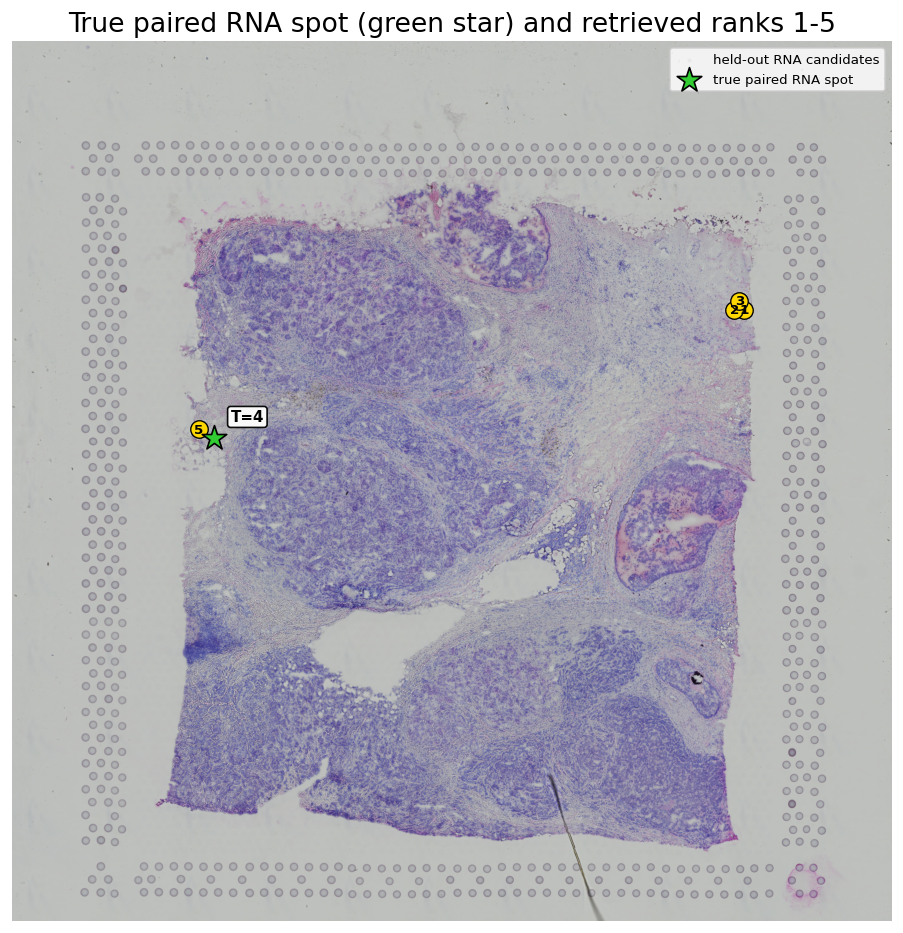


EXAMPLE 5 | held-out query = 86 | true RNA rank = 142


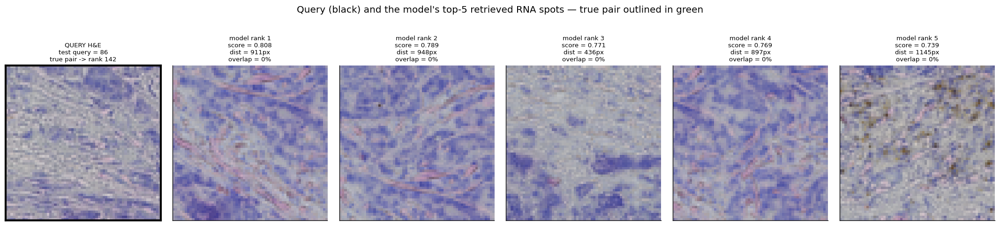

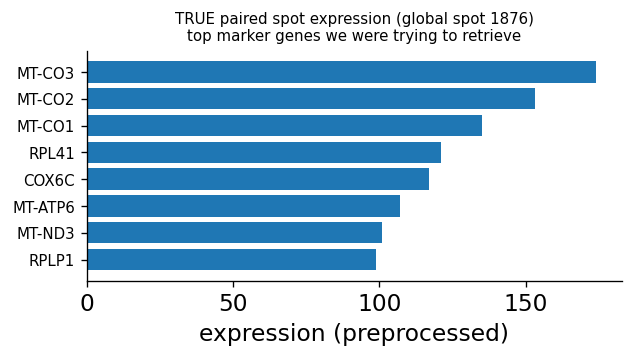


True paired spot — top genes:
   gene  value
 MT-CO3  174.0
 MT-CO2  153.0
 MT-CO1  135.0
  RPL41  121.0
  COX6C  117.0
MT-ATP6  107.0
 MT-ND3  101.0
  RPLP1   99.0


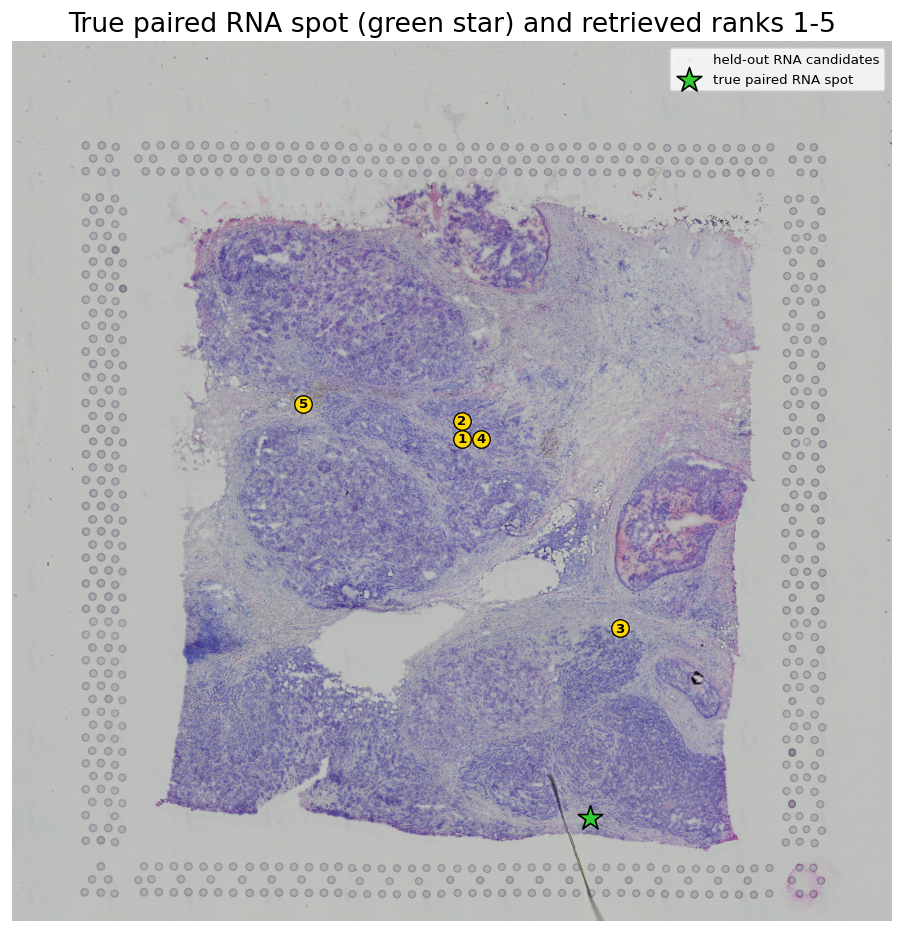

In [22]:
# ============================================================
# 11.6B — Inspect held-out H&E -> RNA retrieval examples
# ============================================================
#
# For each selected H&E query this cell produces:
#
# Figure 1 (one row):
#   [ QUERY H&E ] [ model rank 1 ] [ rank 2 ] ... [ rank 5 ]
#   - black border  = the query patch
#   - green border  = whichever retrieved panel IS the true pair
#   - each retrieved panel reports score, spatial distance, and
#     physical crop-overlap with the query (leakage diagnostic)
#
# Figure 2 (text):
#   The TRUE paired spot's top marker genes — i.e. the expression
#   profile we were actually trying to retrieve. (In image->RNA
#   retrieval the true pair's *image* is the query itself, so the
#   meaningful "truth" is its expression, not a duplicate picture.)
#
# Figure 3 (whole slide):
#   green star = true paired RNA spot
#   T=rank     = annotation if the true spot is among ranks 1-5
#   gold circles = the other retrieved RNA candidates
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import torch
import pandas as pd


# ------------------------------------------------------------
# 0 — Check required objects exist
# ------------------------------------------------------------
required_names = [
    "test_scores",          # (n_test_img, n_test_rna) similarity matrix
    "test_global_idx",      # maps test position -> global spot index
    "image_to_rna_ranks",   # rank of the true RNA pair for each image query
    "test_loader",
    "crop_he_patch",
    "hires_image",
    "coords_hires",
    "adata",
]
missing_names = [n for n in required_names if n not in globals()]
if missing_names:
    raise RuntimeError(
        "Missing required objects:\n"
        f"{missing_names}\n\n"
        "Run the held-out retrieval evaluation cells first."
    )


# ------------------------------------------------------------
# 1 — Config
# ------------------------------------------------------------
TOP_K = 5
N_GENES_SHOWN = 8

# Use the exact patch size the test DataLoader / model used.
EVAL_PATCH_SIZE = int(test_loader.dataset.patch_size)
print(f"Using model/test patch size: {EVAL_PATCH_SIZE} x {EVAL_PATCH_SIZE} hires px")


# ------------------------------------------------------------
# 2 — Normalize ranks to a NumPy array
# ------------------------------------------------------------
if torch.is_tensor(image_to_rna_ranks):
    image_to_rna_ranks_np = image_to_rna_ranks.detach().cpu().numpy()
else:
    image_to_rna_ranks_np = np.asarray(image_to_rna_ranks)

n_test = len(test_global_idx)


# ------------------------------------------------------------
# 3 — Helpers
# ------------------------------------------------------------
def square_crop_overlap_fraction(centre_a_xy, centre_b_xy, patch_size):
    """Fraction of shared image pixels between two equal-size square crops.

    0.0 = disjoint, 1.0 = identical centres. This is the leakage diagnostic:
    if a retrieved spot overlaps the query heavily, retrieval is partly
    trivial near-duplicate matching rather than genuine cross-modal learning.
    """
    dx = abs(float(centre_a_xy[0]) - float(centre_b_xy[0]))
    dy = abs(float(centre_a_xy[1]) - float(centre_b_xy[1]))
    overlap_w = max(0.0, patch_size - dx)
    overlap_h = max(0.0, patch_size - dy)
    return (overlap_w * overlap_h) / (patch_size ** 2)


def expression_vector(spot_idx):
    """Return one spot's expression vector as a dense 1D NumPy array."""
    x = adata.X[spot_idx]
    if hasattr(x, "toarray"):
        x = x.toarray()
    return np.asarray(x).ravel()


def top_expressed_genes(spot_idx, n_top_genes=N_GENES_SHOWN):
    """Top expressed genes at one spot, as a tidy DataFrame."""
    x = expression_vector(spot_idx)
    top_gene_idx = np.argsort(x)[-n_top_genes:][::-1]
    return pd.DataFrame(
        {
            "gene": np.asarray(adata.var_names)[top_gene_idx],
            "value": x[top_gene_idx],
        }
    )


# ------------------------------------------------------------
# 4 — Select 5 representative queries: 2 easy, 2 medium, 1 hard
# ------------------------------------------------------------
exact_positions = np.where(image_to_rna_ranks_np == 1)[0]
medium_positions = np.where(
    (image_to_rna_ranks_np > 1) & (image_to_rna_ranks_np <= 10)
)[0]
hard_positions = np.where(image_to_rna_ranks_np > 10)[0]

query_positions_to_show = []


def add_unique_positions(candidate_positions, maximum_to_add):
    added = 0
    for position in candidate_positions:
        position = int(position)
        if position not in query_positions_to_show:
            query_positions_to_show.append(position)
            added += 1
        if added >= maximum_to_add:
            break


add_unique_positions(exact_positions, maximum_to_add=2)      # 2 easy
add_unique_positions(medium_positions, maximum_to_add=2)     # 2 medium
if len(hard_positions) > 0:                                  # 1 hard (worst rank)
    worst_position = hard_positions[
        np.argmax(image_to_rna_ranks_np[hard_positions])
    ]
    add_unique_positions([worst_position], maximum_to_add=1)

# Fill any remaining slots, but only if buckets were too small.
for position in np.argsort(image_to_rna_ranks_np):
    if len(query_positions_to_show) >= 5:
        break
    add_unique_positions([position], maximum_to_add=1)

query_positions_to_show = query_positions_to_show[:5]

print("\nFive selected held-out H&E queries")
print("-" * 72)
for example_number, query_pos in enumerate(query_positions_to_show, start=1):
    print(
        f"Example {example_number}: test query = {query_pos:4d} | "
        f"true RNA rank = {int(image_to_rna_ranks_np[query_pos]):4d}"
    )


# ------------------------------------------------------------
# 5 — Plot each example
# ------------------------------------------------------------
for example_number, query_pos in enumerate(query_positions_to_show, start=1):
    print("\n" + "=" * 90)
    print(
        f"EXAMPLE {example_number} | held-out query = {query_pos} | "
        f"true RNA rank = {int(image_to_rna_ranks_np[query_pos])}"
    )
    print("=" * 90)

    # ----- rank every held-out RNA candidate for this image query -----
    ranked_candidate_positions = (
        torch.argsort(test_scores[query_pos], descending=True)
        .detach()
        .cpu()
        .numpy()
    )
    ranked_scores = (
        test_scores[query_pos, ranked_candidate_positions].detach().cpu().numpy()
    )

    displayed_positions = ranked_candidate_positions[:TOP_K]
    displayed_scores = ranked_scores[:TOP_K]
    displayed_global_idx = test_global_idx[displayed_positions]
    displayed_ranks = np.arange(1, TOP_K + 1)

    query_global_idx = int(test_global_idx[query_pos])
    true_pair_rank = int(image_to_rna_ranks_np[query_pos])

    # The query H&E patch (this is also the true pair's image, by location).
    query_patch = crop_he_patch(
        image=hires_image,
        centre_xy=coords_hires[query_global_idx],
        patch_size=EVAL_PATCH_SIZE,
    )

    # ========================================================
    # Figure 1 — Query | model rank 1 ... rank 5
    # ========================================================
    fig, axes = plt.subplots(
        1, TOP_K + 1, figsize=(3.0 * (TOP_K + 1), 4.2)
    )

    # Panel 0: the query (black border)
    axes[0].imshow(query_patch)
    axes[0].set_title(
        f"QUERY H&E\ntest query = {query_pos}\n"
        f"true pair -> rank {true_pair_rank}",
        fontsize=8,
    )
    axes[0].set_xticks([]); axes[0].set_yticks([])
    for s in axes[0].spines.values():
        s.set_visible(True); s.set_color("black"); s.set_linewidth(2.5)

    # Panels 1..K: the model's top-K retrieved RNA spots
    for ax, rank, candidate_global_idx, score in zip(
        axes[1:], displayed_ranks, displayed_global_idx, displayed_scores
    ):
        candidate_global_idx = int(candidate_global_idx)

        candidate_patch = crop_he_patch(
            image=hires_image,
            centre_xy=coords_hires[candidate_global_idx],
            patch_size=EVAL_PATCH_SIZE,
        )

        is_true_pair = (candidate_global_idx == query_global_idx)
        distance_hires = float(
            np.linalg.norm(
                coords_hires[candidate_global_idx] - coords_hires[query_global_idx]
            )
        )
        overlap_fraction = square_crop_overlap_fraction(
            coords_hires[candidate_global_idx],
            coords_hires[query_global_idx],
            EVAL_PATCH_SIZE,
        )

        ax.imshow(candidate_patch)
        ax.set_xticks([]); ax.set_yticks([])

        title = f"model rank {rank}\nscore = {score:.3f}"
        if is_true_pair:
            title += "\n★ TRUE PAIR ★"
        else:
            title += (
                f"\ndist = {distance_hires:.0f}px"
                f"\noverlap = {100 * overlap_fraction:.0f}%"
            )
        ax.set_title(title, fontsize=8)

        if is_true_pair:
            for s in ax.spines.values():
                s.set_visible(True); s.set_color("limegreen"); s.set_linewidth(4)

    plt.suptitle(
        "Query (black) and the model's top-5 retrieved RNA spots — "
        "true pair outlined in green",
        y=1.04, fontsize=12,
    )
    plt.tight_layout()
    plt.show()

    # ========================================================
    # Figure 2 — the TRUE spot's expression (what we wanted to retrieve)
    # ========================================================
    true_top_genes = top_expressed_genes(query_global_idx, n_top_genes=N_GENES_SHOWN)

    fig, ax = plt.subplots(figsize=(5.5, 3.2))
    y = np.arange(len(true_top_genes))[::-1]
    ax.barh(y, true_top_genes["value"].values)
    ax.set_yticks(y)
    ax.set_yticklabels(true_top_genes["gene"].values, fontsize=9)
    ax.set_xlabel("expression (preprocessed)")
    ax.set_title(
        f"TRUE paired spot expression (global spot {query_global_idx})\n"
        "top marker genes we were trying to retrieve",
        fontsize=9,
    )
    plt.tight_layout()
    plt.show()

    # Also print it for the record.
    print("\nTrue paired spot — top genes:")
    print(true_top_genes.to_string(index=False))

    # ========================================================
    # Figure 3 — whole-slide retrieval map
    # ========================================================
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(hires_image)

    # All held-out candidates (faint)
    ax.scatter(
        coords_hires[test_global_idx, 0],
        coords_hires[test_global_idx, 1],
        s=6, c="lightgray", alpha=0.30, linewidths=0,
        label="held-out RNA candidates",
    )

    # True spot (green star)
    ax.scatter(
        coords_hires[query_global_idx, 0],
        coords_hires[query_global_idx, 1],
        s=240, c="limegreen", edgecolors="black", linewidths=1.0,
        marker="*", zorder=7, label="true paired RNA spot",
    )

    # Retrieved ranks 1..K
    for rank, candidate_global_idx in zip(displayed_ranks, displayed_global_idx):
        candidate_global_idx = int(candidate_global_idx)
        x_coord = coords_hires[candidate_global_idx, 0]
        y_coord = coords_hires[candidate_global_idx, 1]
        is_true_pair = (candidate_global_idx == query_global_idx)

        if is_true_pair:
            # Don't cover the star; annotate its rank instead.
            ax.annotate(
                f"T={rank}",
                xy=(x_coord, y_coord),
                xytext=(10, 10), textcoords="offset points",
                fontsize=9, fontweight="bold", color="black",
                bbox={"boxstyle": "round,pad=0.2", "facecolor": "white",
                      "edgecolor": "black", "alpha": 0.95},
                zorder=9,
            )
        else:
            ax.scatter(
                x_coord, y_coord, s=110, c="gold",
                edgecolors="black", linewidths=0.8, zorder=6,
            )
            ax.text(
                x_coord, y_coord, str(rank),
                ha="center", va="center", fontsize=8,
                fontweight="bold", color="black", zorder=8,
            )

    ax.set_title("True paired RNA spot (green star) and retrieved ranks 1-5")
    ax.legend(loc="upper right", fontsize=8)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

Resolution sweep (number of clusters):
----------------------------------------
  resolution 0.2  ->   5 clusters
  resolution 0.5  ->   9 clusters
  resolution 1.0  ->  13 clusters
  resolution 2.0  ->  21 clusters

Using clustering at resolution 0.2 (flavor=igraph) ...
  -> 5 clusters

RETRIEVAL METRICS (test split, image -> RNA)
Test spots:                    193
Clusters in test set:          5  (resolution 0.2)

Exact-spot retrieval (pessimistic on redundant tissue):
  Recall@1:                    0.057
  Recall@5:                    0.176

Same-cluster retrieval (right TISSUE TYPE?):
  Same-cluster Recall@1:       0.648   (chance ~ 0.298)
  Same-cluster Recall@5:       0.839   (chance ~ 0.298)

Expression similarity of rank-1 retrieved spot:
  Median Pearson (retrieved vs true): 0.885
  Median Pearson (random baseline):   0.774


/home/tiamheydari/anaconda3/envs/nn_copy/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


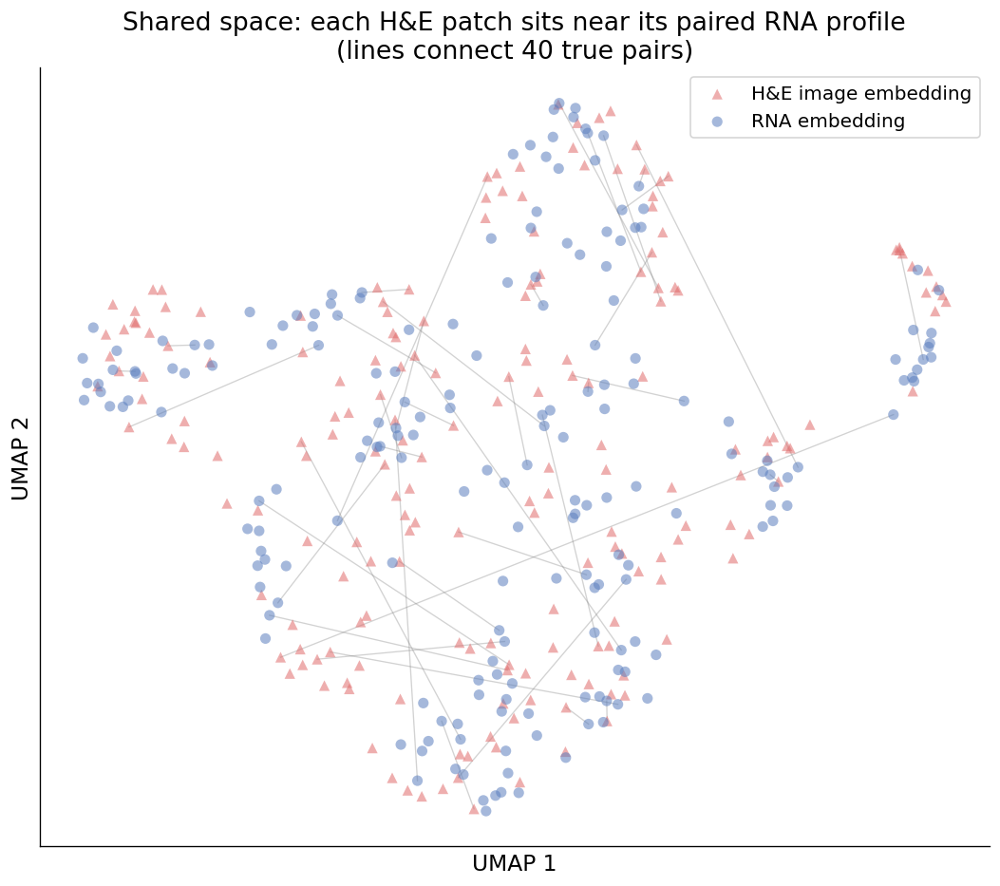

/tmp/ipykernel_4020300/4238105595.py:226: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("tab20", max(len(uniq), 1))


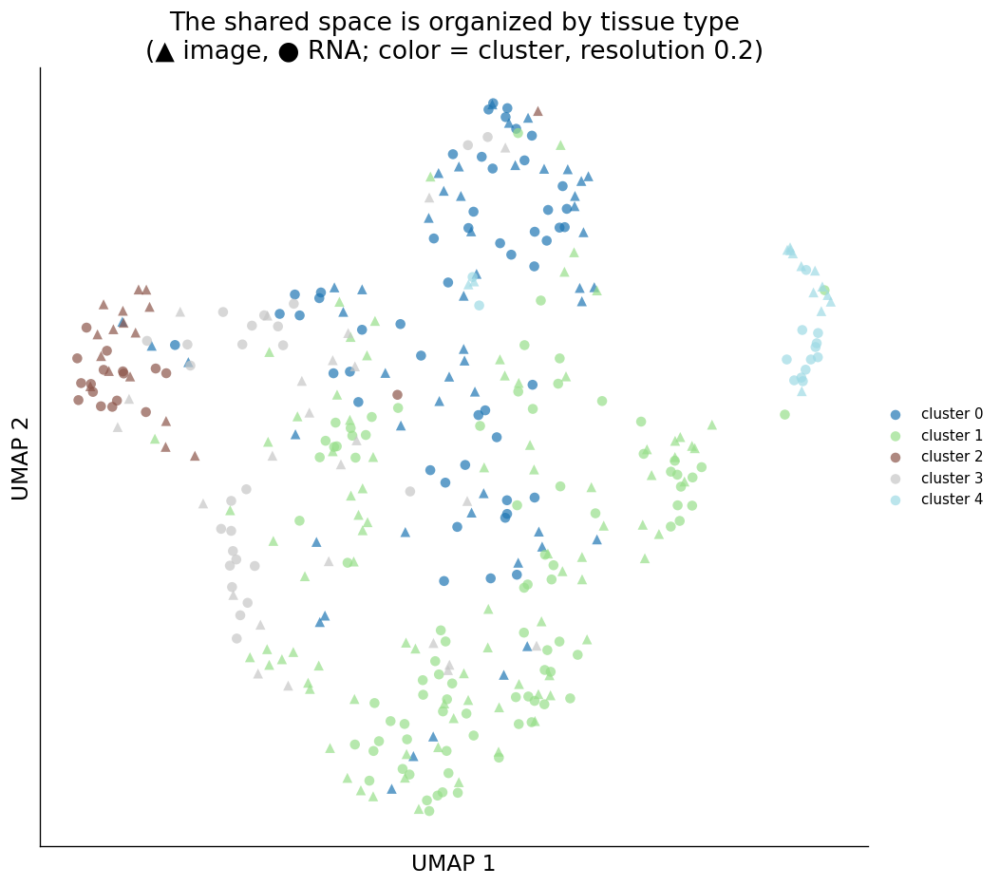

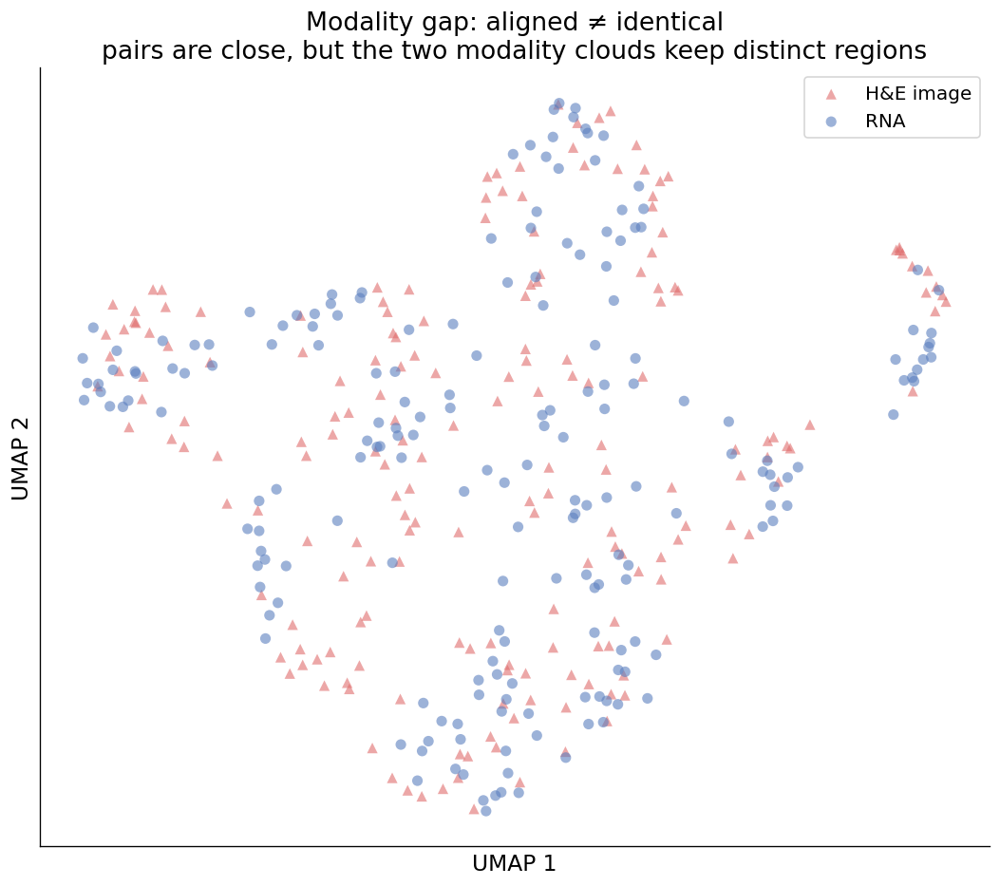

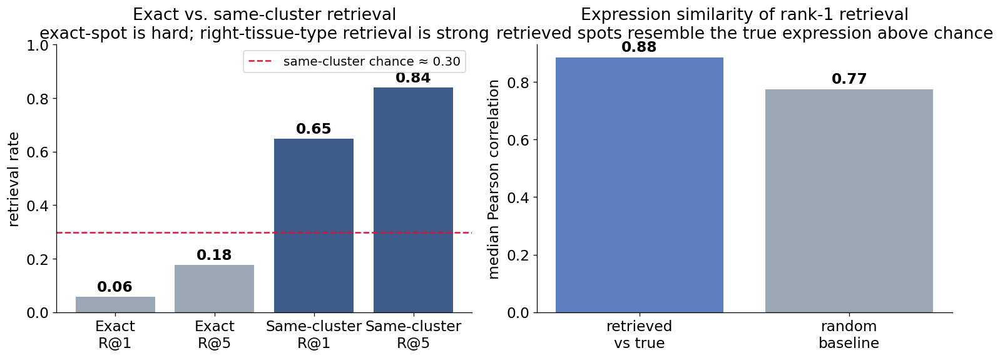


SUGGESTED SLIDE CAPTION
"On held-out tissue, contrastive alignment retrieves the correct tissue
 type 65% of the time at rank 1 (chance 30%), and the
 retrieved expression matches the truth (Pearson 0.88) far above
 the random baseline (0.77) — even though retrieving the single
 exact spot is intrinsically hard on spatially redundant tissue."


In [23]:
# ============================================================
# 11.7 + 11.8 — Biological retrieval metrics + presentation figures
# ============================================================
#
# One self-contained cell. Computes the honest, biologically
# meaningful retrieval metrics AND the slide-ready figures.
#
# FIX in this version: clustering now actually responds to
# CLUSTER_RESOLUTION. The previous version skipped reclustering
# when the column already existed, so changing resolution did
# nothing. Now the cluster column is resolution-stamped and an
# explicit Leiden flavor is used so resolution takes effect on
# current scanpy.
#
# Requires from earlier cells:
#   encode_all_pairs, test_loader, recall_at_k, adata, np, torch, pd
#   (trained best checkpoint must be loaded, i.e. 10.4 has run)
# ============================================================

import numpy as np
import torch
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import scanpy as sc


# ============================================================
# CONFIG — everything you might want to tune is here
# ============================================================

# --- Clustering (defines "same tissue type") ---
CLUSTER_RESOLUTION = 0.20        # higher -> MORE, smaller clusters; lower -> fewer, broader
CLUSTER_N_HVG      = 500       # genes used to build the clustering
CLUSTER_N_PCS      = 30         # PCs for the neighbor graph
LEIDEN_FLAVOR      = "igraph"   # "igraph" (modern scanpy) or "leidenalg" (classic)

# The cluster column is stamped with the resolution, so changing
# CLUSTER_RESOLUTION automatically recomputes a new clustering and
# you can compare resolutions without clobbering each other.
CLUSTER_KEY = f"leiden_res{CLUSTER_RESOLUTION}"

# Set True to print a sweep showing #clusters vs resolution.
SHOW_RESOLUTION_SWEEP = True
SWEEP_RESOLUTIONS = [0.2, 0.5, 1.0, 2.0]

# --- Retrieval metric settings ---
RECALL_KS = (1, 5)              # which k values to report / plot

# --- Figure settings ---
N_PAIR_LINES     = 40           # true-pair connecting lines in Fig A
UMAP_N_NEIGHBORS = 15
UMAP_MIN_DIST    = 0.30
SEED_VIZ         = 0

# --- Presentation style (large fonts for projection) ---
mpl.rcParams.update({
    "font.size": 14, "axes.titlesize": 16, "axes.labelsize": 14,
    "legend.fontsize": 12, "axes.spines.top": False,
    "axes.spines.right": False, "figure.dpi": 120,
})


# ============================================================
# 0 — Build the clustering embedding ONCE (shared by sweep + main)
# ============================================================
def build_cluster_adata(source_adata, n_hvg, n_pcs):
    """Normalize, HVG-select, scale, PCA, neighbors — ready for Leiden."""
    ad = source_adata.copy()
    sc.pp.normalize_total(ad, target_sum=1e4)
    sc.pp.log1p(ad)
    sc.pp.highly_variable_genes(ad, n_top_genes=n_hvg)
    ad = ad[:, ad.var.highly_variable].copy()
    sc.pp.scale(ad, max_value=10)
    sc.pp.pca(ad, n_comps=n_pcs)
    sc.pp.neighbors(ad)
    return ad


def run_leiden(ad, resolution, flavor):
    """Run Leiden with an explicit flavor so resolution actually takes effect."""
    try:
        if flavor == "igraph":
            sc.tl.leiden(ad, resolution=resolution, flavor="igraph",
                         n_iterations=2, directed=False, key_added="_leiden_tmp")
        else:
            sc.tl.leiden(ad, resolution=resolution, flavor="leidenalg",
                         key_added="_leiden_tmp")
    except TypeError:
        # Older scanpy without the flavor kwarg.
        sc.tl.leiden(ad, resolution=resolution, key_added="_leiden_tmp")
    return ad.obs["_leiden_tmp"].values


cluster_ad = build_cluster_adata(adata, CLUSTER_N_HVG, CLUSTER_N_PCS)


# --- Optional: resolution sweep so you can SEE that it varies ---
if SHOW_RESOLUTION_SWEEP:
    print("Resolution sweep (number of clusters):")
    print("-" * 40)
    for R in SWEEP_RESOLUTIONS:
        labels = run_leiden(cluster_ad, R, LEIDEN_FLAVOR)
        print(f"  resolution {R:<4} -> {pd.Series(labels).nunique():3d} clusters")
    print()


# --- Compute the clustering we will actually use ---
print(f"Using clustering at resolution {CLUSTER_RESOLUTION} (flavor={LEIDEN_FLAVOR}) ...")
cluster_labels_used = run_leiden(cluster_ad, CLUSTER_RESOLUTION, LEIDEN_FLAVOR)
adata.obs[CLUSTER_KEY] = cluster_labels_used
n_clusters = pd.Series(cluster_labels_used).nunique()
print(f"  -> {n_clusters} clusters\n")

cluster_labels_all = adata.obs[CLUSTER_KEY].to_numpy()


# ============================================================
# 1 — Encode the test split (trained model must be loaded)
# ============================================================
z_image_test, z_rna_test, test_gidx = encode_all_pairs(test_loader)
z_image_np = z_image_test.numpy()
z_rna_np = z_rna_test.numpy()
n_test = len(test_gidx)

test_clusters = cluster_labels_all[test_gidx]
scores = z_image_test @ z_rna_test.T          # (n_test, n_test), image i -> rna j

X_test = adata.X[test_gidx]
if hasattr(X_test, "toarray"):
    X_test = X_test.toarray()
X_test = np.asarray(X_test, dtype=np.float32)


# ============================================================
# 2 — Metrics
# ============================================================
def same_cluster_recall(scores, labels, k):
    k = min(k, scores.shape[0])
    topk = scores.topk(k=k, dim=1).indices.cpu().numpy()
    return float(np.mean([labels[i] in labels[topk[i]] for i in range(len(labels))]))


def pearson(a, b):
    a = a - a.mean(); b = b - b.mean()
    return float((a @ b) / (np.linalg.norm(a) * np.linalg.norm(b) + 1e-8))


exact = {k: recall_at_k(scores, k) for k in RECALL_KS}
same_cluster = {k: same_cluster_recall(scores, test_clusters, k) for k in RECALL_KS}

_, counts = np.unique(test_clusters, return_counts=True)
chance = float(((counts / counts.sum()) ** 2).sum())

top1 = scores.topk(k=1, dim=1).indices.squeeze(1).cpu().numpy()
rng = np.random.default_rng(SEED_VIZ)
rand_idx = rng.permutation(n_test)
corr_retrieved = float(np.median([pearson(X_test[i], X_test[top1[i]]) for i in range(n_test)]))
corr_random = float(np.median([pearson(X_test[i], X_test[rand_idx[i]]) for i in range(n_test)]))


# ============================================================
# 3 — Print headline numbers
# ============================================================
print("=" * 72)
print("RETRIEVAL METRICS (test split, image -> RNA)")
print("=" * 72)
print(f"Test spots:                    {n_test}")
print(f"Clusters in test set:          {len(np.unique(test_clusters))}  "
      f"(resolution {CLUSTER_RESOLUTION})")
print()
print("Exact-spot retrieval (pessimistic on redundant tissue):")
for k in RECALL_KS:
    print(f"  Recall@{k}:                    {exact[k]:.3f}")
print()
print("Same-cluster retrieval (right TISSUE TYPE?):")
for k in RECALL_KS:
    print(f"  Same-cluster Recall@{k}:       {same_cluster[k]:.3f}   (chance ~ {chance:.3f})")
print()
print("Expression similarity of rank-1 retrieved spot:")
print(f"  Median Pearson (retrieved vs true): {corr_retrieved:.3f}")
print(f"  Median Pearson (random baseline):   {corr_random:.3f}")


# ============================================================
# 4 — Joint UMAP of both modalities
# ============================================================
try:
    import umap
    reducer = umap.UMAP(n_neighbors=UMAP_N_NEIGHBORS, min_dist=UMAP_MIN_DIST,
                        random_state=SEED_VIZ)
    emb = reducer.fit_transform(np.vstack([z_image_np, z_rna_np]))
    proj_name = "UMAP"
except Exception as e:
    print(f"\nUMAP unavailable ({e}); using PCA for the 2-D view.")
    from sklearn.decomposition import PCA
    emb = PCA(n_components=2, random_state=SEED_VIZ).fit_transform(
        np.vstack([z_image_np, z_rna_np]))
    proj_name = "PCA"

emb_image = emb[:n_test]
emb_rna = emb[n_test:]


# ---- Fig A: paired overlay with true-pair lines ----
fig, ax = plt.subplots(figsize=(9, 8))
ax.scatter(emb_image[:, 0], emb_image[:, 1], marker="^", s=45,
           c="#E06C6C", alpha=0.55, edgecolors="none", label="H&E image embedding")
ax.scatter(emb_rna[:, 0], emb_rna[:, 1], marker="o", s=45,
           c="#5B7FBF", alpha=0.55, edgecolors="none", label="RNA embedding")
sample = rng.choice(n_test, size=min(N_PAIR_LINES, n_test), replace=False)
for i in sample:
    ax.plot([emb_image[i, 0], emb_rna[i, 0]], [emb_image[i, 1], emb_rna[i, 1]],
            c="gray", alpha=0.35, linewidth=0.8, zorder=0)
ax.set_title(f"Shared space: each H&E patch sits near its paired RNA profile\n"
             f"(lines connect {min(N_PAIR_LINES, n_test)} true pairs)")
ax.set_xlabel(f"{proj_name} 1"); ax.set_ylabel(f"{proj_name} 2")
ax.legend(loc="best", frameon=True)
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(); plt.show()


# ---- Fig B: same UMAP colored by tissue cluster ----
fig, ax = plt.subplots(figsize=(9, 8))
uniq = np.unique(test_clusters)
cmap = plt.cm.get_cmap("tab20", max(len(uniq), 1))
for ci, cl in enumerate(uniq):
    m = test_clusters == cl
    ax.scatter(emb_image[m, 0], emb_image[m, 1], marker="^", s=40,
               color=cmap(ci), alpha=0.7, edgecolors="none")
    ax.scatter(emb_rna[m, 0], emb_rna[m, 1], marker="o", s=40,
               color=cmap(ci), alpha=0.7, edgecolors="none", label=f"cluster {cl}")
ax.set_title(f"The shared space is organized by tissue type\n"
             f"(▲ image, ● RNA; color = cluster, resolution {CLUSTER_RESOLUTION})")
ax.set_xlabel(f"{proj_name} 1"); ax.set_ylabel(f"{proj_name} 2")
ax.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=9, frameon=False)
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(); plt.show()


# ---- Fig C: modality gap (colored by modality) ----
fig, ax = plt.subplots(figsize=(9, 8))
ax.scatter(emb_image[:, 0], emb_image[:, 1], marker="^", s=45,
           c="#E06C6C", alpha=0.6, edgecolors="none", label="H&E image")
ax.scatter(emb_rna[:, 0], emb_rna[:, 1], marker="o", s=45,
           c="#5B7FBF", alpha=0.6, edgecolors="none", label="RNA")
ax.set_title("Modality gap: aligned ≠ identical\n"
             "pairs are close, but the two modality clouds keep distinct regions")
ax.set_xlabel(f"{proj_name} 1"); ax.set_ylabel(f"{proj_name} 2")
ax.legend(loc="best", frameon=True)
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(); plt.show()


# ---- Fig D: metric bars ----
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
bar_labels, bar_vals, bar_colors = [], [], []
for k in RECALL_KS:
    bar_labels.append(f"Exact\nR@{k}"); bar_vals.append(exact[k]); bar_colors.append("#9AA7B4")
for k in RECALL_KS:
    bar_labels.append(f"Same-cluster\nR@{k}"); bar_vals.append(same_cluster[k]); bar_colors.append("#3E5C8A")
bars = ax.bar(bar_labels, bar_vals, color=bar_colors)
ax.axhline(chance, color="crimson", linestyle="--", linewidth=1.5,
           label=f"same-cluster chance ≈ {chance:.2f}")
ax.legend()
for b, v in zip(bars, bar_vals):
    ax.text(b.get_x() + b.get_width()/2, v + 0.01, f"{v:.2f}",
            ha="center", va="bottom", fontweight="bold")
ax.set_ylim(0, max(1.0, max(bar_vals) * 1.15))
ax.set_ylabel("retrieval rate")
ax.set_title("Exact vs. same-cluster retrieval\n"
             "exact-spot is hard; right-tissue-type retrieval is strong")

ax = axes[1]
bars = ax.bar(["retrieved\nvs true", "random\nbaseline"],
              [corr_retrieved, corr_random], color=["#5B7FBF", "#9AA7B4"])
for b, v in zip(bars, [corr_retrieved, corr_random]):
    ax.text(b.get_x() + b.get_width()/2, v + 0.01, f"{v:.2f}",
            ha="center", va="bottom", fontweight="bold")
ax.set_ylabel("median Pearson correlation")
ax.set_title("Expression similarity of rank-1 retrieval\n"
             "retrieved spots resemble the true expression above chance")

plt.tight_layout(); plt.show()


# ============================================================
# 5 — Slide caption with the actual numbers
# ============================================================
k_head = RECALL_KS[0]
print()
print("=" * 72)
print("SUGGESTED SLIDE CAPTION")
print("=" * 72)
print(f'"On held-out tissue, contrastive alignment retrieves the correct tissue')
print(f' type {same_cluster[k_head]*100:.0f}% of the time at rank {k_head} (chance {chance*100:.0f}%), and the')
print(f' retrieved expression matches the truth (Pearson {corr_retrieved:.2f}) far above')
print(f' the random baseline ({corr_random:.2f}) — even though retrieving the single')
print(f' exact spot is intrinsically hard on spatially redundant tissue."')